## Capstone Project 1 Notes coding: 

### Importing libraries

In [14]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt
import matplotlib as mpl
import warnings
warnings.filterwarnings("ignore")

### Loading the dataset

In [15]:
# Read LTC data
SMD= pd.read_csv('Data/df_final.csv')
SMD_az= pd.read_csv('Data/df_final_az.csv')

# Read Data Dictionary
data_dict = pd.read_csv('Data/data_dict2.csv', encoding = "ISO-8859-1")
data_dict.shape

print(SMD.shape, SMD['SU_ID'].nunique(), SMD_az.shape, SMD_az['SU_ID'].nunique())

(24666, 67) 24666 (24666, 29) 24666


#### Head of Dataset

In [16]:
#First 5 Records
SMD.head(2)

,SU_ID,FINALWT,COG_IND,SURV_MODE,LTC1A,LTC1B,LTC1C,LTC1D,LTC1E,LTC1F,...,POLITICS,MARITAL,AGEGRP,EDUCATION,RACETH,GENDER,HHINCOME,EMPSTATUS,STATE,CENSUS
0,1.0,0.354628,1.0,(2) Web interview,(2) Quite a bit,(2) Quite a bit,(2) Quite a bit,(2) Quite a bit,(5) None at all,(5) None at all,...,(2) Republican,(2) Widowed,(2) 30 to 39,(4) Bachelor's degree or higher,"(2) African American, non-Hispanic",(2) Female,"(9) $150,000 or more",(2) Not employed,PA. Pennsylvania,REGION_(2) Midwest
1,2.0,3.539195,1.0,(2) Web interview,(3) A moderate amount,(3) A moderate amount,(3) A moderate amount,(2) Quite a bit,(3) A moderate amount,(3) A moderate amount,...,(2) Republican,(2) Widowed,(5) 65 or older,(2) High school graduate,"(2) African American, non-Hispanic",(2) Female,"(3) $20,000 to under $30,000",(2) Not employed,WI. Wisconsin,REGION_(2) Midwest


#### Tail of Dataset

In [17]:
#Last 5 Records
SMD.tail(2)

,SU_ID,FINALWT,COG_IND,SURV_MODE,LTC1A,LTC1B,LTC1C,LTC1D,LTC1E,LTC1F,...,POLITICS,MARITAL,AGEGRP,EDUCATION,RACETH,GENDER,HHINCOME,EMPSTATUS,STATE,CENSUS
24664,24665.0,0.899005,0.0,(2) Web interview,(2) Quite a bit,(2) Quite a bit,(2) Quite a bit,(2) Quite a bit,(2) Quite a bit,(2) Quite a bit,...,(2) Republican,(2) Widowed,(2) 30 to 39,(4) Bachelor's degree or higher,"(2) African American, non-Hispanic",(2) Female,"(2) $10,000 to under $20,000",(2) Not employed,AL. Alabama,REGION_(2) Midwest
24665,24666.0,1.105469,0.0,(2) Web interview,(2) Quite a bit,(2) Quite a bit,(2) Quite a bit,(2) Quite a bit,(2) Quite a bit,(2) Quite a bit,...,(2) Republican,(2) Widowed,(2) 30 to 39,(2) High school graduate,(3) Hispanic,(2) Female,"(6) $50,000 to under $75,000",(2) Not employed,AL. Alabama,REGION_(2) Midwest


#### Display max columns

In [18]:
pd.options.display.max_columns = None

#### Information of Dataset

In [19]:
#Information of dataset
SMD.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24666 entries, 0 to 24665
Data columns (total 67 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   SU_ID      24666 non-null  float64
 1   FINALWT    24666 non-null  float64
 2   COG_IND    24666 non-null  float64
 3   SURV_MODE  24666 non-null  object 
 4   LTC1A      24666 non-null  object 
 5   LTC1B      24666 non-null  object 
 6   LTC1C      24666 non-null  object 
 7   LTC1D      24666 non-null  object 
 8   LTC1E      24666 non-null  object 
 9   LTC1F      24666 non-null  object 
 10  LTC1G      24666 non-null  object 
 11  LTC1H      24666 non-null  object 
 12  LTC1I      24666 non-null  object 
 13  LTC2       24666 non-null  object 
 14  LTC3       23076 non-null  object 
 15  LTC4       24666 non-null  object 
 16  LTC5       23076 non-null  object 
 17  LTC6A      24666 non-null  object 
 18  LTC6B      24666 non-null  object 
 19  LTC7       24666 non-null  object 
 20  LTC8A 

In [20]:
round(SMD.describe().T,2)

,count,mean,std,min,25%,50%,75%,max
SU_ID,24666.0,12333.50,7120.61,1.00,6167.25,12333.5,18499.75,24666.00
FINALWT,24666.0,0.93,0.54,0.03,0.57,0.8,1.18,6.45
COG_IND,24666.0,0.13,0.33,0.00,0.00,0.0,0.00,1.00


In [21]:
SMD.dtypes.value_counts()

object     64
float64     3
dtype: int64

#### Checking duplicates

In [22]:
dups = SMD.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))

Number of duplicate rows = 0


#### Dropping a not required column

In [23]:
# SMD.drop(['SU_ID'] ,axis =1, inplace =True)

In [24]:
SMD.head()

,SU_ID,FINALWT,COG_IND,SURV_MODE,LTC1A,LTC1B,LTC1C,LTC1D,LTC1E,LTC1F,LTC1G,LTC1H,LTC1I,LTC2,LTC3,LTC4,LTC5,LTC6A,LTC6B,LTC7,LTC8A,LTC8B,LTC9,LTC10A,LTC10B,LTC10C,LTC10D,LTC10E,LTC10F,LTC10G,LTC10H,LTC11A,LTC11B,LTC11C,LTC11D,LTC11E,LTC12A,LTC12B,LTC12C,LTC12D,LTC13,LTC14A,LTC14B,LTC14C,LTC14D,LTC14E,LTC14F,LTC14G,LTC15_1,LTC15_2,LTC15_3,LTC15_4,LTC15_5,VIRUS2A,VIRUS2B,APVAX3,APVAX7,POLITICS,MARITAL,AGEGRP,EDUCATION,RACETH,GENDER,HHINCOME,EMPSTATUS,STATE,CENSUS
0,1.0,0.354628,1.0,(2) Web interview,(2) Quite a bit,(2) Quite a bit,(2) Quite a bit,(2) Quite a bit,(5) None at all,(5) None at all,(2) Quite a bit,(5) None at all,(4) Only a little,(2) No,NaN,(2) Friend or family member's home,NaN,(2) No,(2) No,(3) Usually,(3) Moderately concerned,(3) Moderately concerned,(3) Somewhat confident,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,(2) Large responsibility,(2) Large responsibility,(4) Small responsibility,(4) Small responsibility,(4) Small responsibility,(2) Somewhat favor,(2) Somewhat favor,(2) Somewhat favor,(2) Somewhat favor,(2) An important but lower priority,(2) Somewhat favor,(2) Somewhat favor,(2) Somewhat favor,(2) Somewhat favor,(2) Somewhat favor,(4) Somewhat oppose,(2) Somewhat favor,(1) Yes,(1) Yes,(1) Yes,(1) Yes,(1) Yes,(4) Not too worried,(4) Not too worried,(2) No,(2) Probably get a vaccine,(2) Republican,(2) Widowed,(2) 30 to 39,(4) Bachelor's degree or higher,"(2) African American, non-Hispanic",(2) Female,"(9) $150,000 or more",(2) Not employed,PA. Pennsylvania,REGION_(2) Midwest
1,2.0,3.539195,1.0,(2) Web interview,(3) A moderate amount,(3) A moderate amount,(3) A moderate amount,(2) Quite a bit,(3) A moderate amount,(3) A moderate amount,(3) A moderate amount,(3) A moderate amount,(3) A moderate amount,(2) No,(2) No,(2) Friend or family member's home,(3) A moderate amount,(2) No,(2) No,(3) Usually,(3) Moderately concerned,(3) Moderately concerned,(3) Somewhat confident,(3) A moderate amount,(3) A moderate amount,(3) A moderate amount,(5) Not at all,(4) Only a little,(5) Not at all,(3) A moderate amount,(5) Not at all,(3) Moderate responsibility,(4) Small responsibility,(2) Large responsibility,(3) Moderate responsibility,(3) Moderate responsibility,(3) Neither favor nor oppose,(3) Neither favor nor oppose,(3) Neither favor nor oppose,(3) Neither favor nor oppose,(2) An important but lower priority,(4) Somewhat oppose,(4) Somewhat oppose,(3) Neither favor nor oppose,(2) Somewhat favor,(3) Neither favor nor oppose,(3) Neither favor nor oppose,(2) Somewhat favor,(1) Yes,(1) Yes,(1) Yes,(1) Yes,(1) Yes,(4) Not too worried,(4) Not too worried,(2) No,NaN,(2) Republican,(2) Widowed,(5) 65 or older,(2) High school graduate,"(2) African American, non-Hispanic",(2) Female,"(3) $20,000 to under $30,000",(2) Not employed,WI. Wisconsin,REGION_(2) Midwest
2,3.0,0.552162,1.0,(2) Web interview,(3) A moderate amount,(3) A moderate amount,(3) A moderate amount,(3) A moderate amount,(3) A moderate amount,(3) A moderate amount,(3) A moderate amount,(3) A moderate amount,(3) A moderate amount,(2) No,(2) No,(2) Friend or family member's home,(5) None at all,(2) No,(2) No,(2) Sometimes,(3) Moderately concerned,(3) Moderately concerned,(4) Not too confident,(3) A moderate amount,(3) A moderate amount,(3) A moderate amount,(5) Not at all,(3) A moderate amount,(3) A moderate amount,(3) A moderate amount,(3) A moderate amount,(4) Small responsibility,(5) No responsibility at all,(3) Moderate responsibility,(3) Moderate responsibility,(3) Moderate responsibility,(2) Somewhat favor,(2) Somewhat favor,(2) Somewhat favor,(2) Somewhat favor,(2) An important but lower priority,(4) Somewhat oppose,(4) Somewhat oppose,(2) Somewhat favor,(2) Somewhat favor,(2) Somewhat favor,(3) Neither favor nor oppose,(2) Somewhat favor,(1) Yes,(1) Yes,(1) Yes,(1) Yes,(1) Yes,(2) Very worried,(2) Very worried,(2) No,(2) Probably get a vaccine,(2) Republican,(3) Divorced,(3) 40 to 59,(4) Bachelor's degree or higher,(4) Other,(2) Female,"(6) $50,000 to under $75,000",(2) 

#### Checking Missing Values

In [25]:
### Examine missing values
SMD_na = SMD.isna().sum()
SMD_na[SMD_na.values > 0].sort_values(ascending=False) 
# Find out all variables that contain missing values

APVAX7    3347
LTC3      1590
LTC5      1590
LTC10A    1590
LTC10B    1590
LTC10C    1590
LTC10D    1590
LTC10E    1590
LTC10F    1590
LTC10G    1590
LTC10H    1590
dtype: int64

In [26]:
t = pd.DataFrame(SMD_na[SMD_na.values > 0].sort_values(ascending=False))
t['colName'] = t.index
t.columns = ['cnt', 'colName']
t['pct'] = t['cnt']*100/SMD.shape[0]
t

,cnt,colName,pct
APVAX7,3347,APVAX7,13.569286
LTC3,1590,LTC3,6.446120
LTC5,1590,LTC5,6.446120
LTC10A,1590,LTC10A,6.446120
LTC10B,1590,LTC10B,6.446120
LTC10C,1590,LTC10C,6.446120
LTC10D,1590,LTC10D,6.446120
LTC10E,1590,LTC10E,6.446120
LTC10F,1590,LTC10F,6.446120
LTC10G,1590,LTC10G,6.446120


#### Replacing Categorical missing values using mode - All missing features are categorical

In [27]:
missing_cols = SMD_na[SMD_na.values > 0].sort_values(ascending=False).index.to_list()

for i_col in missing_cols:
    modei = SMD[i_col].mode().values[0]
    SMD[i_col].replace(np.nan,modei,inplace=True)

#### Checking if missing values are replaced

In [28]:
nullseries = SMD.isnull().sum()
print(nullseries[nullseries > 0])

Series([], dtype: int64)


#### Checking unique Categorical values

In [29]:
# for column in SMD.columns:
#     if SMD[column].dtype == 'object':
#         print(column.upper(),': ',SMD[column].nunique())
#         print(SMD[column].value_counts().sort_values())
#         print('\n')

#### Checking description of dataset

In [30]:
round(SMD.describe().T,2)

,count,mean,std,min,25%,50%,75%,max
SU_ID,24666.0,12333.50,7120.61,1.00,6167.25,12333.5,18499.75,24666.00
FINALWT,24666.0,0.93,0.54,0.03,0.57,0.8,1.18,6.45
COG_IND,24666.0,0.13,0.33,0.00,0.00,0.0,0.00,1.00


#### Cleaning the Columns

In [31]:
categorical_columns = SMD.select_dtypes(include=['object']).columns.tolist()

#### Checking SURV_MODE Column 

In [32]:
#Checking Valuecounts
SMD['SURV_MODE'].value_counts()

(2) Web interview    24666
Name: SURV_MODE, dtype: int64

#### SURV_MODE has only one value, as all interviews were done through WEB mode. so this feature can be dropped as would not make any impact to the target variable 'COG_IND' 

In [33]:
#making a new column so values can be grouped
SMD.drop(['SURV_MODE'], axis=1, inplace=True)

In [34]:
# #Laptop - As preferred device category
# searchfor=['Laptop']
# SMD['Preferred_device_updated']=np.where(SMD['Preferred_device'].str.contains('|'.join(searchfor)),'Laptop',SMD['Preferred_device_updated'])

# #Mobile - As preferred device category
# searchfor=['Tab','iOS and Android','Android','iOS','Mobile','Android OS','ANDROID','Others','Other']
# SMD['Preferred_device_updated']=np.where(SMD['Preferred_device'].str.contains('|'.join(searchfor)),'Mobile',SMD['Preferred_device_updated'])

# #finally checking value counts
# SMD['Preferred_device_updated'].value_counts()

# #Drop preferred_device
# del SMD['Preferred_device']

# SMD.head()

# #rename it back to same column name
# SMD.rename(columns = {'Preferred_device_updated':'Preferred_device'}, inplace = True)

# SMD.head()

# #### Fixing member_in_family

# SMD['Member_in_family'] = [str(x).replace('Three','3') for x in SMD['Member_in_family']]

# SMD['Member_in_family'].value_counts()

# #### yearly_avg_Outstation_checkins

# SMD['Yearly_avg_outstation_checkins'] = [str(x).replace('*','30') for x in SMD['Yearly_avg_outstation_checkins']]

# SMD['Yearly_avg_outstation_checkins'].value_counts()

# #### Fixing following_company_page

# SMD['Following_company_page'] = [str(x).replace('0','No') for x in SMD['Following_company_page']]

# SMD['Following_company_page'] = [str(x).replace('1','Yes') for x in SMD['Following_company_page']]

# SMD['Following_company_page'].value_counts()

# #### preferred_location_type

# SMD['Preferred_location_type'] = [str(x).replace('Tour  Travel','Tour and Travel') for x in SMD['Preferred_location_type']]

# SMD['Preferred_location_type'].value_counts()

# #### Adult Flag

# SMD['Adult_flag'].value_counts()

# # Making an Assumption: 0 is an Non adult , 1, 2, 3 would be grouped in as an adult 
# SMD['Adult_flag'] = [str(x).replace('2','1') for x in SMD['Adult_flag']]
# SMD['Adult_flag'] = [str(x).replace('3','1') for x in SMD['Adult_flag']]

# SMD['Adult_flag'].value_counts()

# SMD.info()

### Outlier

In [35]:
# First changing COG_IND to categorical type
SMD['COG_IND'] = SMD['COG_IND'].astype(str)

In [36]:
# Firstly, create the seperate dataframe for numerical column
SMD_num = SMD.select_dtypes(include = ['float64', 'int64']) 

#### To visualize if there is an outlier in a dataset

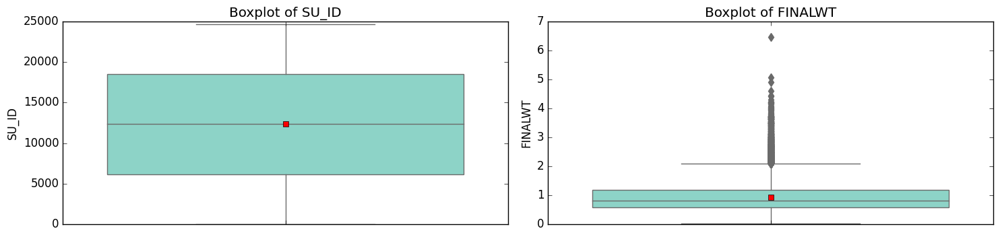

In [37]:
# Boxplot for outlier cheacking -Check to outliers before treating in each features/columns

plt.figure(figsize = (15,20))
plt.style.use('classic')
feature_list = SMD_num.columns
for i in range(len(feature_list)):
    plt.subplot(6, 2, i + 1)
    sns.boxplot(y = SMD_num[feature_list[i]], data = SMD_num, palette="Set3", showmeans=True, fliersize=6, width=0.8, saturation=1.0)
    plt.title('Boxplot of {}'.format(feature_list[i]))
    plt.tight_layout()

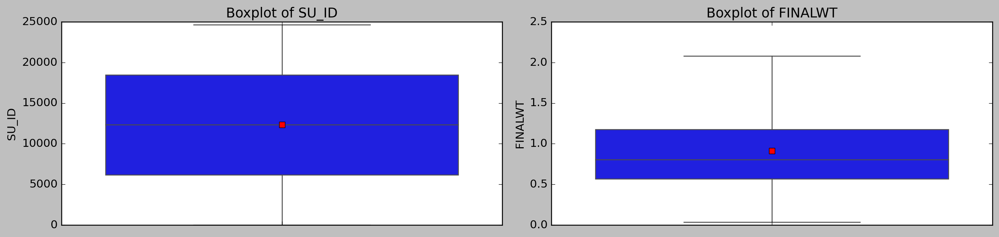

In [38]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

# Sixthly, Cap & floor the values beyond the outlier boundaries for upper and lower boundries
for i in  SMD_num:
    LL, UL = remove_outlier(SMD_num[i])
    SMD_num[i] = np.where(SMD_num[i] > UL, UL, SMD_num[i])
    SMD_num[i] = np.where(SMD_num[i] < LL, LL, SMD_num[i])
    
    # Lastly,
plt.figure(figsize = (15,20), dpi =185)
plt.style.use('classic')
feature_list = SMD_num.columns
for i in range(len(feature_list)):
    plt.subplot(6, 2, i + 1)
    sns.boxplot(y = SMD_num[feature_list[i]], data = SMD_num, color = 'blue', showmeans=True, fliersize=6, width=0.8)
    plt.title('Boxplot of {}'.format(feature_list[i]))
    plt.tight_layout()

#### Target Variable 

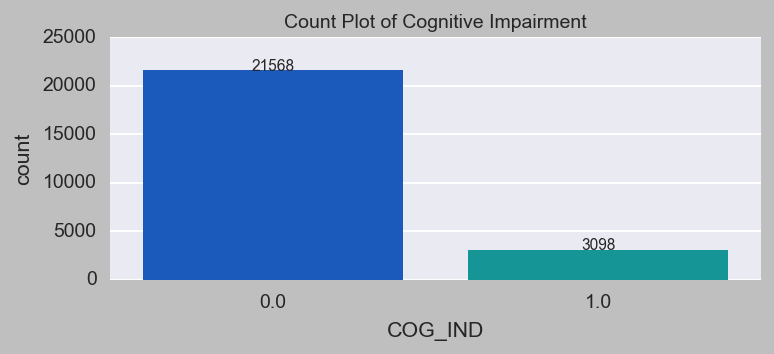

In [39]:
#Count Plot

mpl.rcParams['figure.figsize']=6,3
plt.figure(figsize=(6,3), dpi =140)
plt.style.use('seaborn')
a=sns.countplot(x=SMD['COG_IND'],order = SMD['COG_IND'].value_counts().index,
               linewidth=2,palette="winter",edgecolor = 'none' )
plt.title('Count Plot of Cognitive Impairment',fontsize=10)
plt.tight_layout(pad=2.0, w_pad = 2)
for labels in a.patches:
    a.text(labels.get_x() + labels.get_width()/2,labels.get_height() +0.75,labels.get_height(),horizontalalignment = 'center',fontsize = 8)

Text(0.5, 1.0, 'Pie chart of Product Taken')

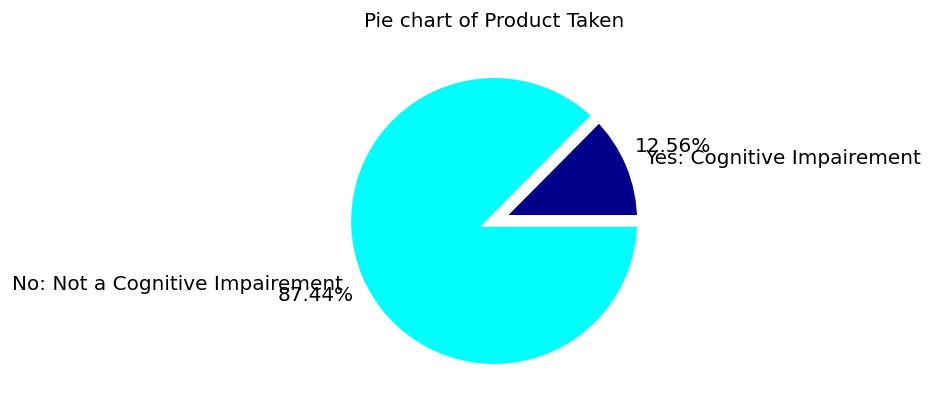

In [40]:
#Pie Chart
plt.figure(figsize=(4,4), dpi =120)
plt.style.use('classic')
Yes =SMD.COG_IND.value_counts()['1.0']
No =SMD.COG_IND.value_counts()['0.0']
names =['Yes: Cognitive Impairement','No: Not a Cognitive Impairement']
size=[Yes,No]
plt.pie(size,labels=names, colors=['darkblue','cyan'],
       autopct ='%.2f%%',pctdistance=1.30,
       wedgeprops ={'linewidth':7,'edgecolor':'white'})
plt.title('Pie chart of Product Taken',fontsize=12)

#### Univariate Analysis

In [41]:
len(categorical_columns)

64

In [42]:
# data_dict[data_dict['Variable']==i_col]['Label'].values[0].split(':')[1].split(']')[0].replace(' [', '')
# data_dict

In [43]:
# tempdf[i_col].str.split(' ', 1, expand=True)[0]

In [44]:
# i_col = 'LTC1A'
# tempdf = SMD[[i_col]].copy()
# tempdf[i_col+'_new'] = tempdf[i_col].str.split(' ', 1, expand=True)[0]
# tempdf[i_col+'_new2'] = tempdf[i_col].str.split(' ', 1, expand=True)[1]
# tempdf
# # legend = list(tempdf[i_col].unique())
# # ' '.join(legend)

# # legn2.replace('(', '').replace(')', '-').replace('/', '_')

NameError: name 'fig' is not defined

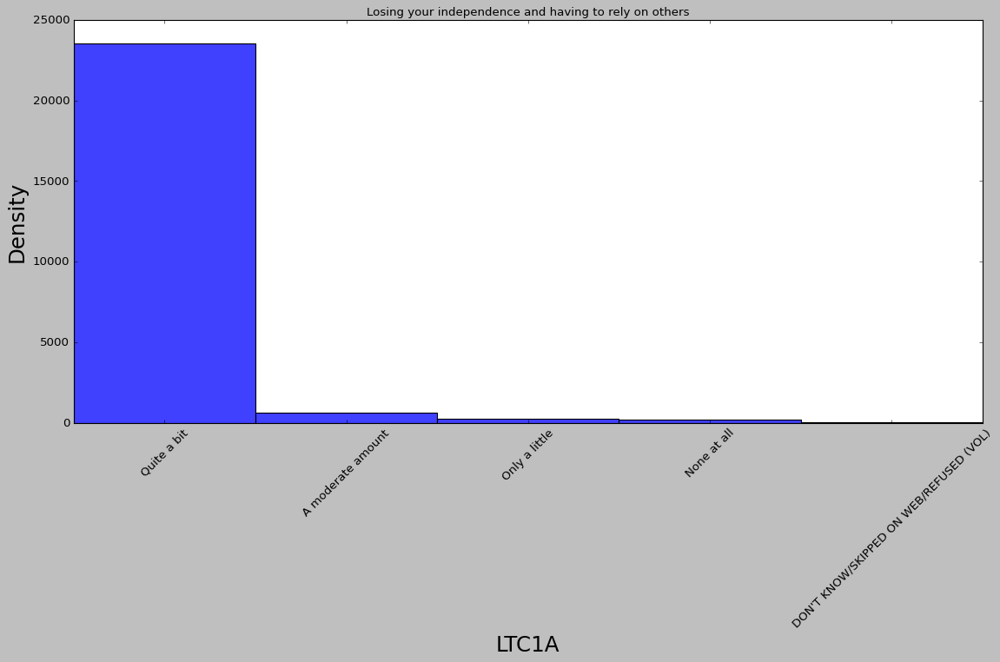

In [45]:
# fig, axes = plt.subplots(nrows=5,ncols=2, figsize=(5,5), dpi= 185)
# fig.set_size_inches(35,35)
# plt.style.use('classic')

for i_col in categorical_columns[1:11]:
#     plt.figure()
    plt.figure(figsize=(15,10)) 
    tempdf = SMD[[i_col]].copy()
    tempdf[i_col+'_new'] = tempdf[i_col].str.split(' ', 1, expand=True)[0]
    tempdf[i_col+'_new2'] = tempdf[i_col].str.split(' ', 1, expand=True)[1]
    
    a = sns.histplot(data=tempdf, x=i_col+'_new2')
    title = data_dict[data_dict['Variable']==i_col]['Label'].values[0].split(':')[1].split(']')[0].replace(' [', '')
    a.set_title(title,fontsize=12)
    plt.xticks(rotation=45)
    a.set_xlabel(i_col, fontsize=22)
    a.set_ylabel('Density', fontsize=22)
    plt.tight_layout(pad=2.0, w_pad = 2)
    legn1 = list(tempdf[i_col].unique())
    legn2 = ' '.join(legn1)
    fig.text(.5, .05, legn2, ha='center')
#     print(legn2)
#     plt.legend(labels=[legn2])

### Removing the most occuring option

In [ ]:
i_col = 'LTC1A'
tempdf = SMD[[i_col]].copy()
tempdf = tempdf[~tempdf[i_col].str.contains('Quite a bit')]
tempdf[i_col].unique()

In [ ]:
for i_col in categorical_columns[1:11]:
#     plt.figure()
    plt.figure(figsize=(15,10)) 
    tempdf = SMD[[i_col]].copy()
    tempdf = tempdf[~tempdf[i_col].str.contains('Quite a bit')]
    tempdf[i_col+'_new'] = tempdf[i_col].str.split(' ', 1, expand=True)[0]
    tempdf[i_col+'_new2'] = tempdf[i_col].str.split(' ', 1, expand=True)[1]
    
    a = sns.histplot(data=tempdf, x=i_col+'_new2')
    title = data_dict[data_dict['Variable']==i_col]['Label'].values[0].split(':')[1].split(']')[0].replace(' [', '')
    a.set_title(title,fontsize=12)
    plt.xticks(rotation=45)
    a.set_xlabel(i_col, fontsize=22)
    a.set_ylabel('Density', fontsize=22)
    plt.tight_layout(pad=2.0, w_pad = 2)
    legn1 = list(tempdf[i_col].unique())
    legn2 = ' '.join(legn1)
    fig.text(.5, .05, legn2, ha='center')
#     print(legn2)
#     plt.legend(labels=[legn2])

#### Bivariate Analysis

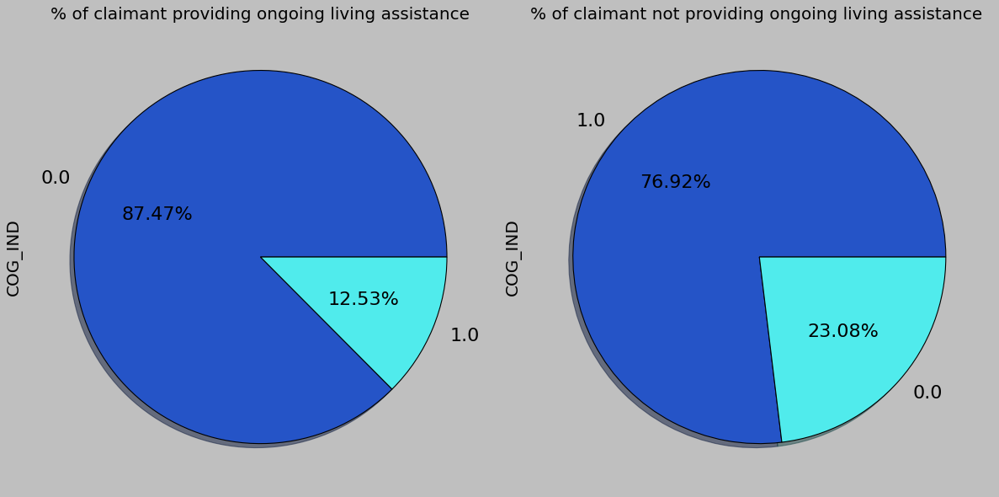

In [46]:
target = 'COG_IND'
i_col = 'LTC2'
f,ax=plt.subplots(1,2,figsize=(15,10))
uval = list(SMD[i_col].unique())
SMD[target][SMD[i_col]==uval[0]].value_counts().plot.pie(colors = ['#2554C7','#50EBEC'], autopct='%1.2f%%',ax=ax[0],textprops={'fontsize': 20},shadow=True)
SMD[target][SMD[i_col]==uval[1]].value_counts().plot.pie(colors = ['#2554C7','#50EBEC'], autopct='%1.2f%%',ax=ax[1],textprops={'fontsize': 20},shadow=True)
title = data_dict[data_dict['Variable']==i_col]['Label'].values[0].split(':')[1].split(']')[0].replace(' [', '')
# print(title)
ax[0].set_title('% of claimant providing ongoing living assistance', fontsize=18)
ax[1].set_title('% of claimant not providing ongoing living assistance ', fontsize=18)
ax[0].set_ylabel(target, fontsize=18)
ax[1].set_ylabel(target, fontsize=18)
plt.tight_layout()
plt.show()

 Are you currently receiving ongoing living assistance, or not?


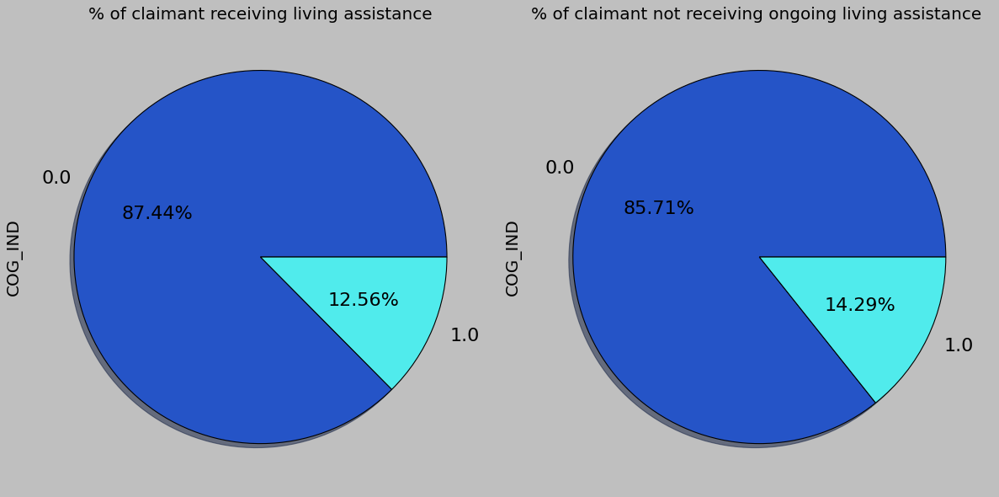

In [47]:
target = 'COG_IND'
i_col = 'LTC3'
f,ax=plt.subplots(1,2,figsize=(15,10))
uval = list(SMD[i_col].unique())
SMD[target][SMD[i_col]==uval[0]].value_counts().plot.pie(colors = ['#2554C7','#50EBEC'], autopct='%1.2f%%',ax=ax[0],textprops={'fontsize': 20},shadow=True)
SMD[target][SMD[i_col]==uval[1]].value_counts().plot.pie(colors = ['#2554C7','#50EBEC'], autopct='%1.2f%%',ax=ax[1],textprops={'fontsize': 20},shadow=True)
title = data_dict[data_dict['Variable']==i_col]['Label'].values[0].split(':')[1].split(']')[0].replace(' [', '')
print(title)
ax[0].set_title('% of claimant receiving living assistance', fontsize=18)
ax[1].set_title('% of claimant not receiving ongoing living assistance ', fontsize=18)
ax[0].set_ylabel(target, fontsize=18)
ax[1].set_ylabel(target, fontsize=18)
plt.tight_layout()
plt.show()

### Bi-variate analysis with percentage of target

In [48]:
def plot_cnt(dft, col_id, col_feature, col_target, bin=None):
    df_copy = dft.copy()
    col_plot = col_feature
    df_p = df_copy.groupby([col_plot], dropna=False).agg({col_id:'count', col_target:'sum'}).reset_index()
    df_p['pct_target'] = round(df_p[col_target] / df_p[col_id], 4)
    df_p[col_plot] = df_p[col_plot].astype(str)

    count_col_id = 'count_'+col_id
    sum_col_target = 'sum_'+col_target
    df_p.columns = [col_plot, count_col_id, sum_col_target, 'pct_target']
    display(df_p)

    #plot
    fig, ax1 = plt.subplots(figsize = (12, 6))
    plt.title('Group by {} with {} percentage'.format(col_plot, col_target), size=15)
    plt.xticks(rotation=45)
    #bar with counts
    sns.barplot(x=col_plot, y=count_col_id, data=df_p, palette='Set3')

    ax2 = ax1.twinx()
    sns.lineplot(x=col_plot, y='pct_target', data=df_p, color='darkorange')

    benchmark = (df_copy[col_target]==1).sum()/df_copy.shape[0]

    ax2.set_ylim([0, 1])
    ax2.set_yticklabels(range(0, 120, 20))

    # add text
    ax2.axhline(benchmark, color='gray', linestyle='-.')
    for x, m, z in zip(df_p[col_plot], df_p['pct_target'], df_p[count_col_id]):
        ax2.text(x,m,f'{m*100:.2f}%')
        ax1.text(x,z,f'{z}')

    plt.show()

In [49]:
df = SMD.copy()
df['COG_IND'] = df['COG_IND'].astype(float).astype(int)
cat_cols = df.select_dtypes(include=['object']).columns.tolist()
df[cat_cols] = df[cat_cols].astype("category")
df = pd.get_dummies(df, columns = cat_cols, drop_first=True)
df.columns

Index(['SU_ID', 'FINALWT', 'COG_IND', 'LTC1A_(3) A moderate amount',
       'LTC1A_(4) Only a little', 'LTC1A_(5) None at all',
       'LTC1A_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)',
       'LTC1B_(3) A moderate amount', 'LTC1B_(4) Only a little',
       'LTC1B_(5) None at all',
       ...
       'STATE_TX. Texas', 'STATE_UT. Utah', 'STATE_VA. Virginia',
       'STATE_VT. Vermont', 'STATE_WA. Washington', 'STATE_WI. Wisconsin',
       'STATE_WV. West Virginia', 'STATE_WY. Wyoming',
       'CENSUS_REGION_(3) South', 'CENSUS_REGION_(4) West'],
      dtype='object', length=246)

In [50]:
df['COG_IND'].value_counts()

0    21568
1     3098
Name: COG_IND, dtype: int64

LTC1A_(3) A moderate amount
Losing your independence and having to rely on others


,LTC1A_(3) A moderate amount,count_SU_ID,sum_COG_IND,pct_target
0,0,24037,2734,0.1137
1,1,629,364,0.5787


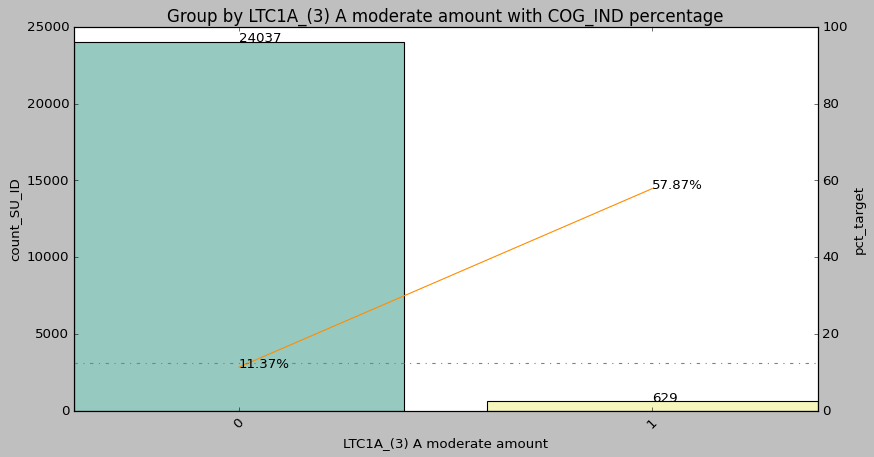

LTC1A_(4) Only a little
Losing your independence and having to rely on others


,LTC1A_(4) Only a little,count_SU_ID,sum_COG_IND,pct_target
0,0,24415,2997,0.1228
1,1,251,101,0.4024


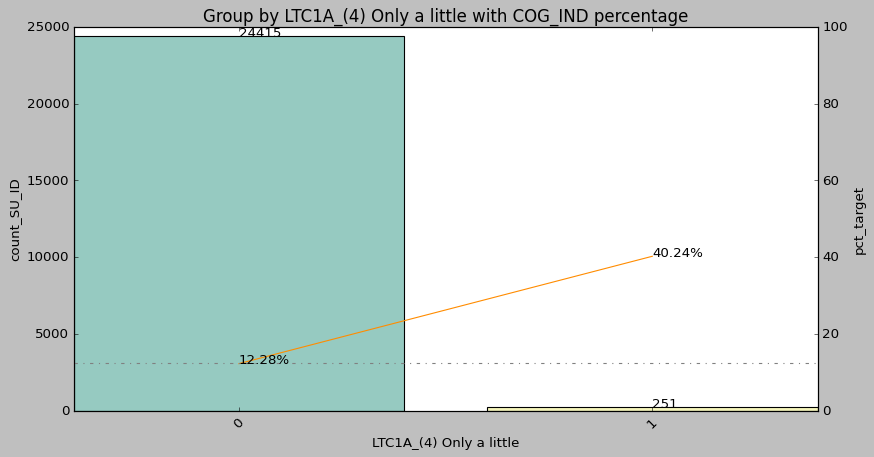

LTC1A_(5) None at all
Losing your independence and having to rely on others


,LTC1A_(5) None at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24455,2992,0.1223
1,1,211,106,0.5024


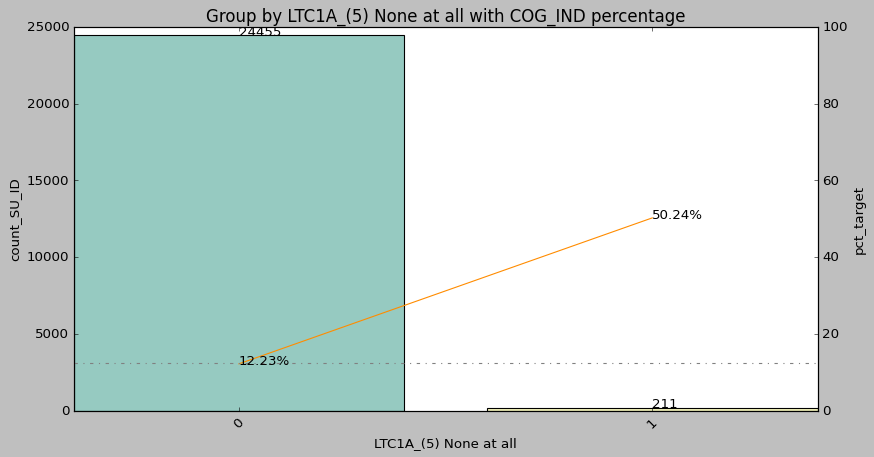

LTC1A_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Losing your independence and having to rely on others


,LTC1A_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24650,3085,0.1252
1,1,16,13,0.8125


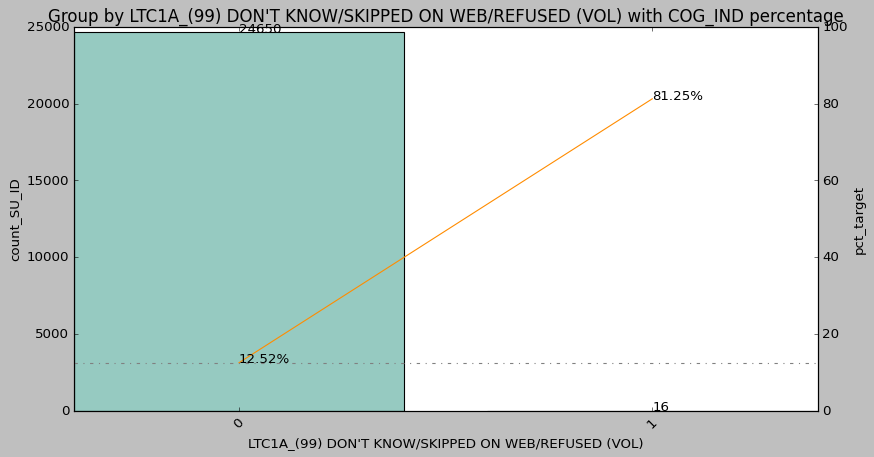

LTC1B_(3) A moderate amount
Being able to pay for any care or help you might need as you grow older


,LTC1B_(3) A moderate amount,count_SU_ID,sum_COG_IND,pct_target
0,0,24064,2749,0.1142
1,1,602,349,0.5797


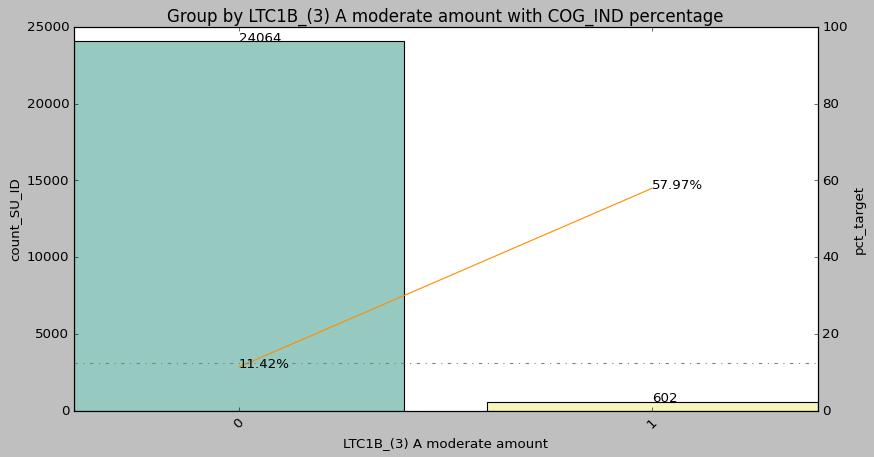

LTC1B_(4) Only a little
Being able to pay for any care or help you might need as you grow older


,LTC1B_(4) Only a little,count_SU_ID,sum_COG_IND,pct_target
0,0,24365,2959,0.1214
1,1,301,139,0.4618


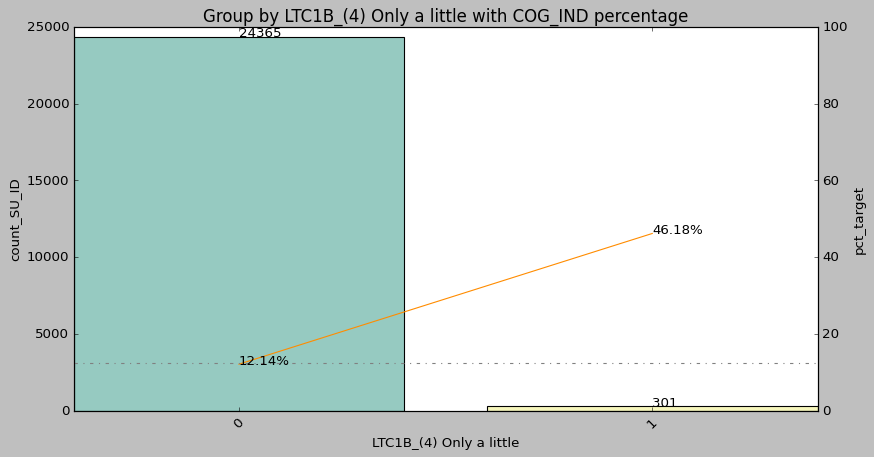

LTC1B_(5) None at all
Being able to pay for any care or help you might need as you grow older


,LTC1B_(5) None at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24486,3008,0.1228
1,1,180,90,0.5000


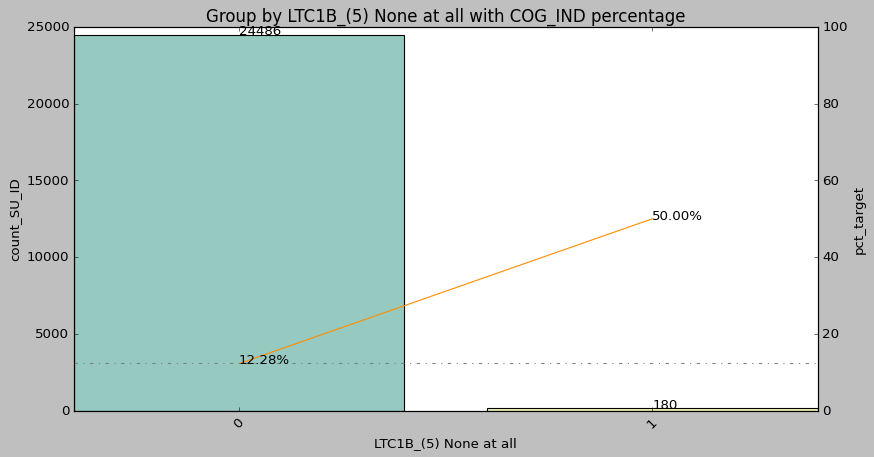

LTC1B_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Being able to pay for any care or help you might need as you grow older


,LTC1B_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24652,3087,0.1252
1,1,14,11,0.7857


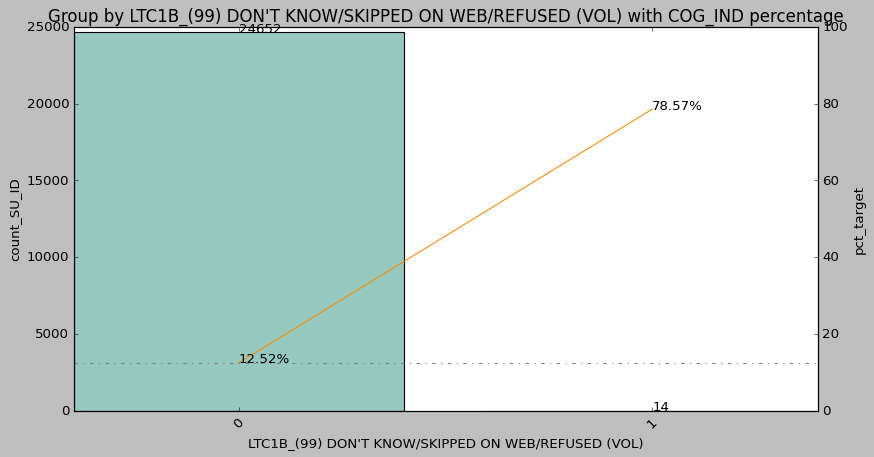

LTC1C_(3) A moderate amount
Having to leave your home and move into a nursing home


,LTC1C_(3) A moderate amount,count_SU_ID,sum_COG_IND,pct_target
0,0,24275,2833,0.1167
1,1,391,265,0.6777


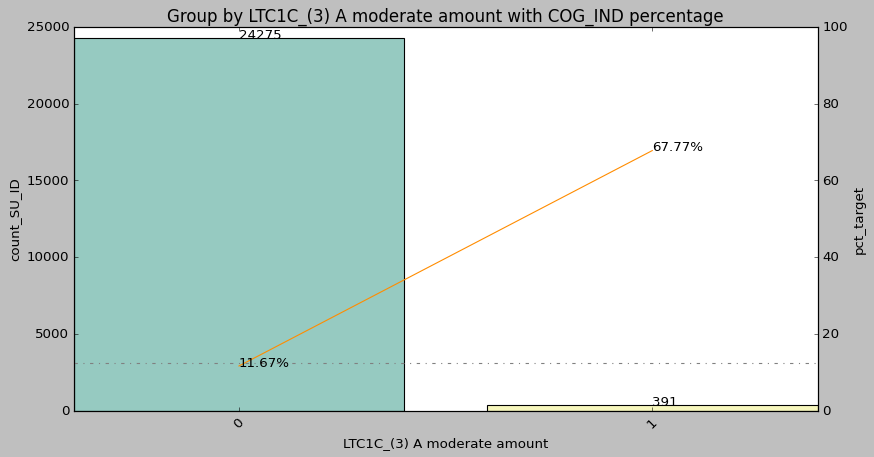

LTC1C_(4) Only a little
Having to leave your home and move into a nursing home


,LTC1C_(4) Only a little,count_SU_ID,sum_COG_IND,pct_target
0,0,24270,2933,0.1208
1,1,396,165,0.4167


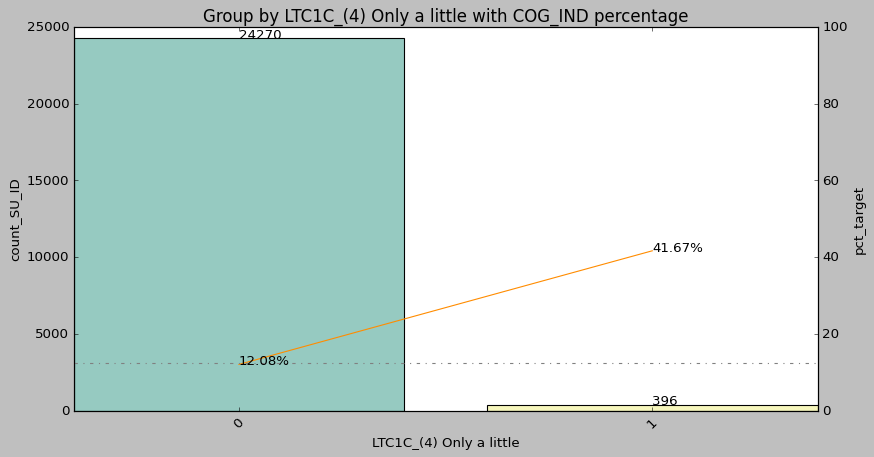

LTC1C_(5) None at all
Having to leave your home and move into a nursing home


,LTC1C_(5) None at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24328,2924,0.1202
1,1,338,174,0.5148


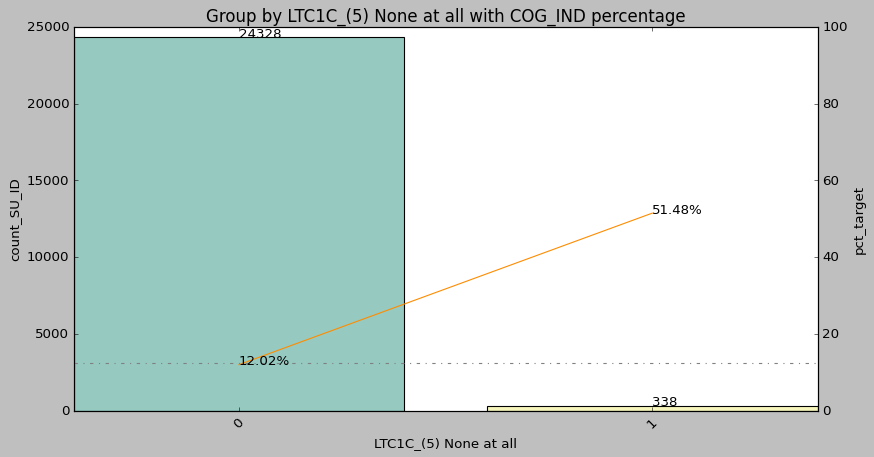

LTC1C_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Having to leave your home and move into a nursing home


,LTC1C_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24651,3086,0.1252
1,1,15,12,0.8000


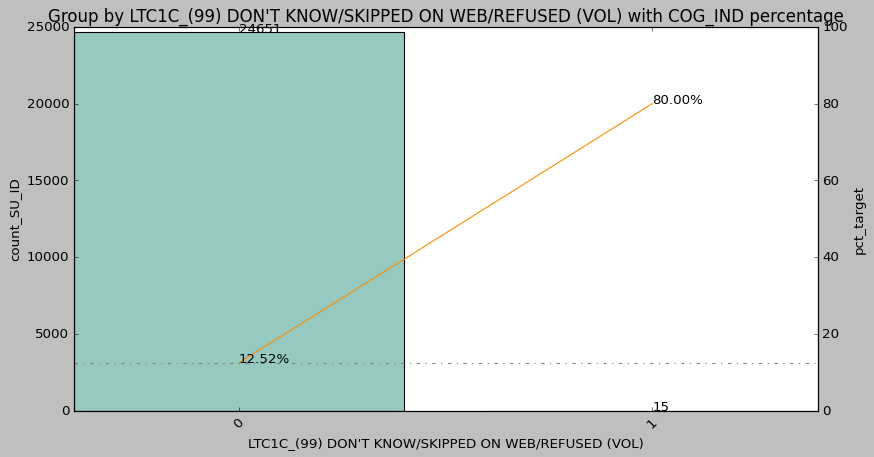

LTC1D_(3) A moderate amount
Being a burden on your family


,LTC1D_(3) A moderate amount,count_SU_ID,sum_COG_IND,pct_target
0,0,24108,2703,0.1121
1,1,558,395,0.7079


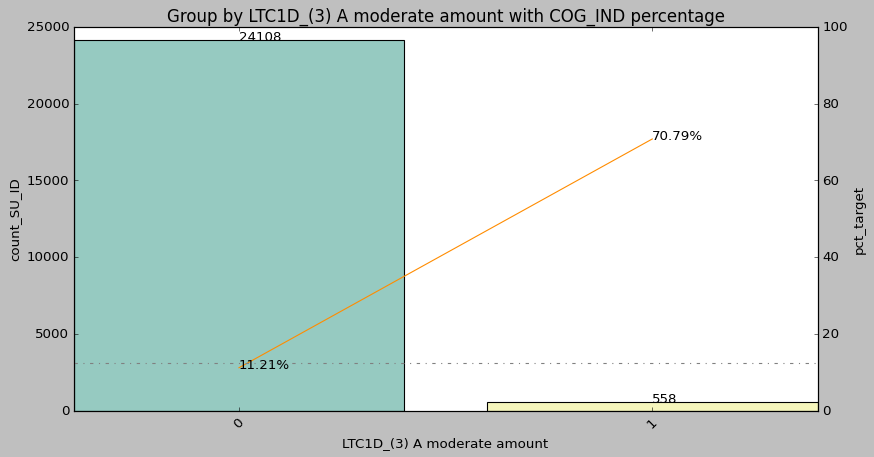

LTC1D_(4) Only a little
Being a burden on your family


,LTC1D_(4) Only a little,count_SU_ID,sum_COG_IND,pct_target
0,0,24010,2957,0.1232
1,1,656,141,0.2149


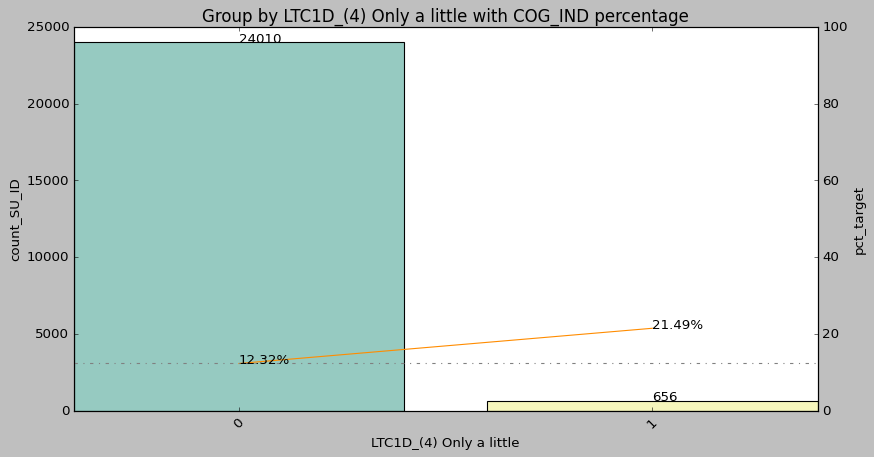

LTC1D_(5) None at all
Being a burden on your family


,LTC1D_(5) None at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24415,2988,0.1224
1,1,251,110,0.4382


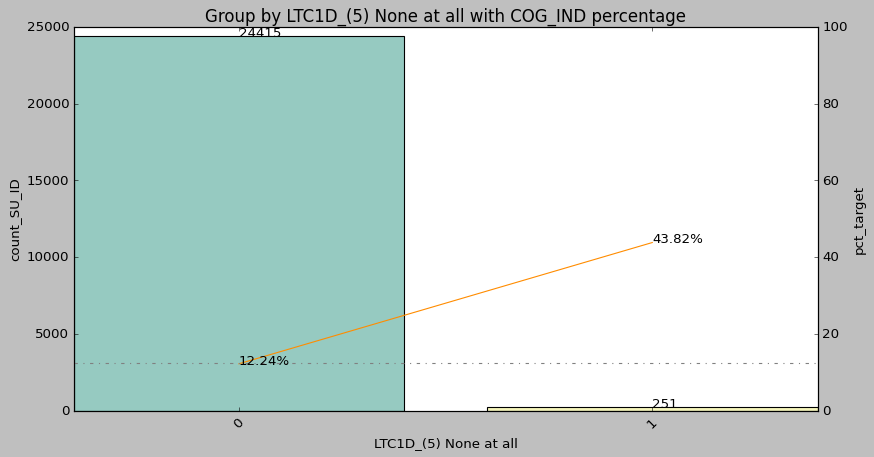

LTC1D_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Being a burden on your family


,LTC1D_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24654,3088,0.1253
1,1,12,10,0.8333


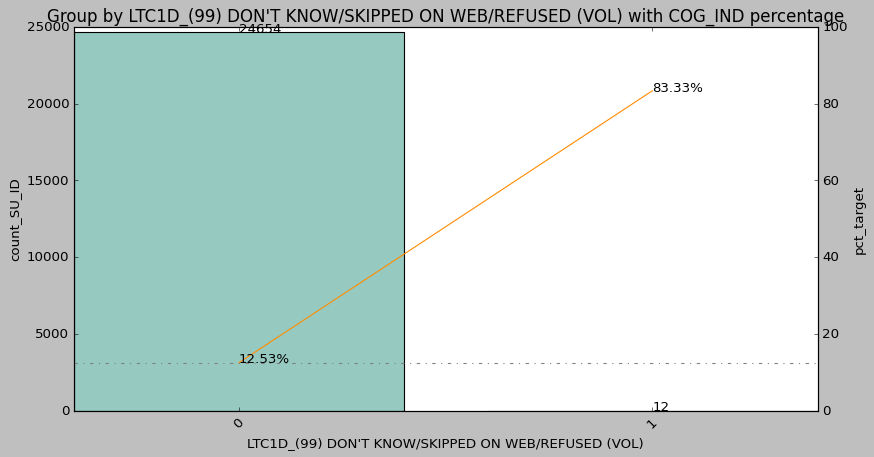

LTC1E_(3) A moderate amount
Not planning enough for the care you might need when you get older


,LTC1E_(3) A moderate amount,count_SU_ID,sum_COG_IND,pct_target
0,0,23894,2657,0.1112
1,1,772,441,0.5712


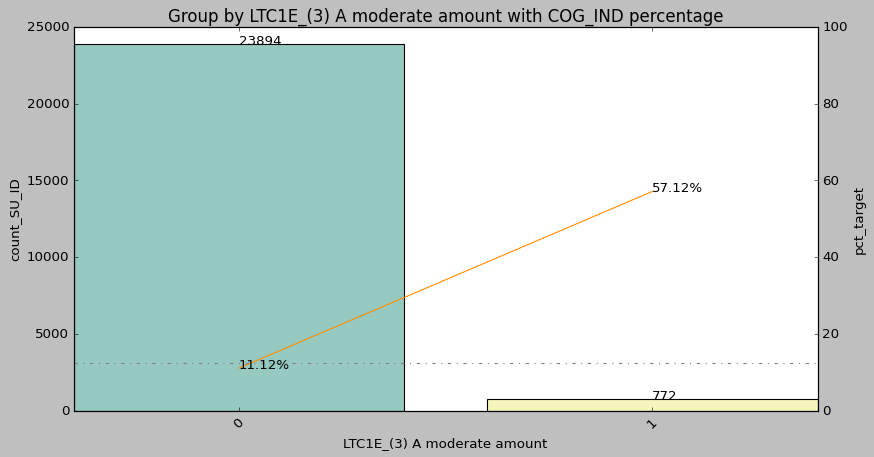

LTC1E_(4) Only a little
Not planning enough for the care you might need when you get older


,LTC1E_(4) Only a little,count_SU_ID,sum_COG_IND,pct_target
0,0,24314,2956,0.1216
1,1,352,142,0.4034


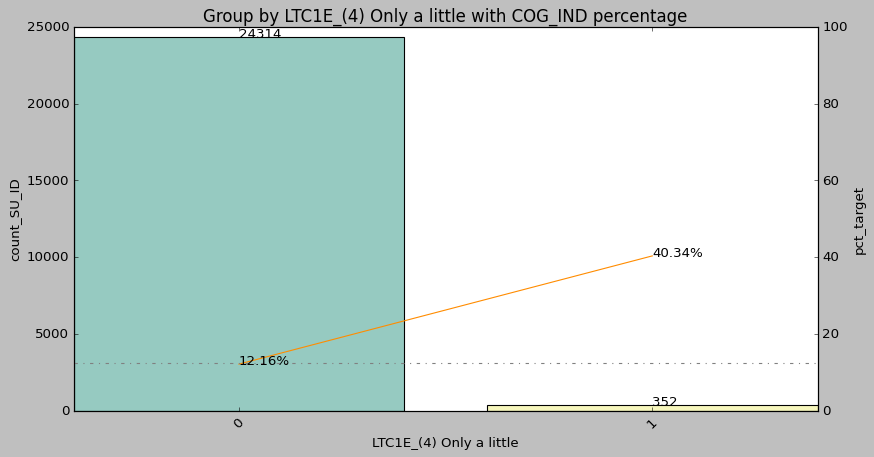

LTC1E_(5) None at all
Not planning enough for the care you might need when you get older


,LTC1E_(5) None at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24410,2981,0.1221
1,1,256,117,0.4570


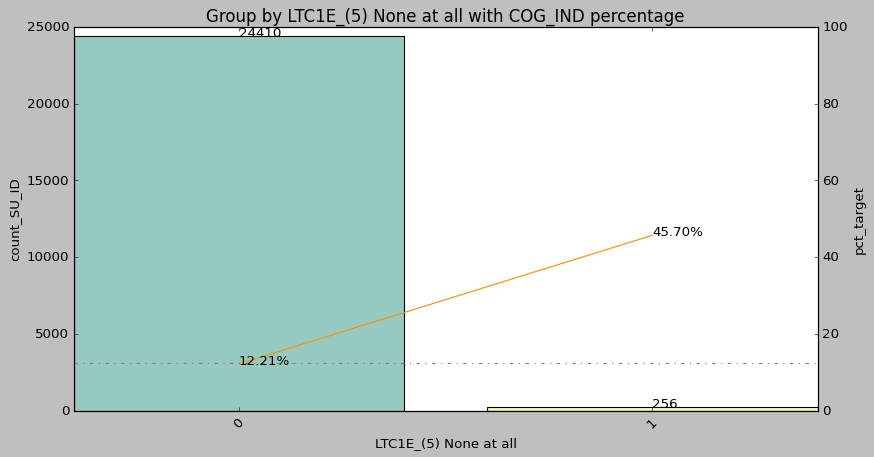

LTC1E_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Not planning enough for the care you might need when you get older


,LTC1E_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24651,3086,0.1252
1,1,15,12,0.8000


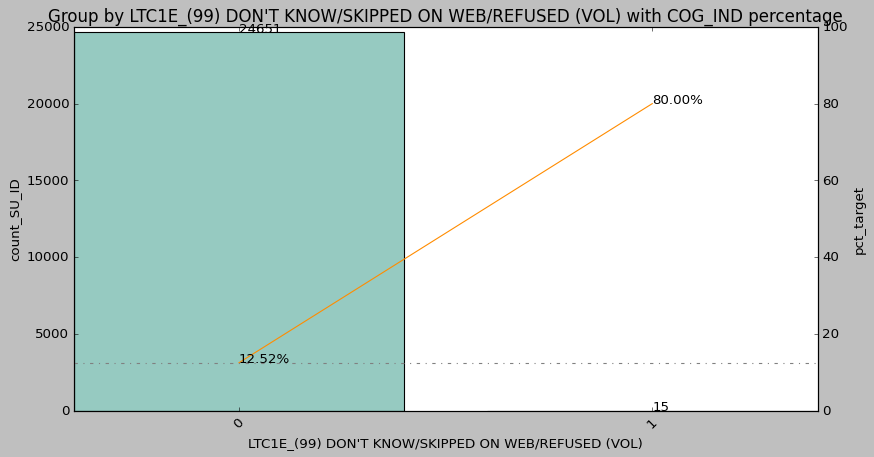

LTC1F_(3) A moderate amount
Being alone without family or friends around you


,LTC1F_(3) A moderate amount,count_SU_ID,sum_COG_IND,pct_target
0,0,24183,2780,0.1150
1,1,483,318,0.6584


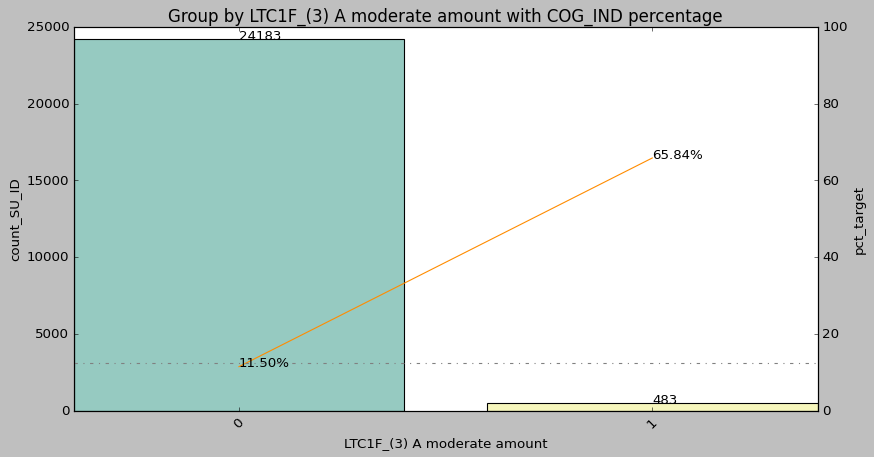

LTC1F_(4) Only a little
Being alone without family or friends around you


,LTC1F_(4) Only a little,count_SU_ID,sum_COG_IND,pct_target
0,0,24305,2983,0.1227
1,1,361,115,0.3186


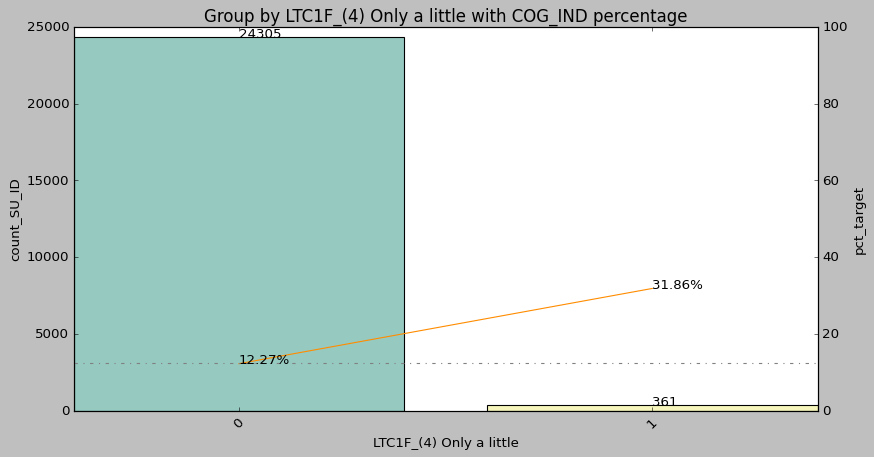

LTC1F_(5) None at all
Being alone without family or friends around you


,LTC1F_(5) None at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24411,2990,0.1225
1,1,255,108,0.4235


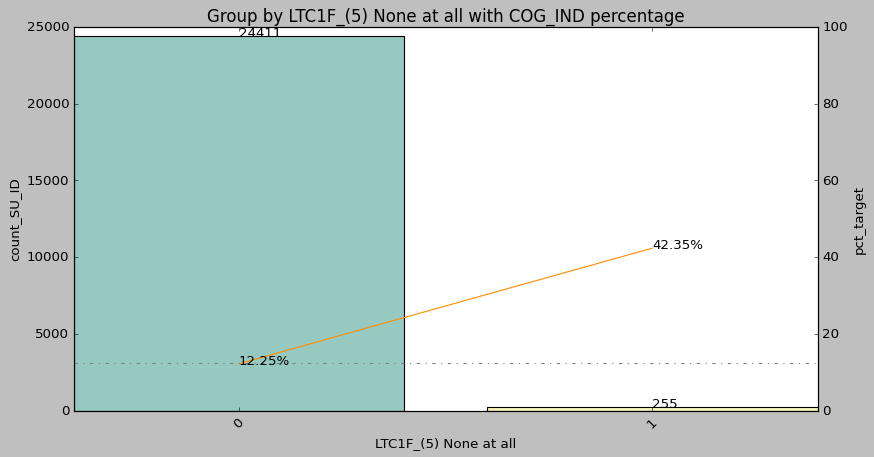

LTC1F_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Being alone without family or friends around you


,LTC1F_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24652,3087,0.1252
1,1,14,11,0.7857


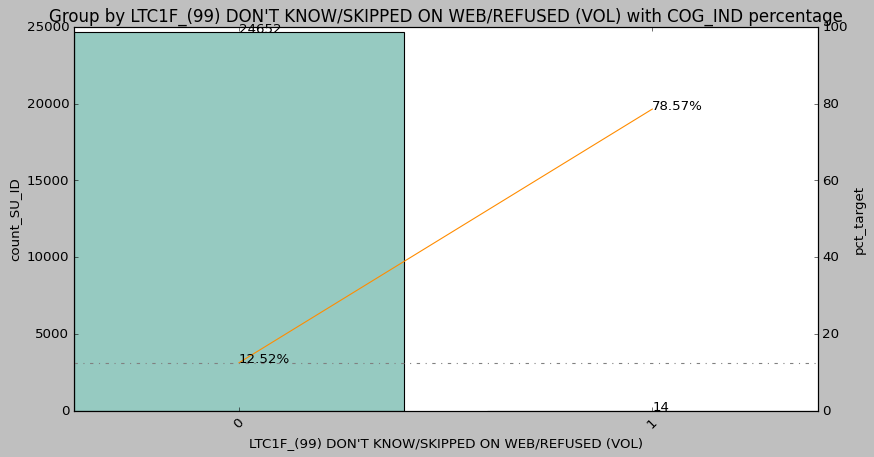

LTC1G_(3) A moderate amount
Having to leave your home and move into a family members home


,LTC1G_(3) A moderate amount,count_SU_ID,sum_COG_IND,pct_target
0,0,24276,2853,0.1175
1,1,390,245,0.6282


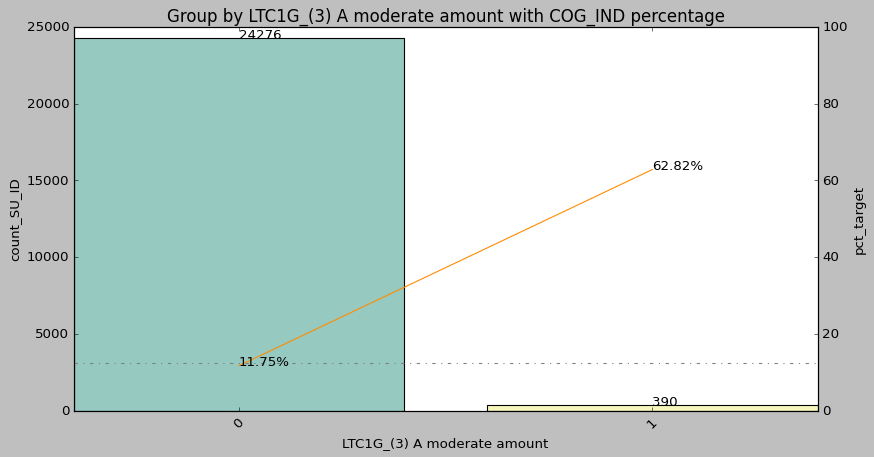

LTC1G_(4) Only a little
Having to leave your home and move into a family members home


,LTC1G_(4) Only a little,count_SU_ID,sum_COG_IND,pct_target
0,0,24184,2874,0.1188
1,1,482,224,0.4647


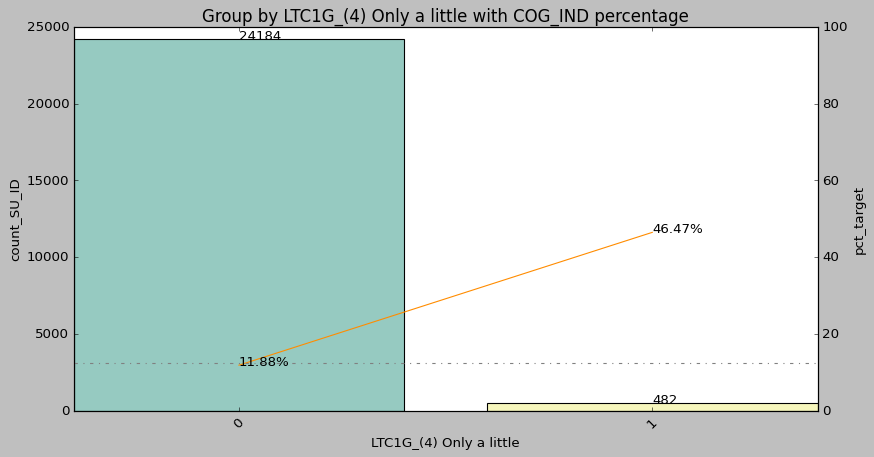

LTC1G_(5) None at all
Having to leave your home and move into a family members home


,LTC1G_(5) None at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24033,2898,0.1206
1,1,633,200,0.3160


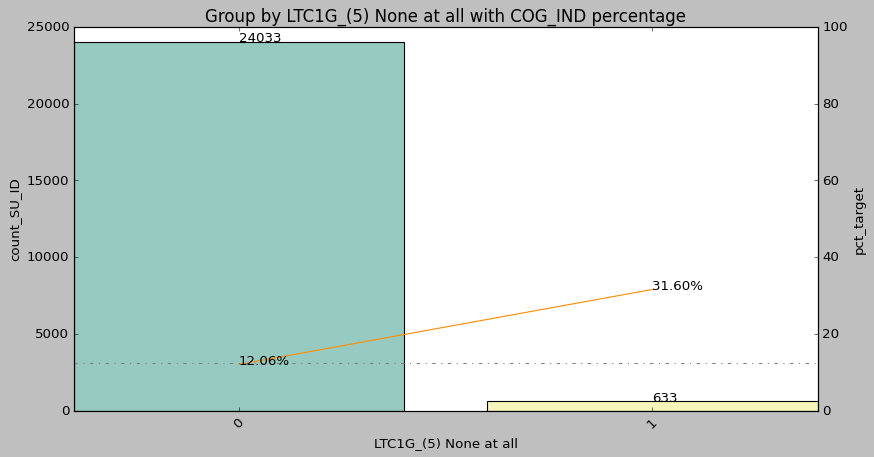

LTC1G_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Having to leave your home and move into a family members home


,LTC1G_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24652,3087,0.1252
1,1,14,11,0.7857


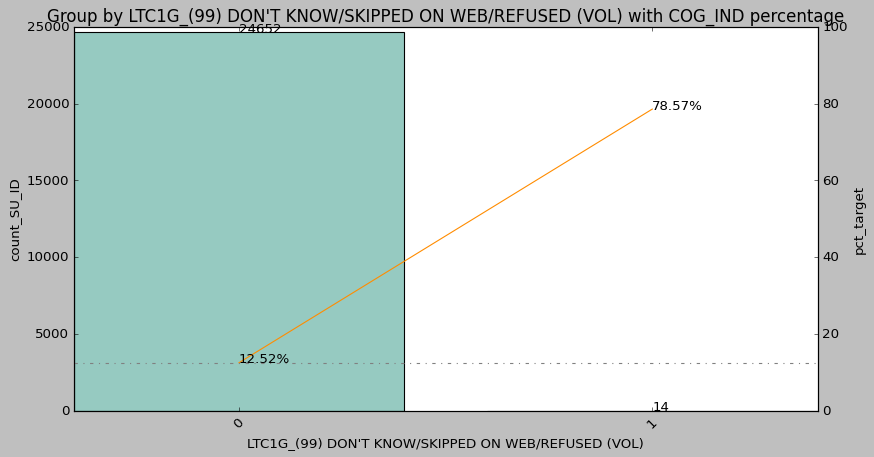

LTC1H_(3) A moderate amount
Experiencing health and safety issues in a retirement community or nursing home


,LTC1H_(3) A moderate amount,count_SU_ID,sum_COG_IND,pct_target
0,0,24176,2758,0.1141
1,1,490,340,0.6939


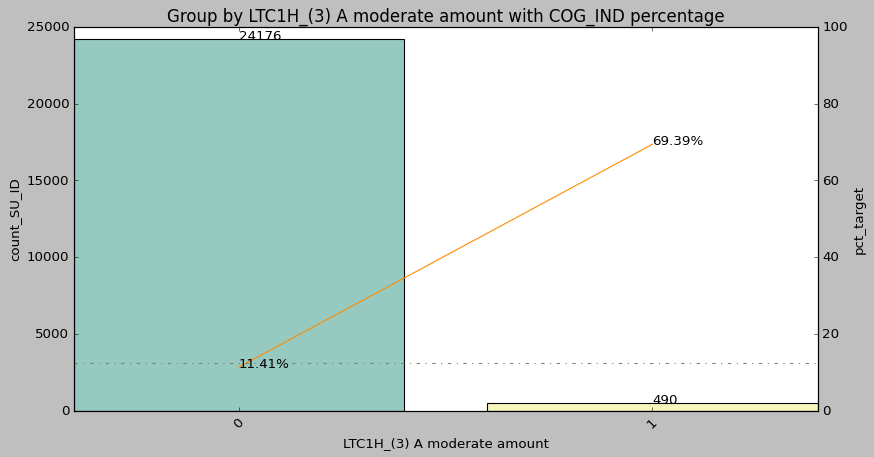

LTC1H_(4) Only a little
Experiencing health and safety issues in a retirement community or nursing home


,LTC1H_(4) Only a little,count_SU_ID,sum_COG_IND,pct_target
0,0,24346,2954,0.1213
1,1,320,144,0.4500


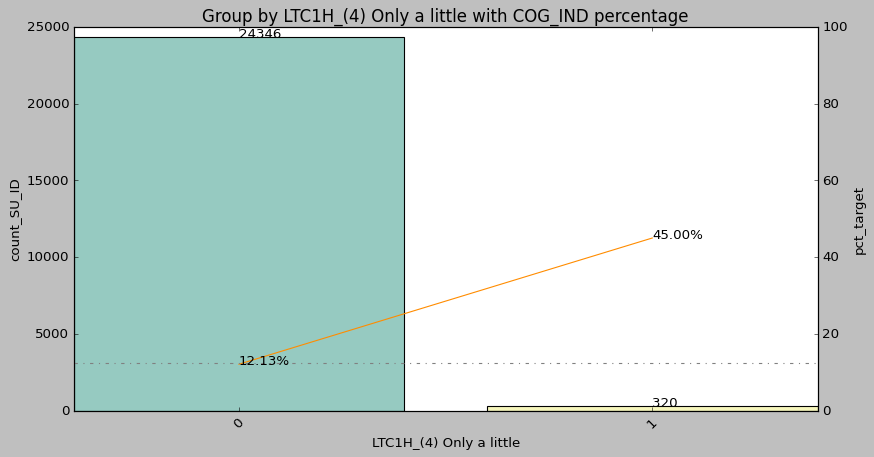

LTC1H_(5) None at all
Experiencing health and safety issues in a retirement community or nursing home


,LTC1H_(5) None at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24283,2902,0.1195
1,1,383,196,0.5117


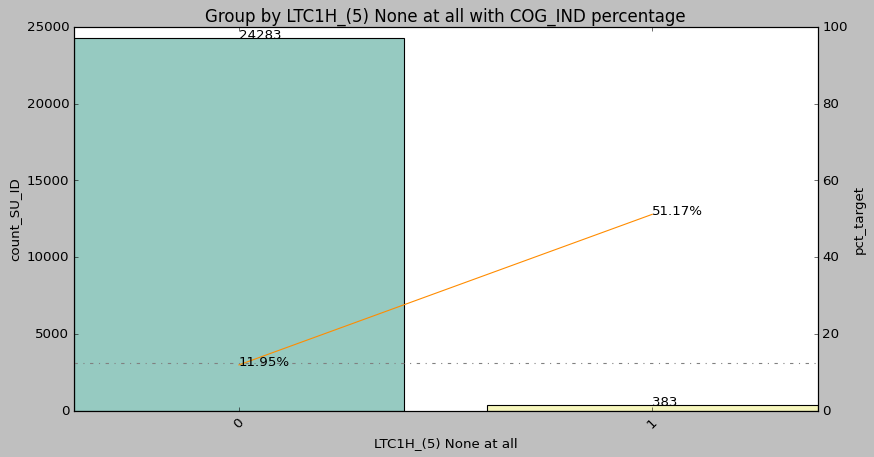

LTC1H_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Experiencing health and safety issues in a retirement community or nursing home


,LTC1H_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24643,3083,0.1251
1,1,23,15,0.6522


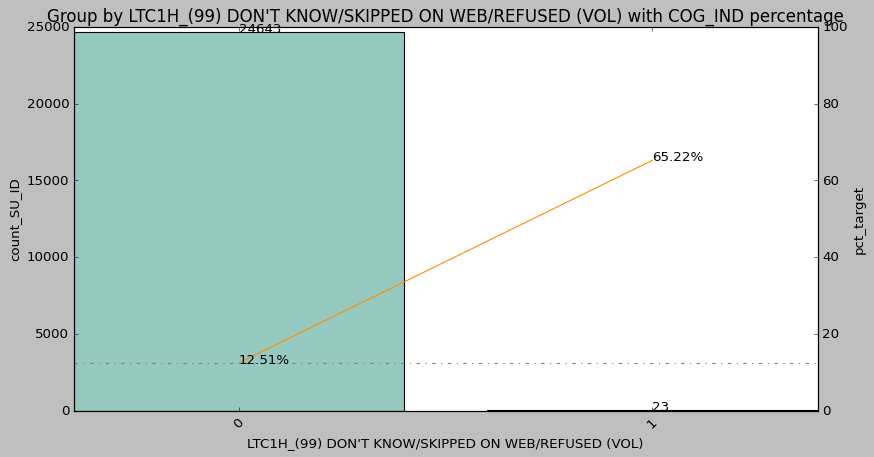

LTC1I_(3) A moderate amount
Having your social needs met


,LTC1I_(3) A moderate amount,count_SU_ID,sum_COG_IND,pct_target
0,0,23968,2631,0.1098
1,1,698,467,0.6691


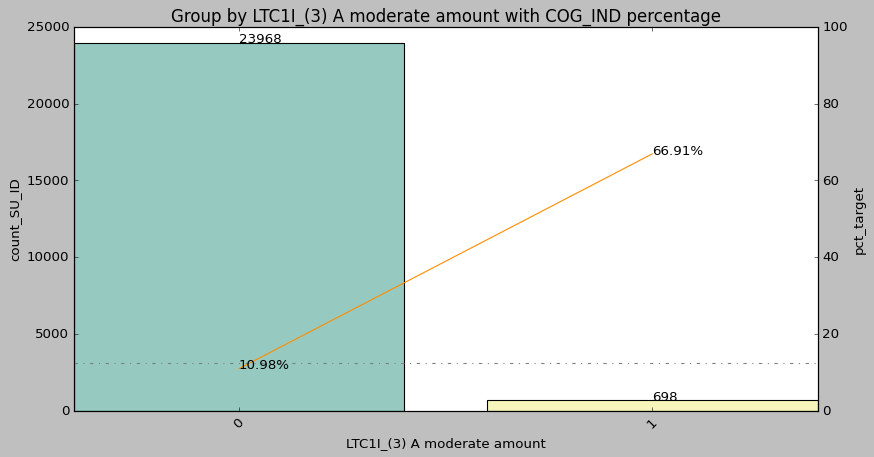

LTC1I_(4) Only a little
Having your social needs met


,LTC1I_(4) Only a little,count_SU_ID,sum_COG_IND,pct_target
0,0,23852,2914,0.1222
1,1,814,184,0.2260


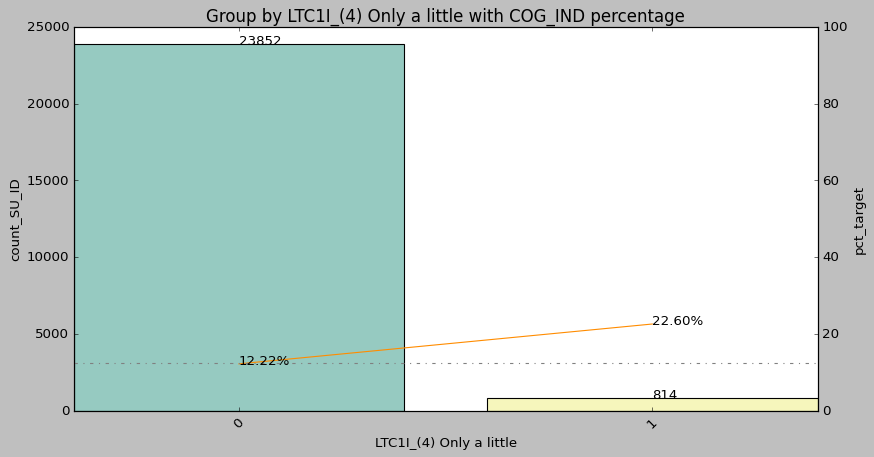

LTC1I_(5) None at all
Having your social needs met


,LTC1I_(5) None at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24404,2982,0.1222
1,1,262,116,0.4427


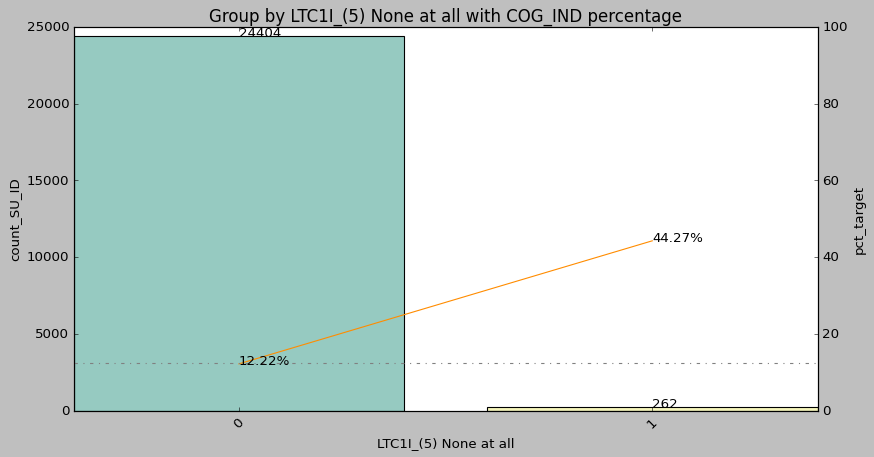

LTC1I_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Having your social needs met


,LTC1I_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24654,3088,0.1253
1,1,12,10,0.8333


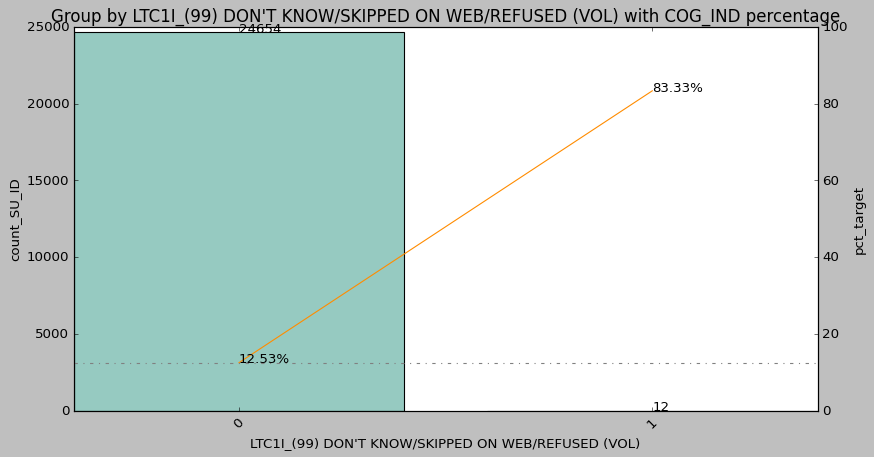

LTC2_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
 Are you currently providing ongoing living assistance on a regular basis to a family member or close friend or not?


,LTC2_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24653,3088,0.1253
1,1,13,10,0.7692


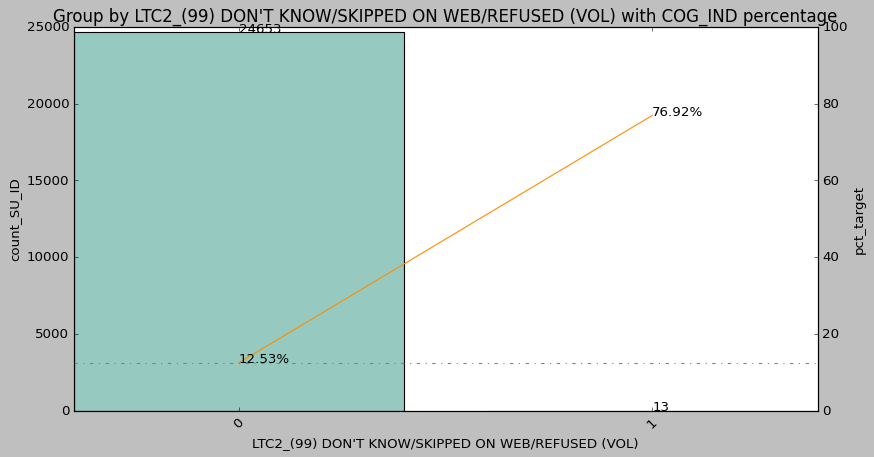

LTC3_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
 Are you currently receiving ongoing living assistance, or not?


,LTC3_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24659,3097,0.1256
1,1,7,1,0.1429


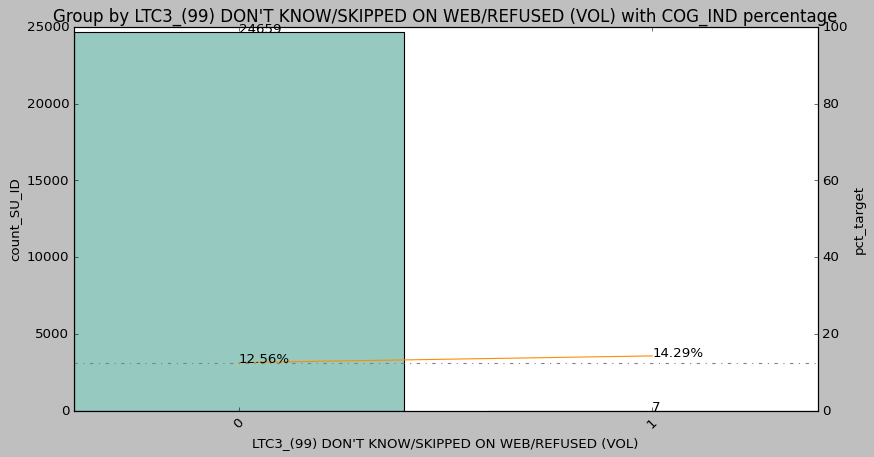

LTC4_(3) Nursing home
 If you could choose, what would be your first choice as to where you would receive assistance right now?/In the event that you need ongoing living assistance someday, if you could choose, what would be your first choice as to where you would receive that assistance?


,LTC4_(3) Nursing home,count_SU_ID,sum_COG_IND,pct_target
0,0,24643,3082,0.1251
1,1,23,16,0.6957


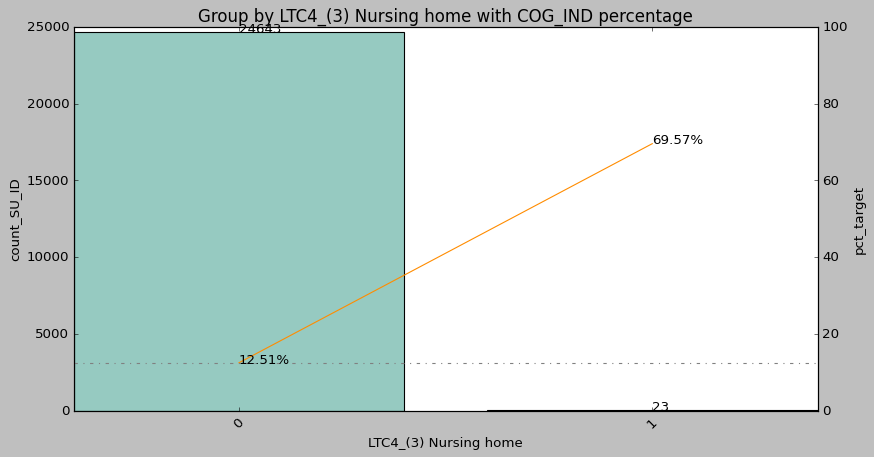

LTC4_(4) Senior community
 If you could choose, what would be your first choice as to where you would receive assistance right now?/In the event that you need ongoing living assistance someday, if you could choose, what would be your first choice as to where you would receive that assistance?


,LTC4_(4) Senior community,count_SU_ID,sum_COG_IND,pct_target
0,0,24516,3037,0.1239
1,1,150,61,0.4067


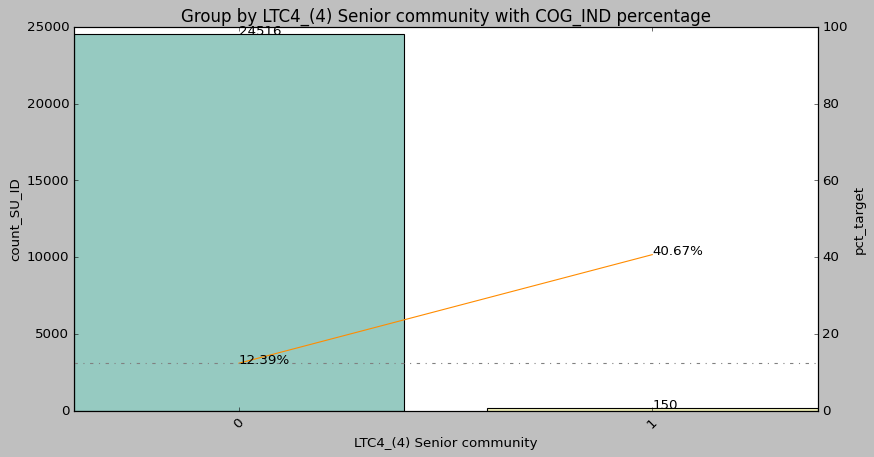

LTC4_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
 If you could choose, what would be your first choice as to where you would receive assistance right now?/In the event that you need ongoing living assistance someday, if you could choose, what would be your first choice as to where you would receive that assistance?


,LTC4_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24658,3094,0.1255
1,1,8,4,0.5000


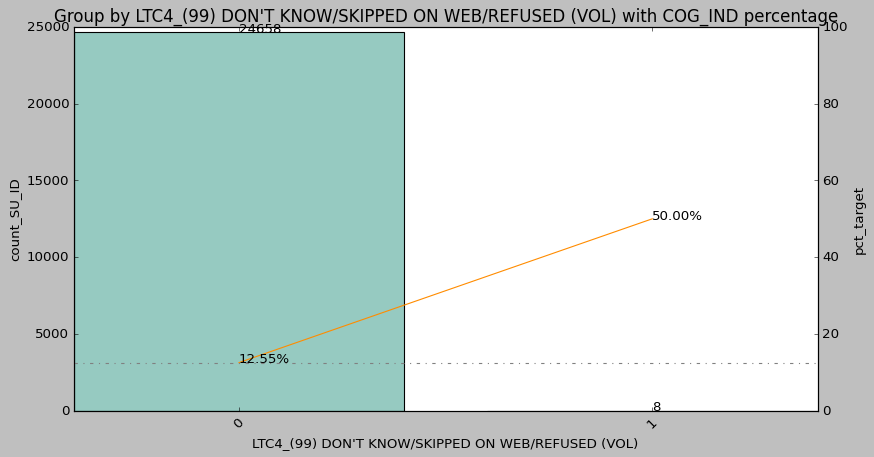

LTC5_(3) A moderate amount
 How much planning, if any,did you do/have you done


,LTC5_(3) A moderate amount,count_SU_ID,sum_COG_IND,pct_target
0,0,24510,3061,0.1249
1,1,156,37,0.2372


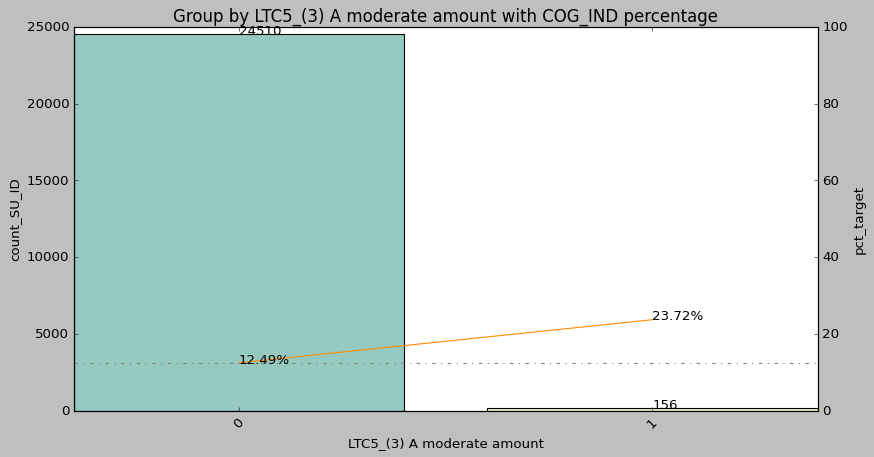

LTC5_(4) Only a little
 How much planning, if any,did you do/have you done


,LTC5_(4) Only a little,count_SU_ID,sum_COG_IND,pct_target
0,0,24273,3053,0.1258
1,1,393,45,0.1145


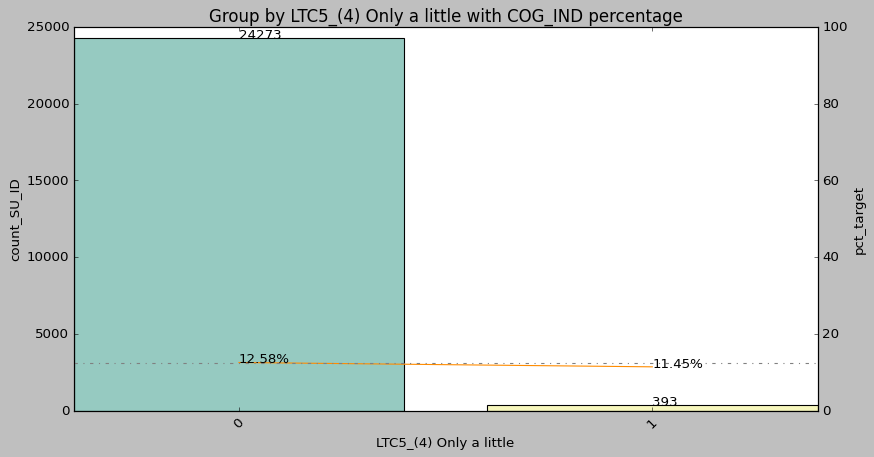

LTC5_(5) None at all
 How much planning, if any,did you do/have you done


,LTC5_(5) None at all,count_SU_ID,sum_COG_IND,pct_target
0,0,23358,3027,0.1296
1,1,1308,71,0.0543


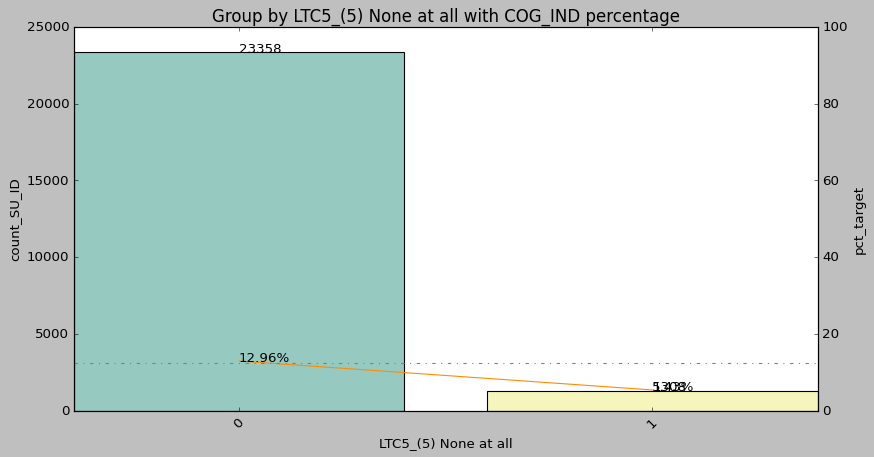

LTC5_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
 How much planning, if any,did you do/have you done


,LTC5_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24663,3098,0.1256
1,1,3,0,0.0000


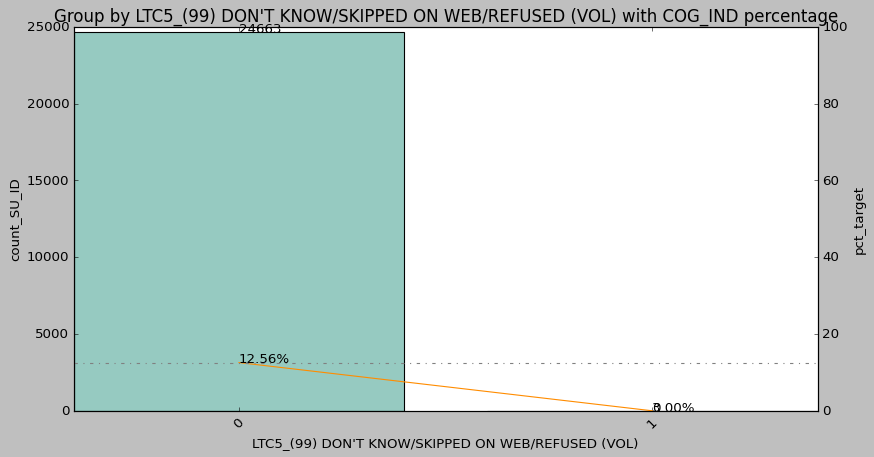

LTC6A_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Your doctor or health care provider


,LTC6A_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24657,3092,0.1254
1,1,9,6,0.6667


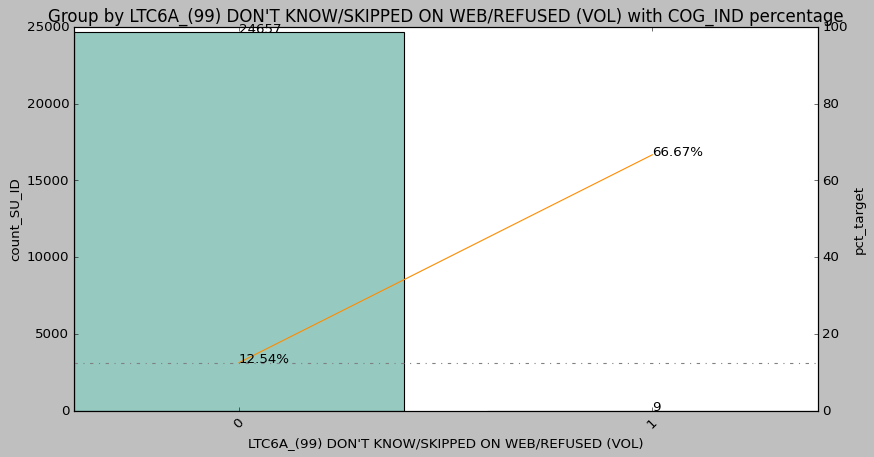

LTC6B_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Your friends or family


,LTC6B_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24653,3088,0.1253
1,1,13,10,0.7692


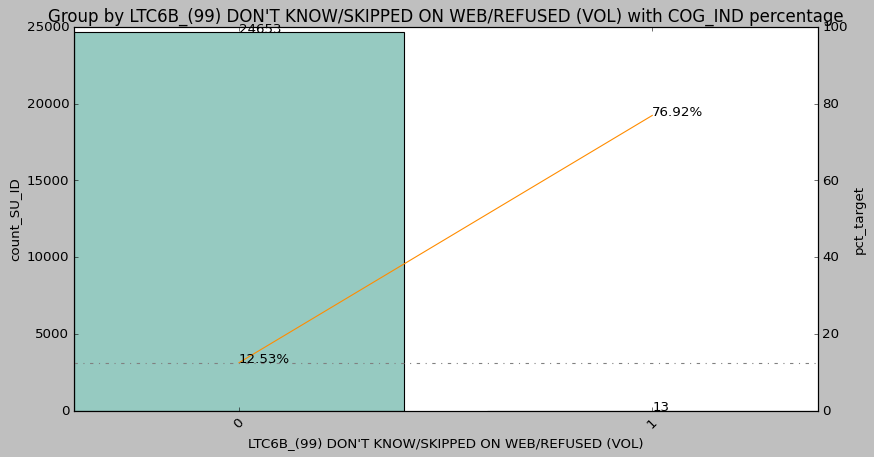

LTC7_(3) Usually
 When thinking about your experiences with the health care system over the past year, how often were your preferences for care taken into account?


,LTC7_(3) Usually,count_SU_ID,sum_COG_IND,pct_target
0,0,23513,2815,0.1197
1,1,1153,283,0.2454


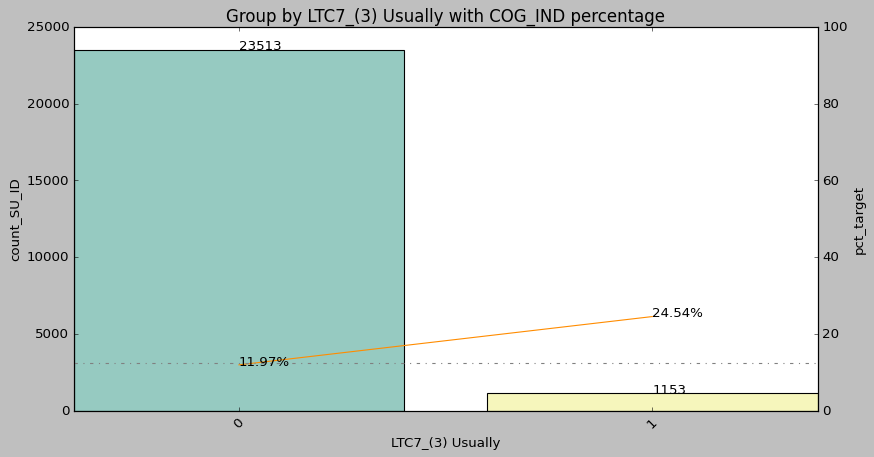

LTC7_(4) Always
 When thinking about your experiences with the health care system over the past year, how often were your preferences for care taken into account?


,LTC7_(4) Always,count_SU_ID,sum_COG_IND,pct_target
0,0,24301,2990,0.1230
1,1,365,108,0.2959


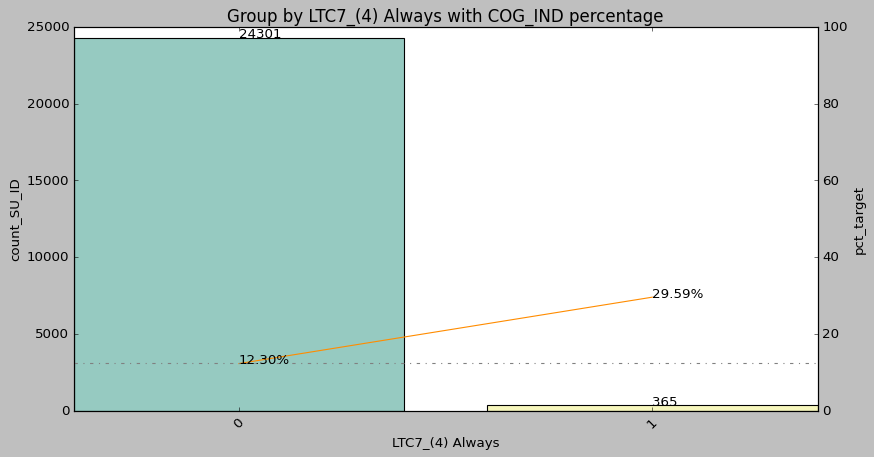

LTC7_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
 When thinking about your experiences with the health care system over the past year, how often were your preferences for care taken into account?


,LTC7_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24643,3081,0.1250
1,1,23,17,0.7391


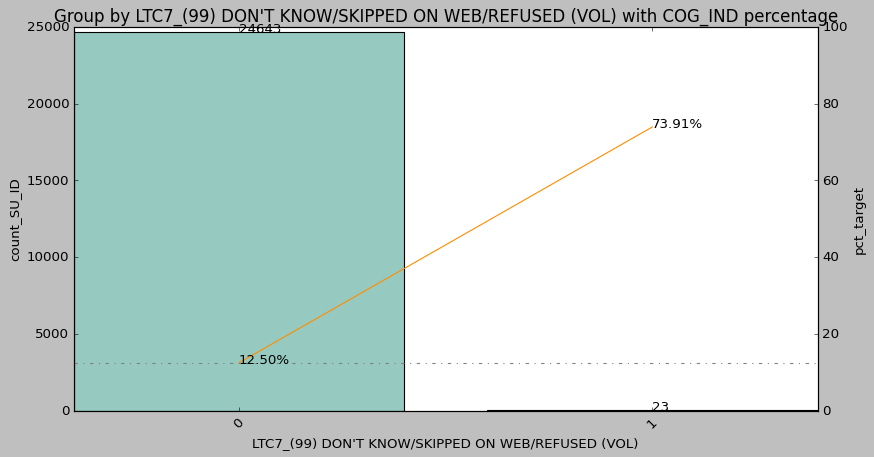

LTC8A_(3) Moderately concerned
Short-term stays for rehabilitation before moving home


,LTC8A_(3) Moderately concerned,count_SU_ID,sum_COG_IND,pct_target
0,0,23541,2580,0.1096
1,1,1125,518,0.4604


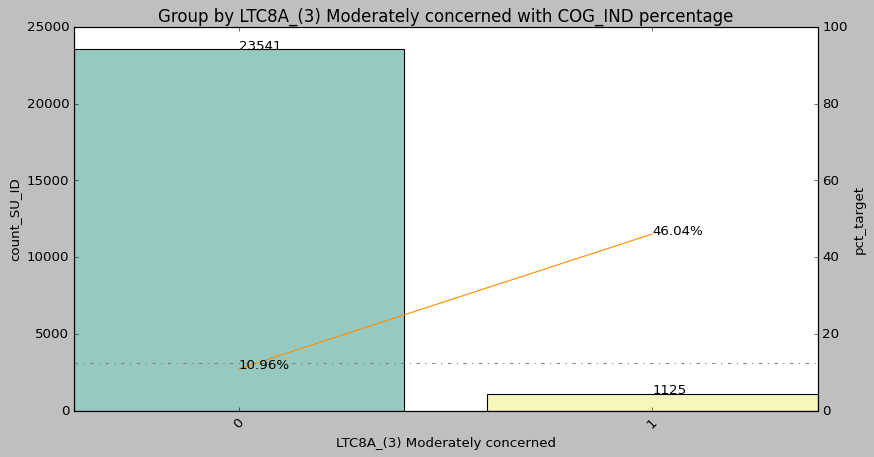

LTC8A_(4) Not very concerned
Short-term stays for rehabilitation before moving home


,LTC8A_(4) Not very concerned,count_SU_ID,sum_COG_IND,pct_target
0,0,24443,2993,0.1224
1,1,223,105,0.4709


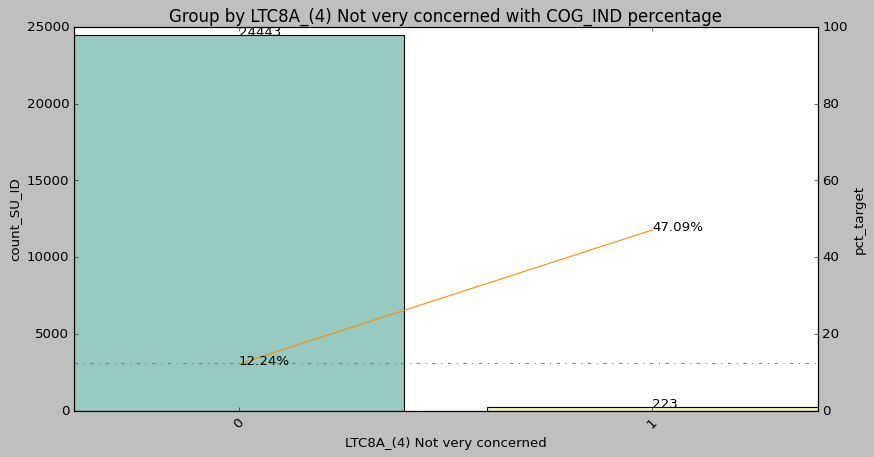

LTC8A_(5) Not concerned at all
Short-term stays for rehabilitation before moving home


,LTC8A_(5) Not concerned at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24544,3031,0.1235
1,1,122,67,0.5492


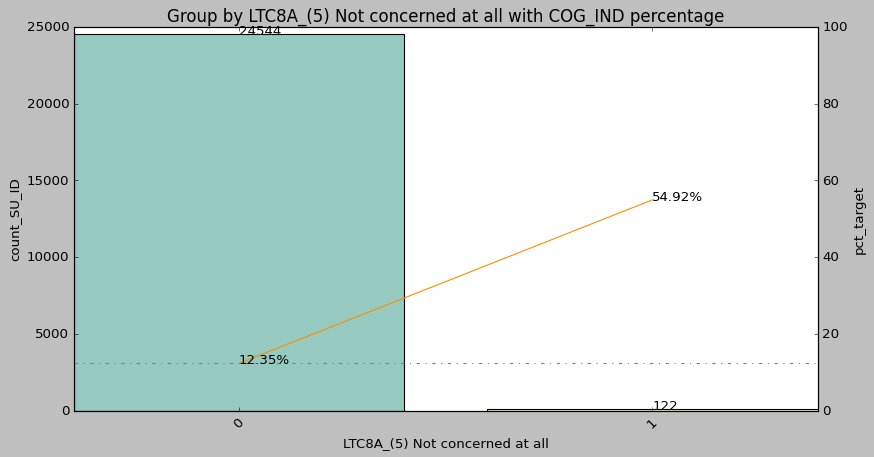

LTC8A_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Short-term stays for rehabilitation before moving home


,LTC8A_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24646,3082,0.1251
1,1,20,16,0.8000


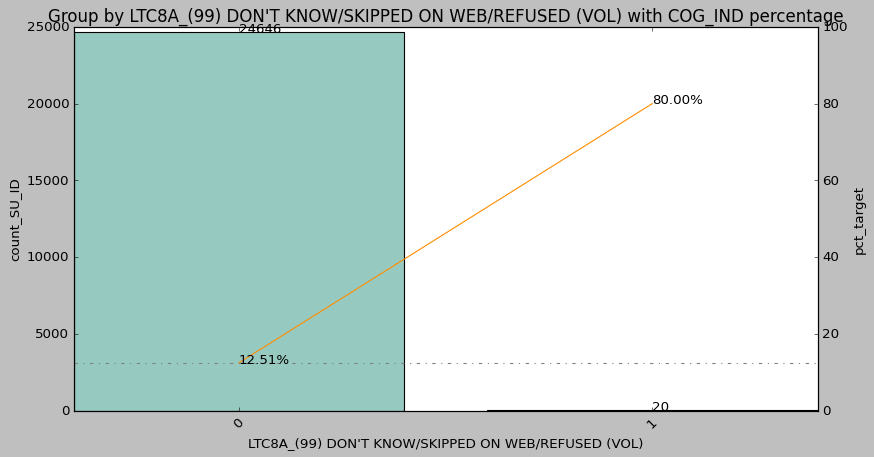

LTC8B_(3) Moderately concerned
Long term or permanent residence


,LTC8B_(3) Moderately concerned,count_SU_ID,sum_COG_IND,pct_target
0,0,24032,2731,0.1136
1,1,634,367,0.5789


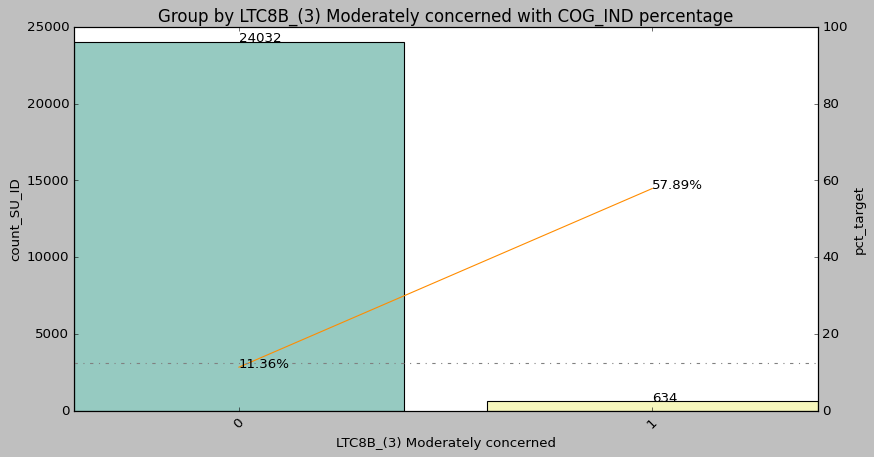

LTC8B_(4) Not very concerned
Long term or permanent residence


,LTC8B_(4) Not very concerned,count_SU_ID,sum_COG_IND,pct_target
0,0,24502,3015,0.1231
1,1,164,83,0.5061


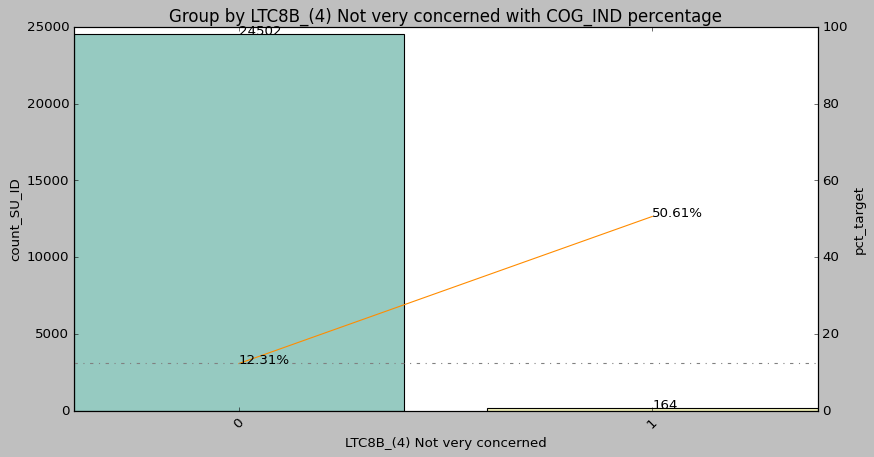

LTC8B_(5) Not concerned at all
Long term or permanent residence


,LTC8B_(5) Not concerned at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24559,3031,0.1234
1,1,107,67,0.6262


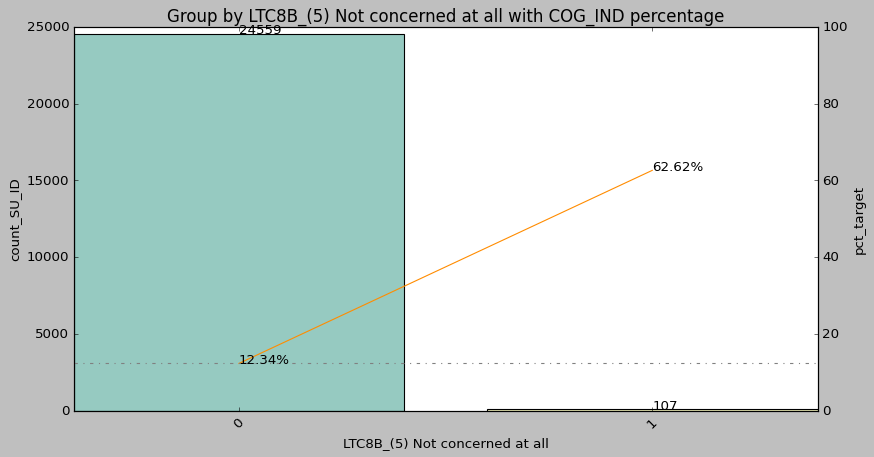

LTC8B_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Long term or permanent residence


,LTC8B_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24642,3080,0.125
1,1,24,18,0.750


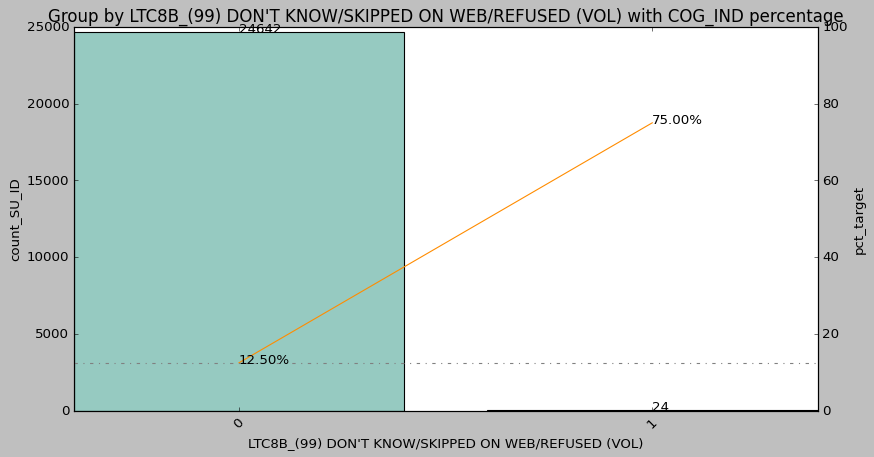

LTC9_(3) Somewhat confident
 Thinking about yourcurrent/possible


,LTC9_(3) Somewhat confident,count_SU_ID,sum_COG_IND,pct_target
0,0,23360,2467,0.1056
1,1,1306,631,0.4832


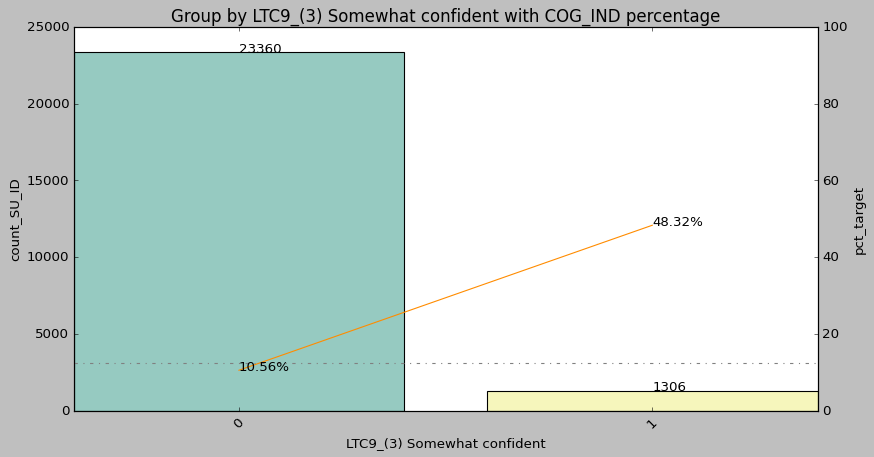

LTC9_(4) Not too confident
 Thinking about yourcurrent/possible


,LTC9_(4) Not too confident,count_SU_ID,sum_COG_IND,pct_target
0,0,24248,2909,0.1200
1,1,418,189,0.4522


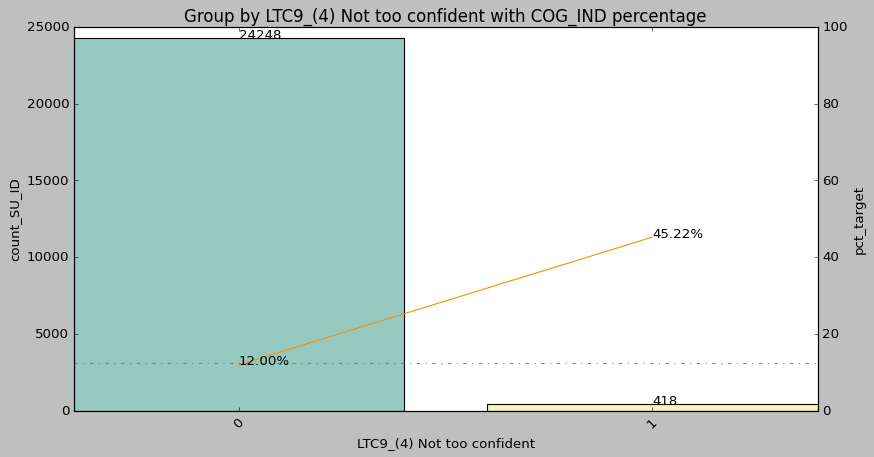

LTC9_(5) Not confident at all
 Thinking about yourcurrent/possible


,LTC9_(5) Not confident at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24333,3043,0.1251
1,1,333,55,0.1652


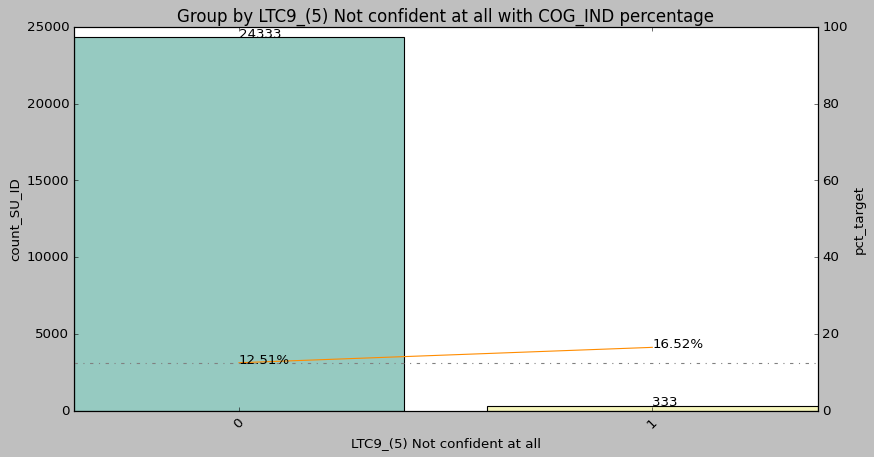

LTC9_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
 Thinking about yourcurrent/possible


,LTC9_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24647,3083,0.1251
1,1,19,15,0.7895


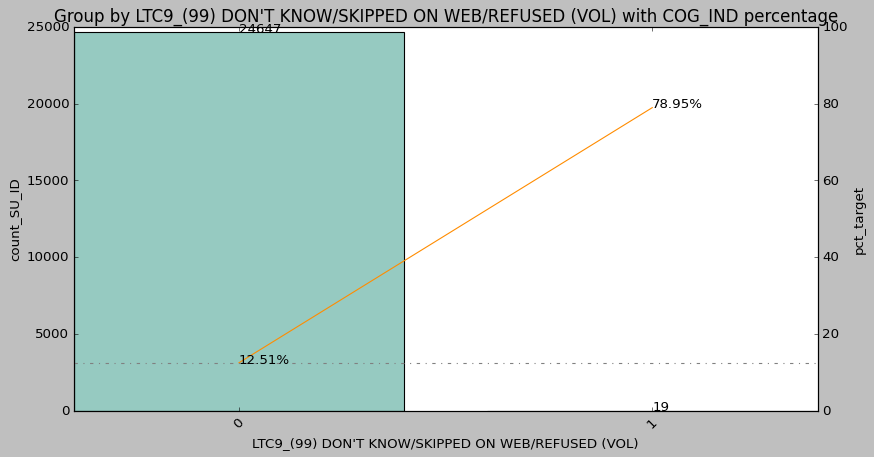

LTC10A_(3) A moderate amount
Your personal savings or investments


,LTC10A_(3) A moderate amount,count_SU_ID,sum_COG_IND,pct_target
0,0,24377,3028,0.1242
1,1,289,70,0.2422


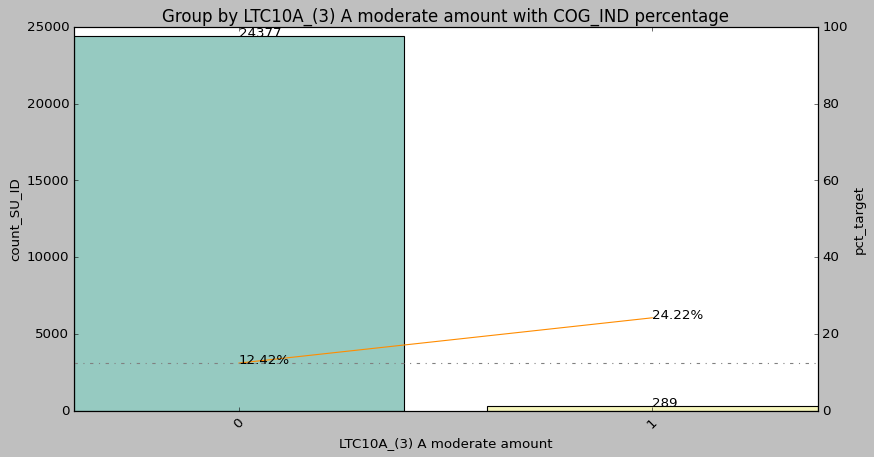

LTC10A_(4) Only a little
Your personal savings or investments


,LTC10A_(4) Only a little,count_SU_ID,sum_COG_IND,pct_target
0,0,24511,3072,0.1253
1,1,155,26,0.1677


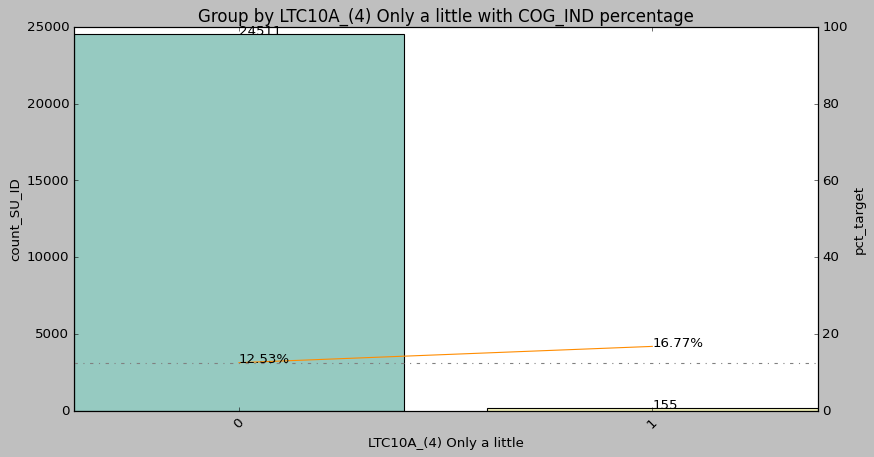

LTC10A_(5) Not at all
Your personal savings or investments


,LTC10A_(5) Not at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24492,3091,0.1262
1,1,174,7,0.0402


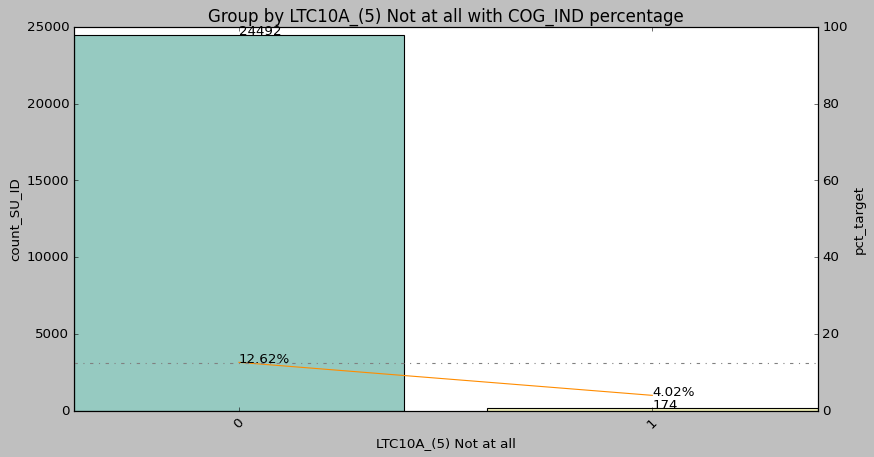

LTC10A_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Your personal savings or investments


,LTC10A_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24656,3094,0.1255
1,1,10,4,0.4000


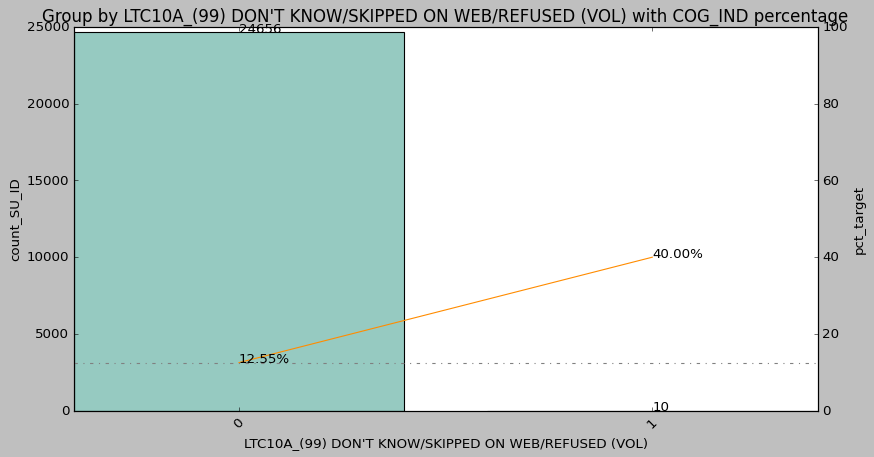

LTC10B_(3) A moderate amount
A pension


,LTC10B_(3) A moderate amount,count_SU_ID,sum_COG_IND,pct_target
0,0,24476,3036,0.1240
1,1,190,62,0.3263


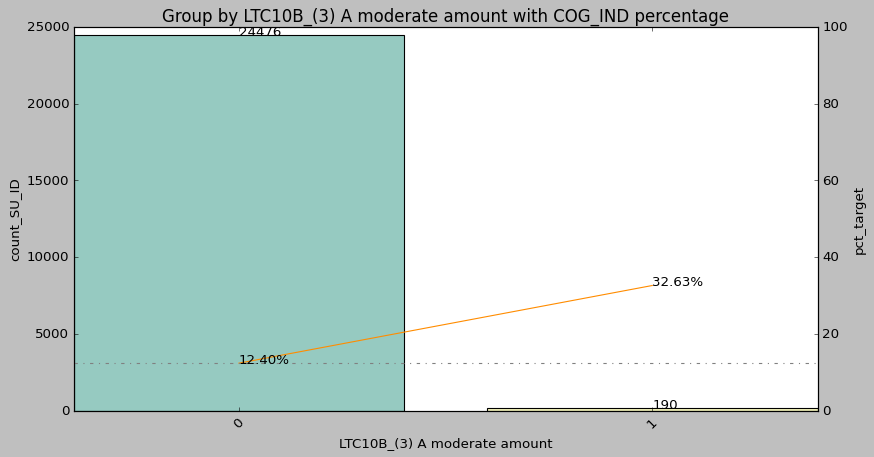

LTC10B_(4) Only a little
A pension


,LTC10B_(4) Only a little,count_SU_ID,sum_COG_IND,pct_target
0,0,24577,3076,0.1252
1,1,89,22,0.2472


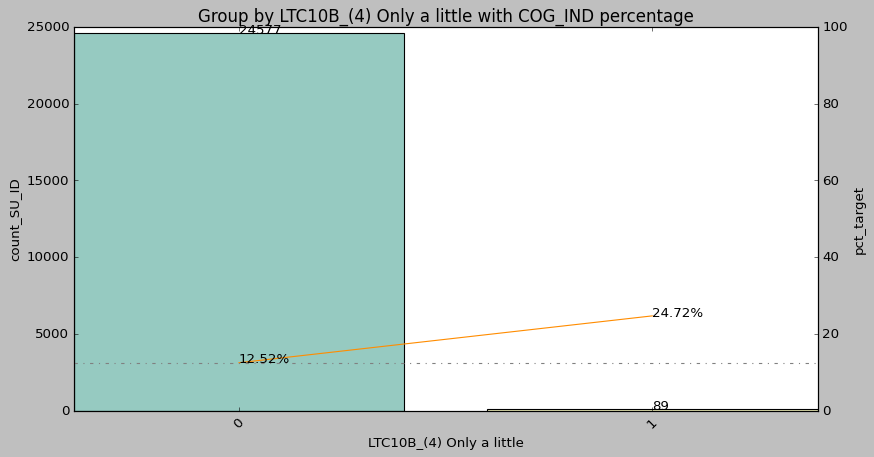

LTC10B_(5) Not at all
A pension


,LTC10B_(5) Not at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24138,3050,0.1264
1,1,528,48,0.0909


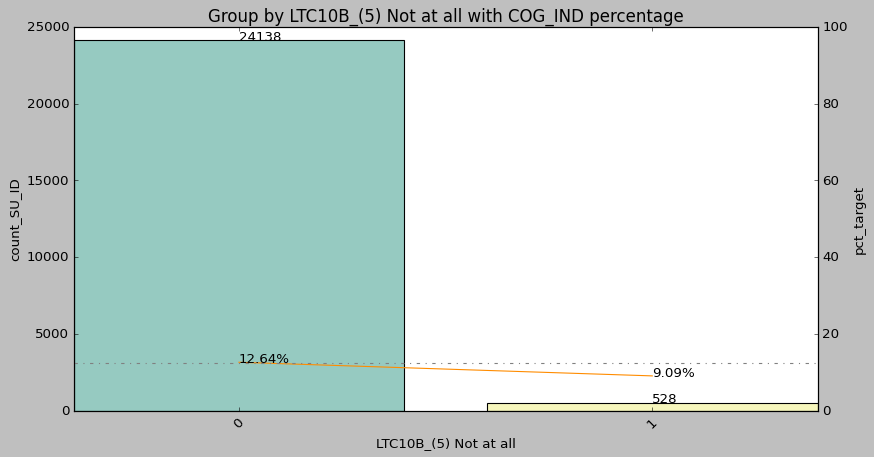

LTC10B_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
A pension


,LTC10B_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24647,3095,0.1256
1,1,19,3,0.1579


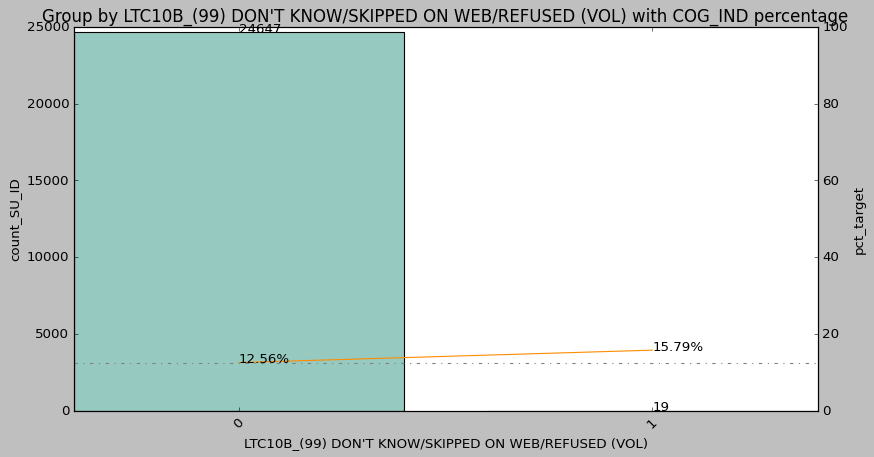

LTC10C_(3) A moderate amount
Social Security


,LTC10C_(3) A moderate amount,count_SU_ID,sum_COG_IND,pct_target
0,0,24265,3010,0.1240
1,1,401,88,0.2195


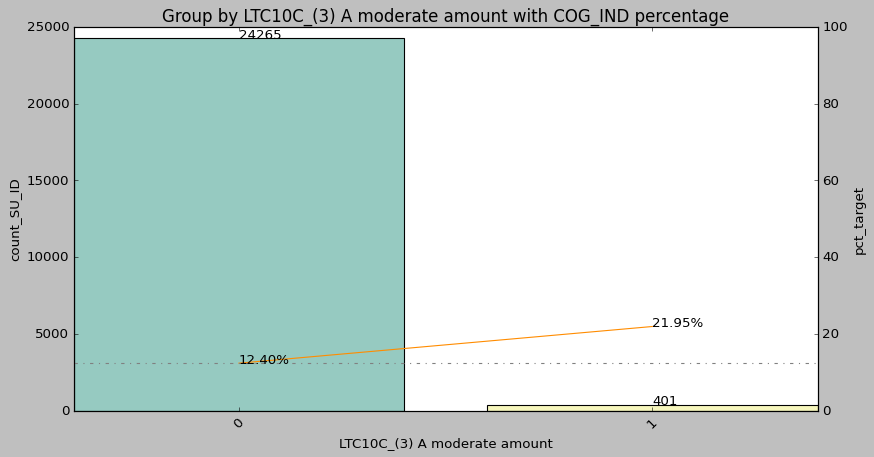

LTC10C_(4) Only a little
Social Security


,LTC10C_(4) Only a little,count_SU_ID,sum_COG_IND,pct_target
0,0,24534,3078,0.1255
1,1,132,20,0.1515


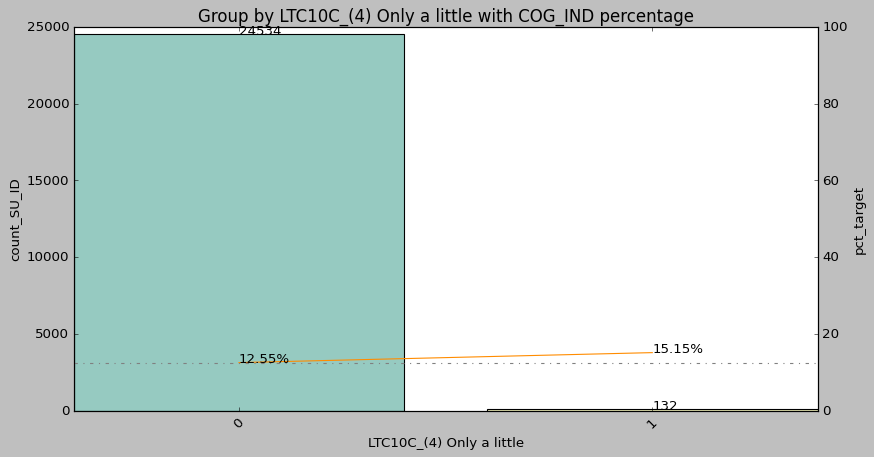

LTC10C_(5) Not at all
Social Security


,LTC10C_(5) Not at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24598,3089,0.1256
1,1,68,9,0.1324


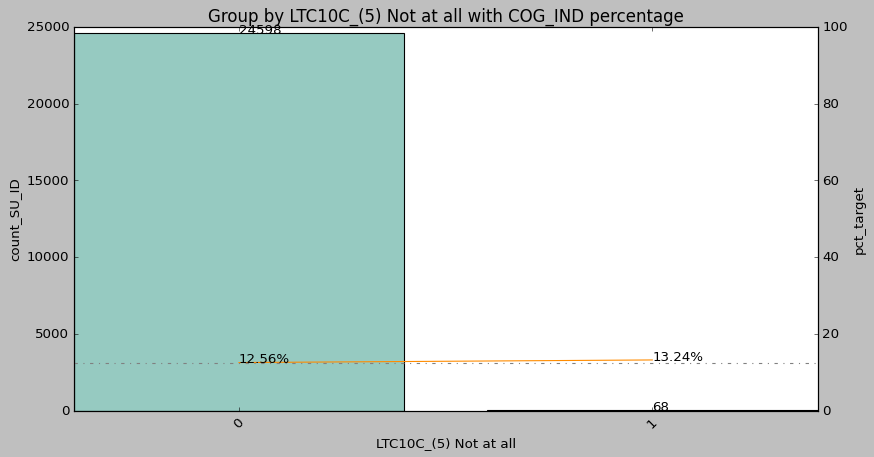

LTC10C_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Social Security


,LTC10C_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24656,3096,0.1256
1,1,10,2,0.2000


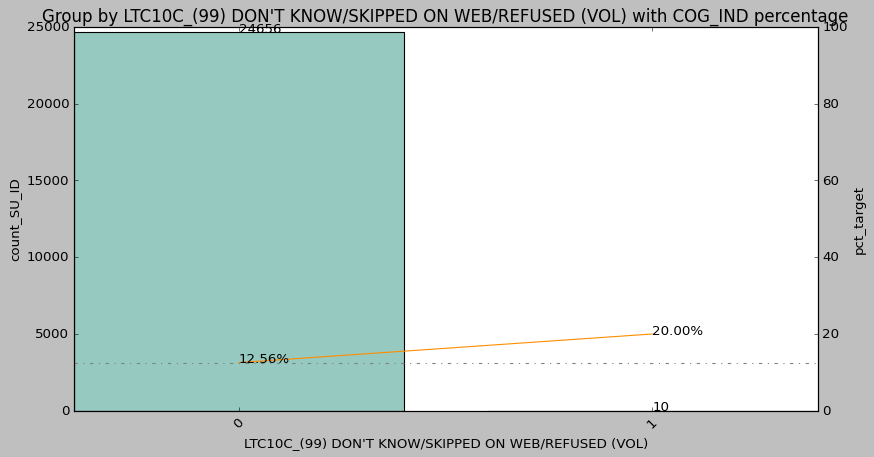

LTC10D_(3) A moderate amount
Sources of future income other than Social Security, a pension, or your personal savings or investments


,LTC10D_(3) A moderate amount,count_SU_ID,sum_COG_IND,pct_target
0,0,24425,3016,0.1235
1,1,241,82,0.3402


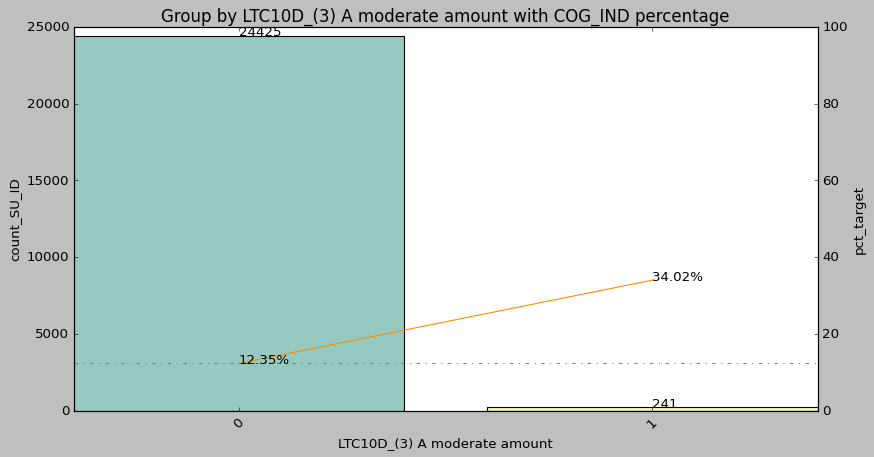

LTC10D_(4) Only a little
Sources of future income other than Social Security, a pension, or your personal savings or investments


,LTC10D_(4) Only a little,count_SU_ID,sum_COG_IND,pct_target
0,0,24555,3069,0.1250
1,1,111,29,0.2613


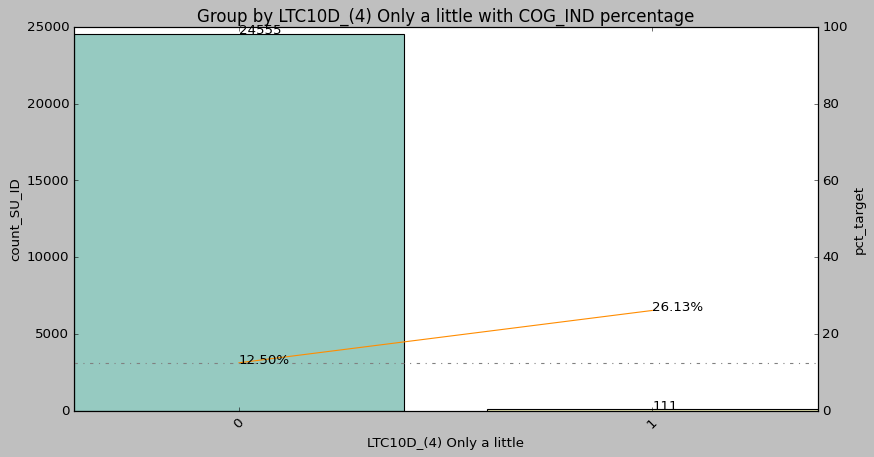

LTC10D_(5) Not at all
Sources of future income other than Social Security, a pension, or your personal savings or investments


,LTC10D_(5) Not at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24137,3072,0.1273
1,1,529,26,0.0491


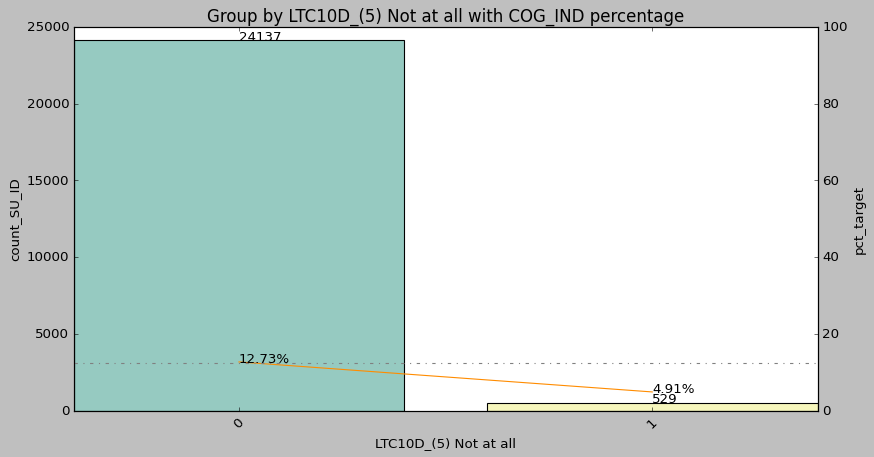

LTC10D_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Sources of future income other than Social Security, a pension, or your personal savings or investments


,LTC10D_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24651,3096,0.1256
1,1,15,2,0.1333


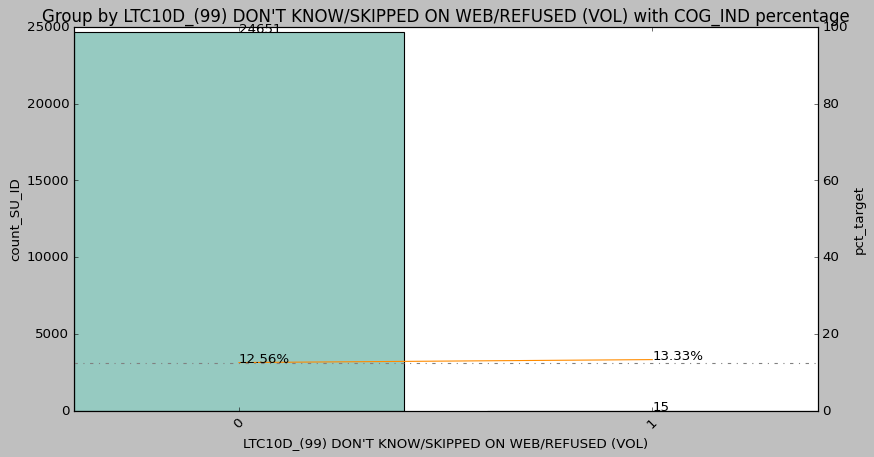

LTC10E_(3) A moderate amount
A family members ability to provide care at no cost


,LTC10E_(3) A moderate amount,count_SU_ID,sum_COG_IND,pct_target
0,0,24346,3024,0.1242
1,1,320,74,0.2312


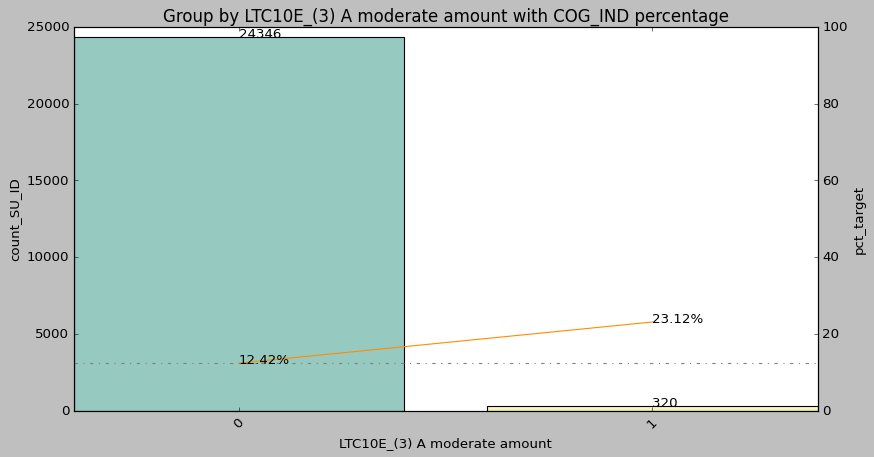

LTC10E_(4) Only a little
A family members ability to provide care at no cost


,LTC10E_(4) Only a little,count_SU_ID,sum_COG_IND,pct_target
0,0,24370,3045,0.1249
1,1,296,53,0.1791


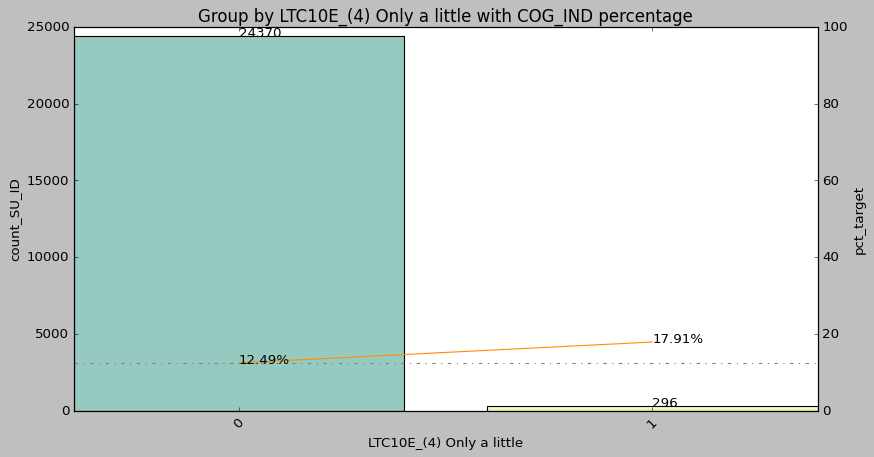

LTC10E_(5) Not at all
A family members ability to provide care at no cost


,LTC10E_(5) Not at all,count_SU_ID,sum_COG_IND,pct_target
0,0,23971,3062,0.1277
1,1,695,36,0.0518


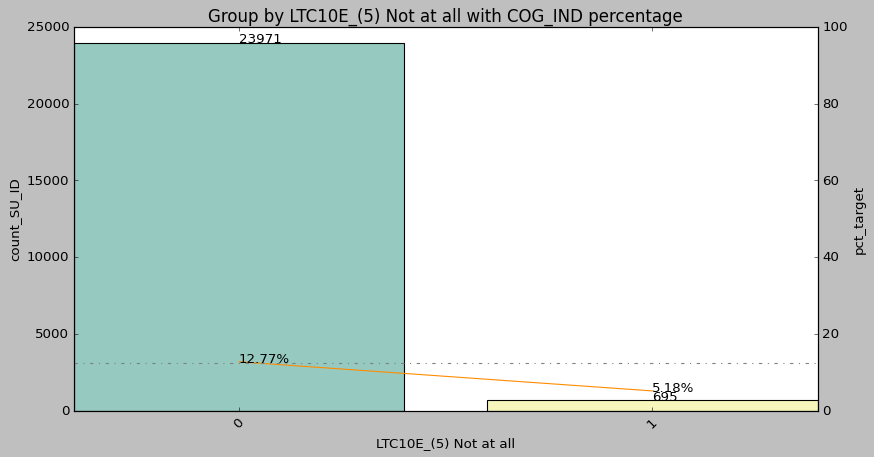

LTC10E_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
A family members ability to provide care at no cost


,LTC10E_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24659,3096,0.1256
1,1,7,2,0.2857


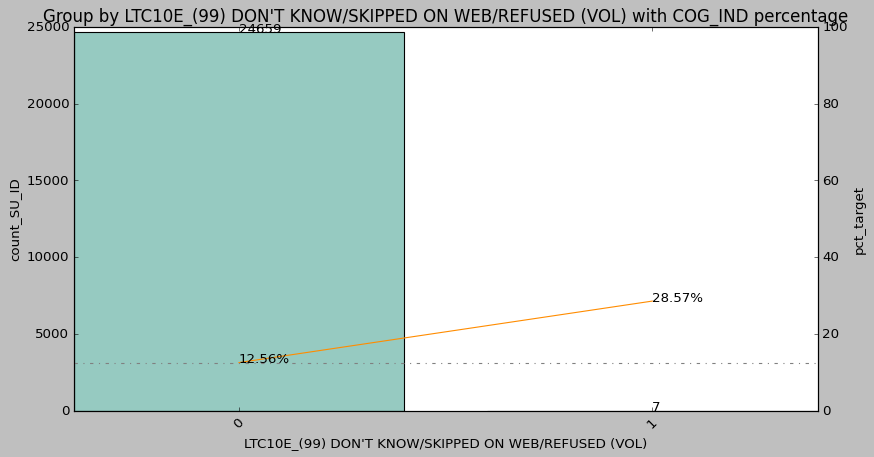

LTC10F_(3) A moderate amount
Medicaid, which is a government health care coverage program for low income people and people with certain disabilities


,LTC10F_(3) A moderate amount,count_SU_ID,sum_COG_IND,pct_target
0,0,24380,3017,0.1237
1,1,286,81,0.2832


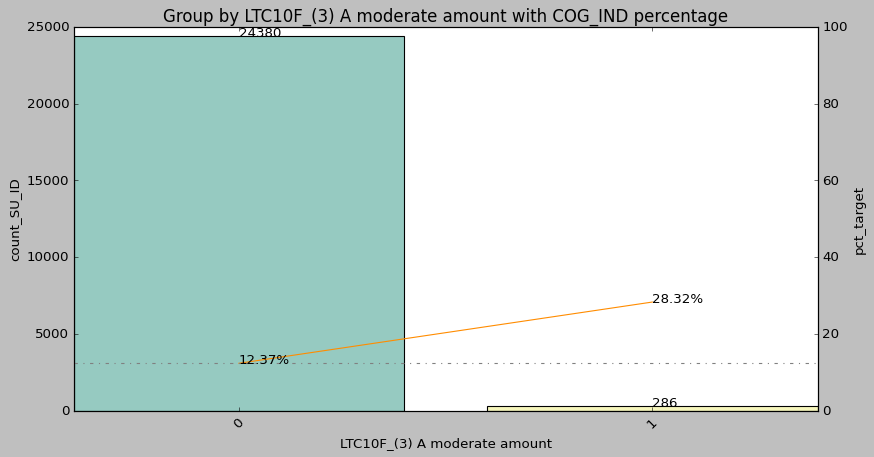

LTC10F_(4) Only a little
Medicaid, which is a government health care coverage program for low income people and people with certain disabilities


,LTC10F_(4) Only a little,count_SU_ID,sum_COG_IND,pct_target
0,0,24518,3069,0.1252
1,1,148,29,0.1959


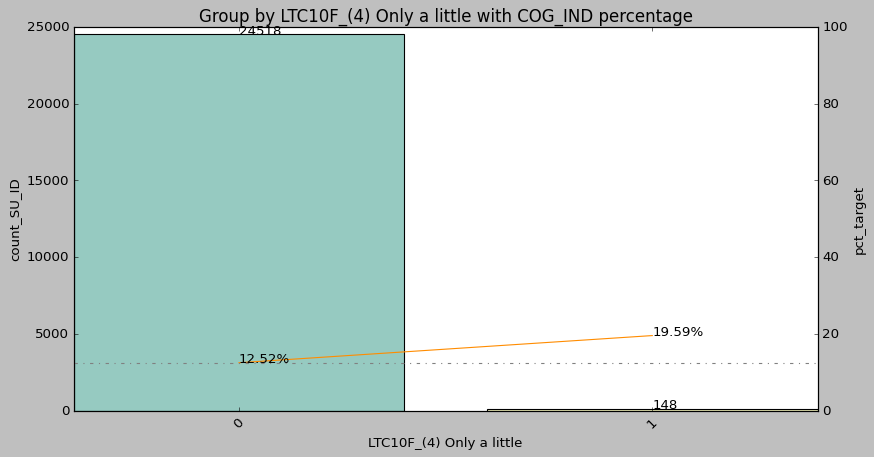

LTC10F_(5) Not at all
Medicaid, which is a government health care coverage program for low income people and people with certain disabilities


,LTC10F_(5) Not at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24233,3038,0.1254
1,1,433,60,0.1386


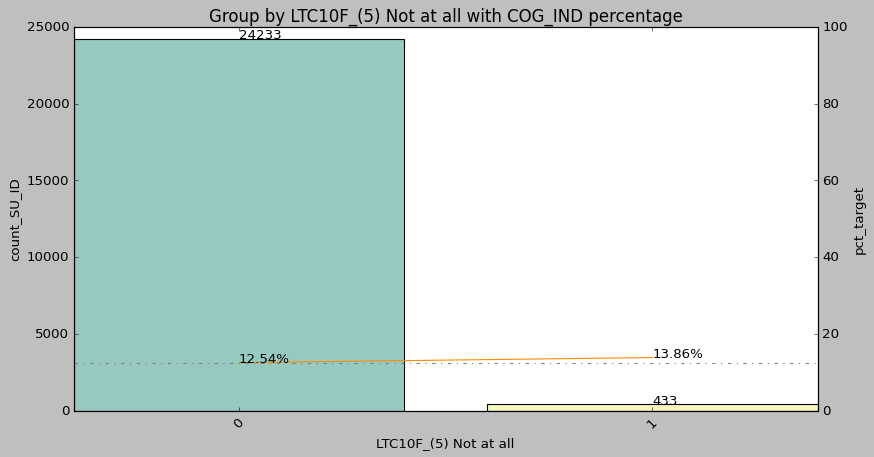

LTC10F_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Medicaid, which is a government health care coverage program for low income people and people with certain disabilities


,LTC10F_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24656,3096,0.1256
1,1,10,2,0.2000


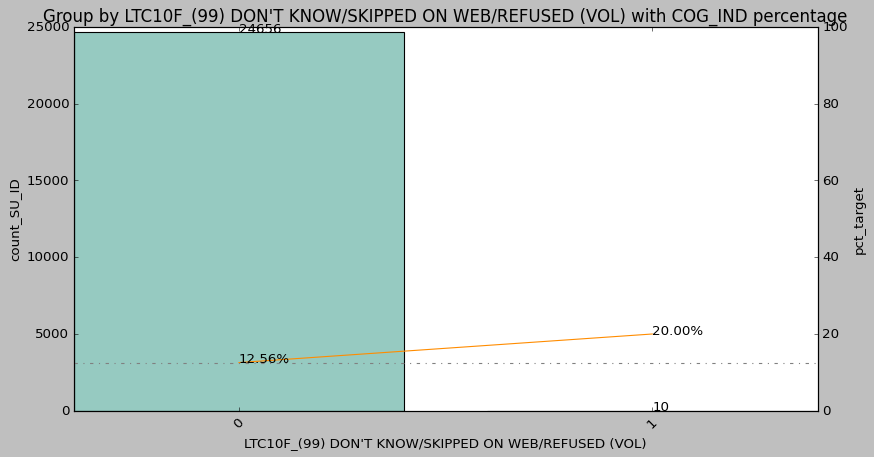

LTC10G_(3) A moderate amount
Medicare, which is the national health care insurance program mainly for seniors


,LTC10G_(3) A moderate amount,count_SU_ID,sum_COG_IND,pct_target
0,0,24377,2983,0.1224
1,1,289,115,0.3979


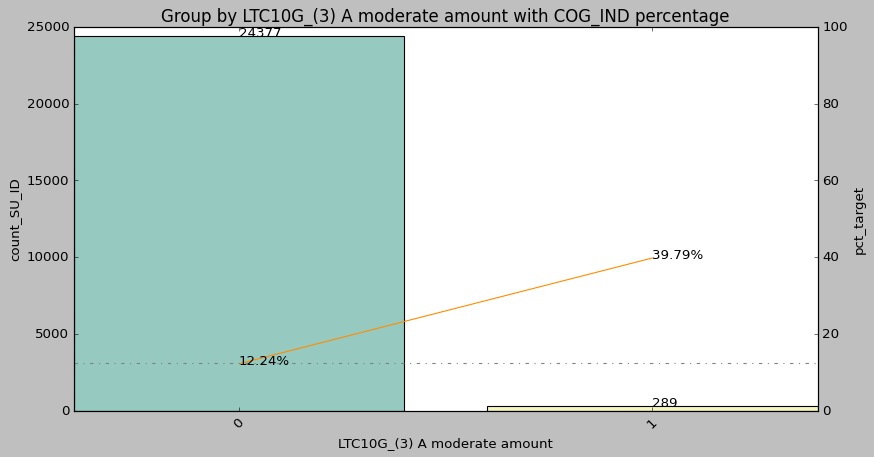

LTC10G_(4) Only a little
Medicare, which is the national health care insurance program mainly for seniors


,LTC10G_(4) Only a little,count_SU_ID,sum_COG_IND,pct_target
0,0,24576,3078,0.1252
1,1,90,20,0.2222


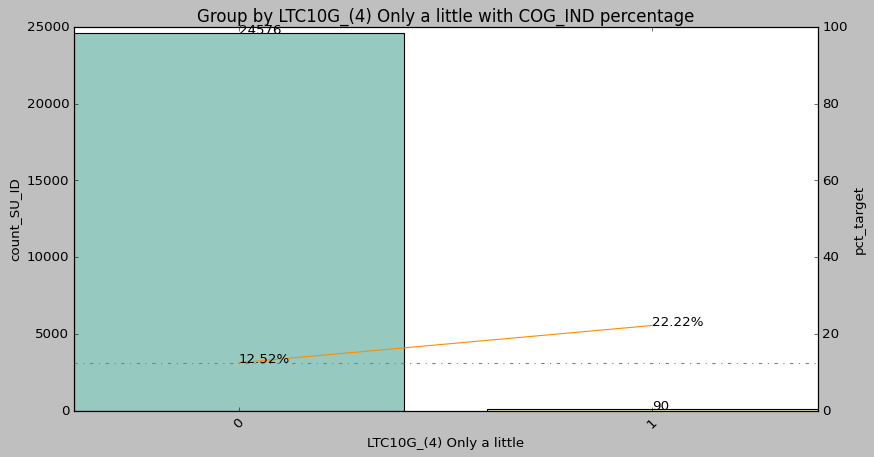

LTC10G_(5) Not at all
Medicare, which is the national health care insurance program mainly for seniors


,LTC10G_(5) Not at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24609,3088,0.1255
1,1,57,10,0.1754


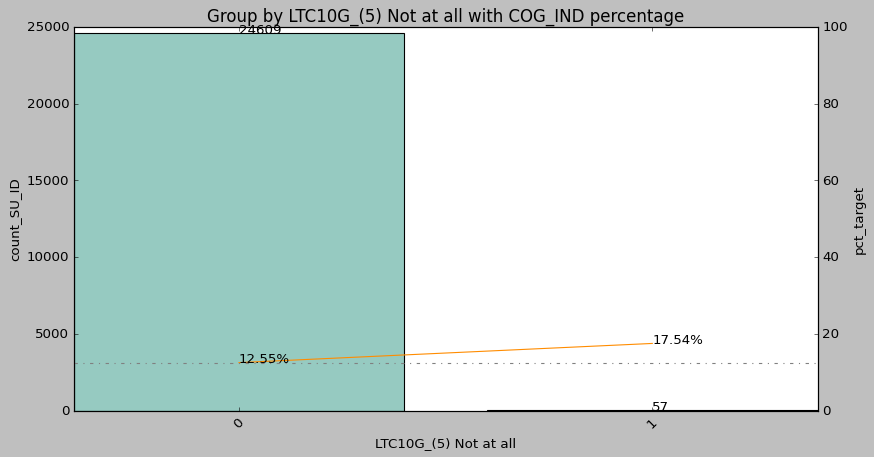

LTC10G_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Medicare, which is the national health care insurance program mainly for seniors


,LTC10G_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24657,3096,0.1256
1,1,9,2,0.2222


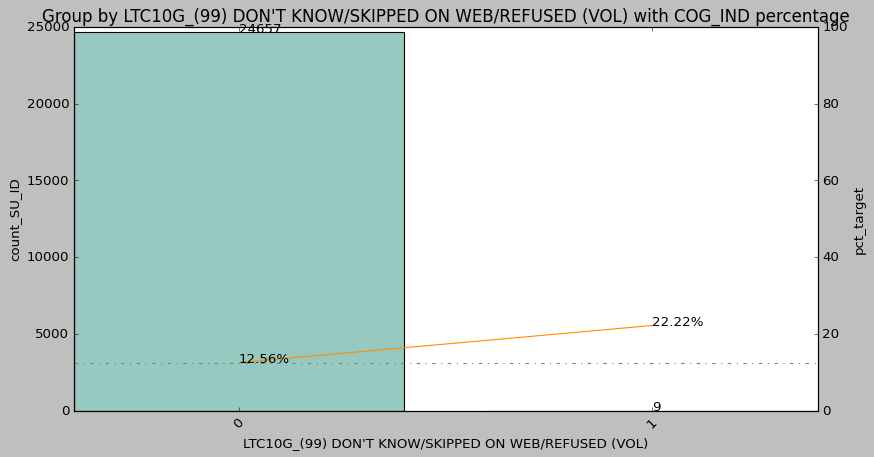

LTC10H_(3) A moderate amount
Long-term care insurance, which is extra insurance that covers expenses of ongoing living assistance


,LTC10H_(3) A moderate amount,count_SU_ID,sum_COG_IND,pct_target
0,0,24437,3024,0.1237
1,1,229,74,0.3231


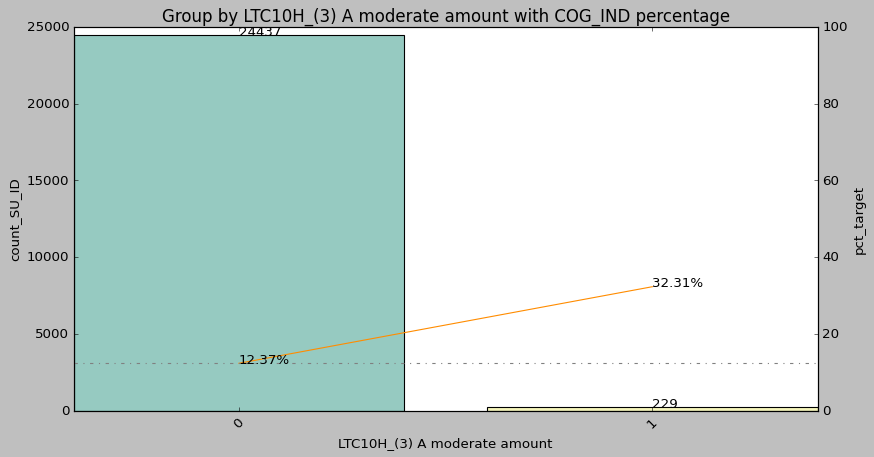

LTC10H_(4) Only a little
Long-term care insurance, which is extra insurance that covers expenses of ongoing living assistance


,LTC10H_(4) Only a little,count_SU_ID,sum_COG_IND,pct_target
0,0,24526,3066,0.1250
1,1,140,32,0.2286


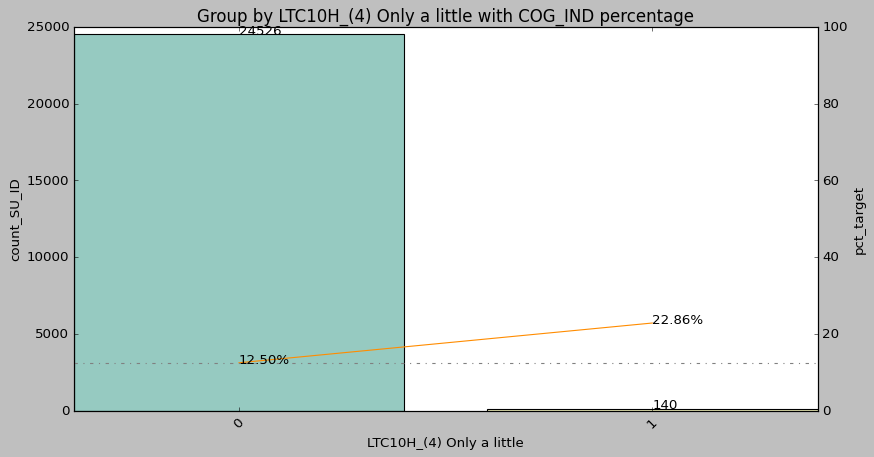

LTC10H_(5) Not at all
Long-term care insurance, which is extra insurance that covers expenses of ongoing living assistance


,LTC10H_(5) Not at all,count_SU_ID,sum_COG_IND,pct_target
0,0,23785,3045,0.1280
1,1,881,53,0.0602


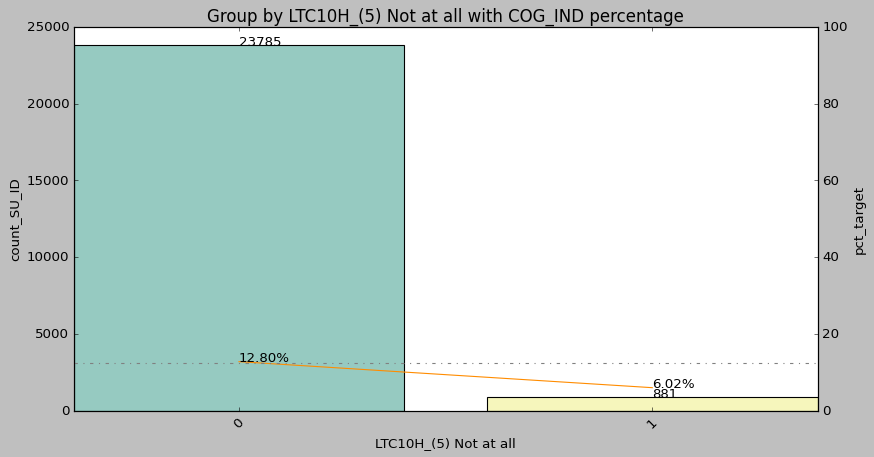

LTC10H_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Long-term care insurance, which is extra insurance that covers expenses of ongoing living assistance


,LTC10H_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24654,3095,0.1255
1,1,12,3,0.2500


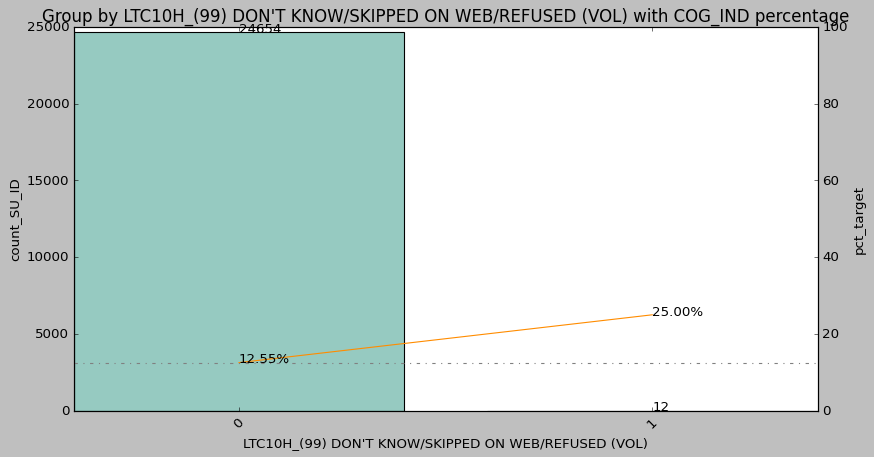

LTC11A_(3) Moderate responsibility
Individuals


,LTC11A_(3) Moderate responsibility,count_SU_ID,sum_COG_IND,pct_target
0,0,23910,2618,0.1095
1,1,756,480,0.6349


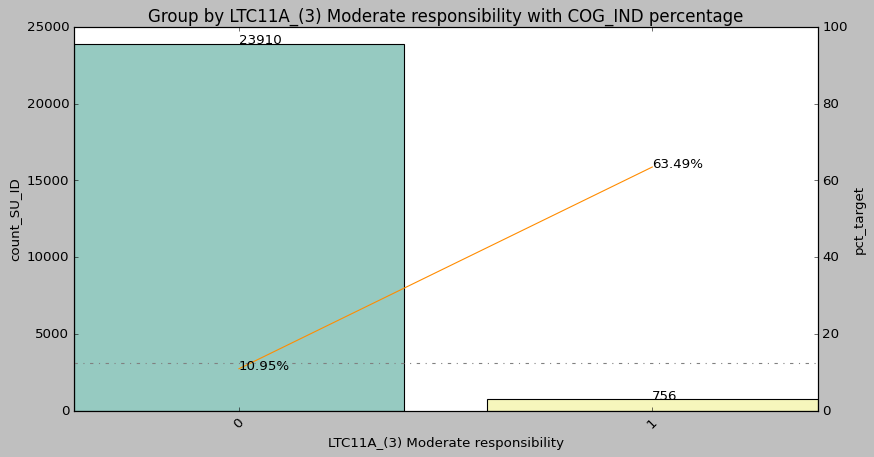

LTC11A_(4) Small responsibility
Individuals


,LTC11A_(4) Small responsibility,count_SU_ID,sum_COG_IND,pct_target
0,0,24340,2972,0.1221
1,1,326,126,0.3865


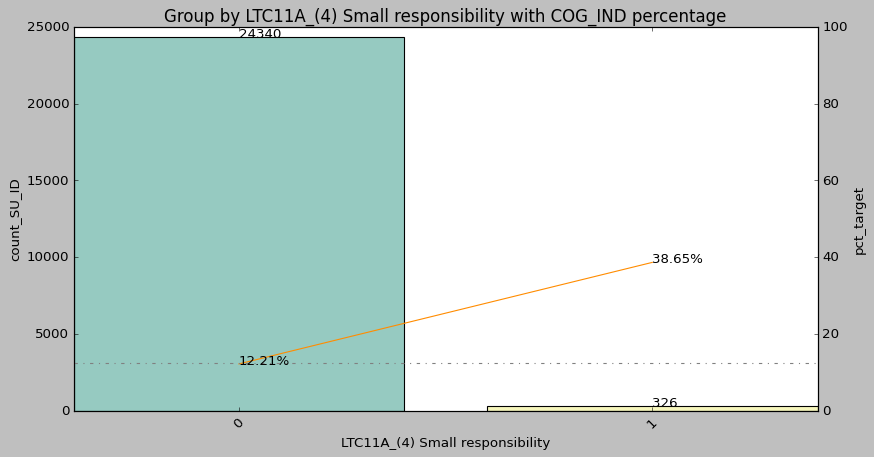

LTC11A_(5) No responsibility at all
Individuals


,LTC11A_(5) No responsibility at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24536,3069,0.1251
1,1,130,29,0.2231


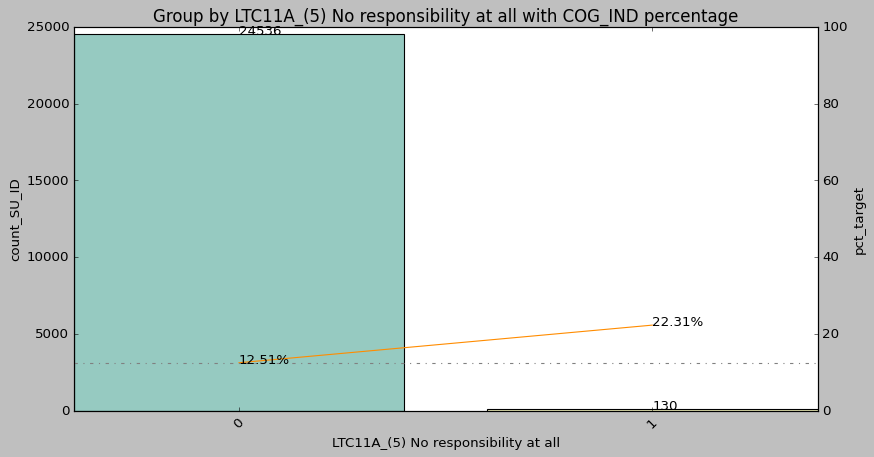

LTC11A_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Individuals


,LTC11A_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24640,3082,0.1251
1,1,26,16,0.6154


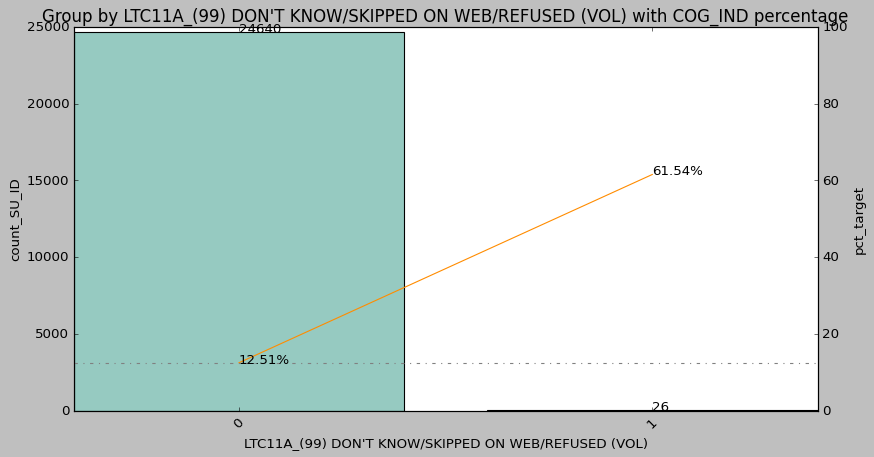

LTC11B_(3) Moderate responsibility
Families


,LTC11B_(3) Moderate responsibility,count_SU_ID,sum_COG_IND,pct_target
0,0,23877,2576,0.1079
1,1,789,522,0.6616


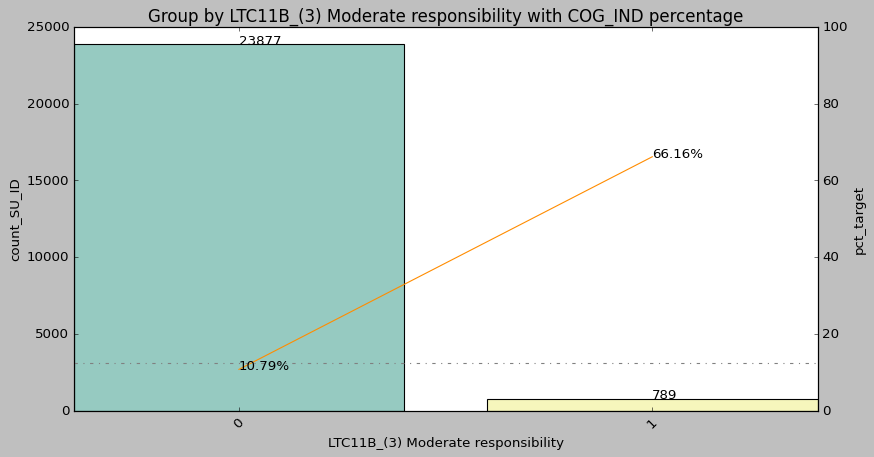

LTC11B_(4) Small responsibility
Families


,LTC11B_(4) Small responsibility,count_SU_ID,sum_COG_IND,pct_target
0,0,24013,2892,0.1204
1,1,653,206,0.3155


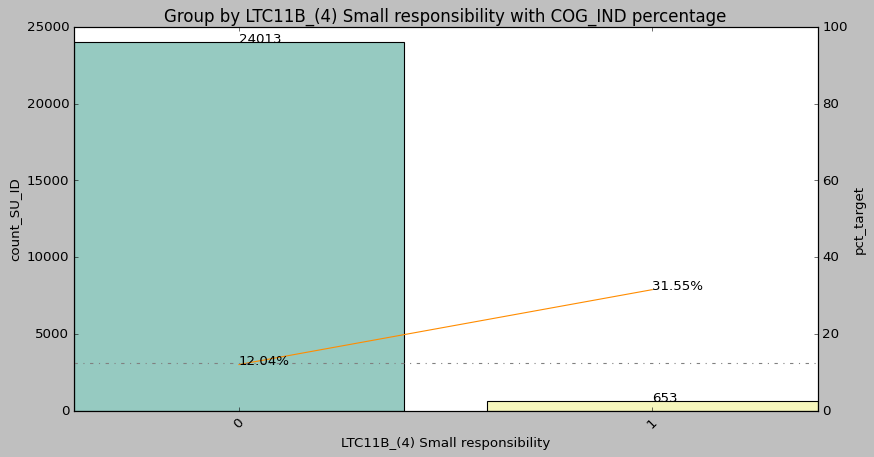

LTC11B_(5) No responsibility at all
Families


,LTC11B_(5) No responsibility at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24200,3006,0.1242
1,1,466,92,0.1974


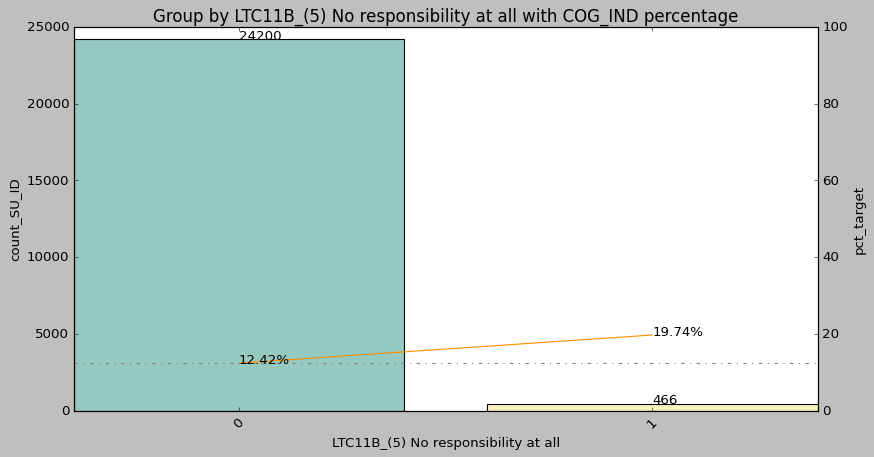

LTC11B_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Families


,LTC11B_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24637,3082,0.1251
1,1,29,16,0.5517


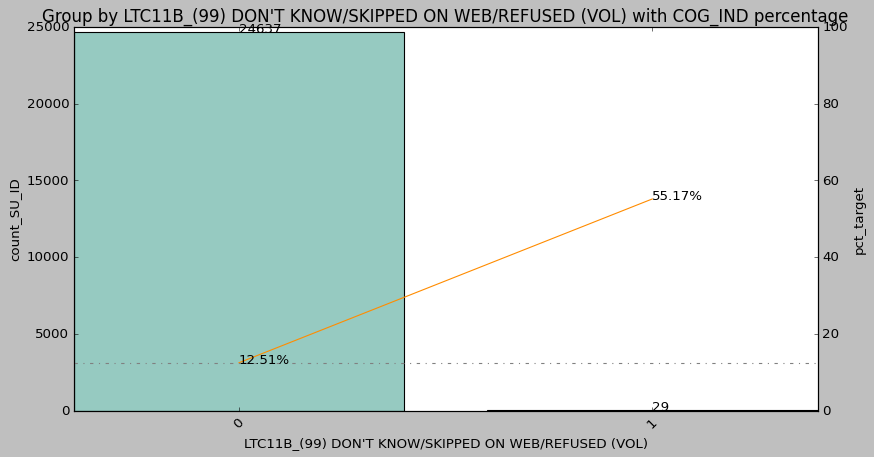

LTC11C_(3) Moderate responsibility
Medicare


,LTC11C_(3) Moderate responsibility,count_SU_ID,sum_COG_IND,pct_target
0,0,23616,2354,0.0997
1,1,1050,744,0.7086


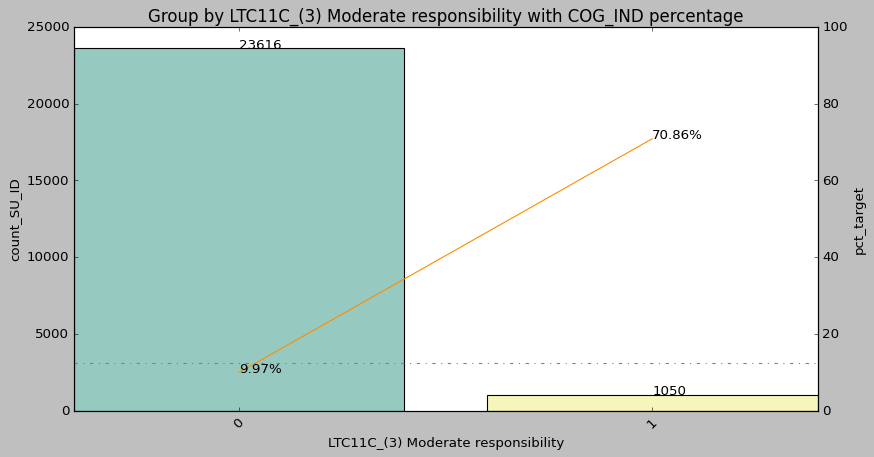

LTC11C_(4) Small responsibility
Medicare


,LTC11C_(4) Small responsibility,count_SU_ID,sum_COG_IND,pct_target
0,0,24571,3035,0.1235
1,1,95,63,0.6632


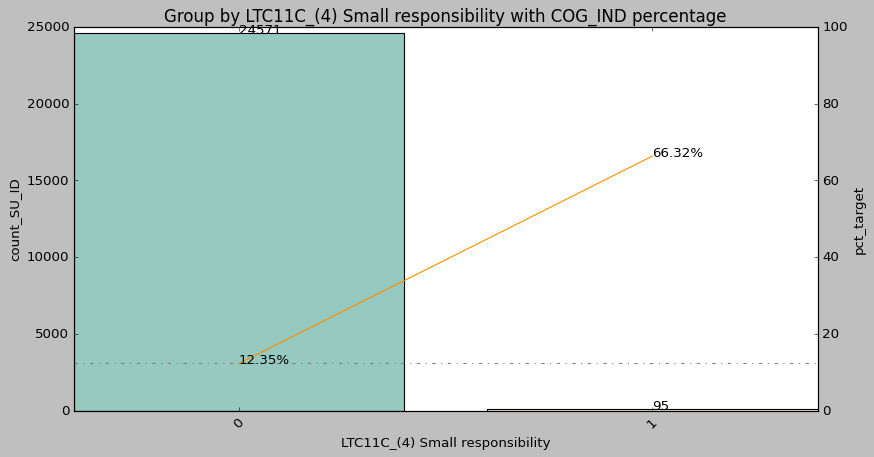

LTC11C_(5) No responsibility at all
Medicare


,LTC11C_(5) No responsibility at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24631,3085,0.1252
1,1,35,13,0.3714


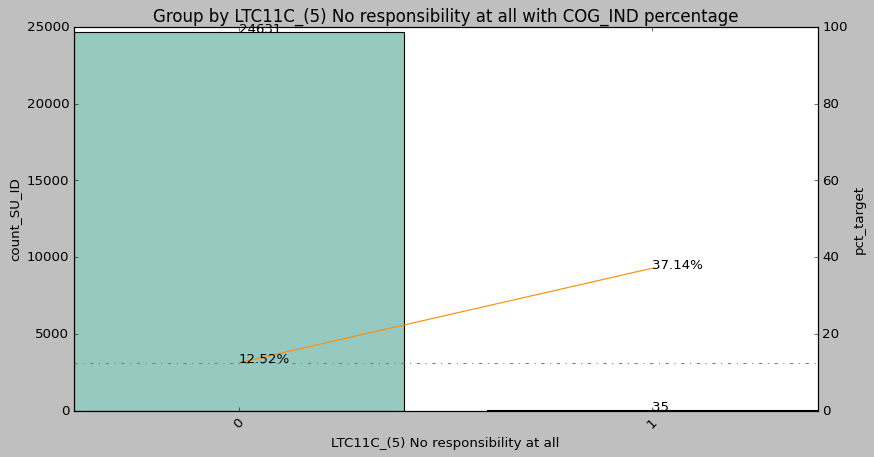

LTC11C_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Medicare


,LTC11C_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24643,3082,0.1251
1,1,23,16,0.6957


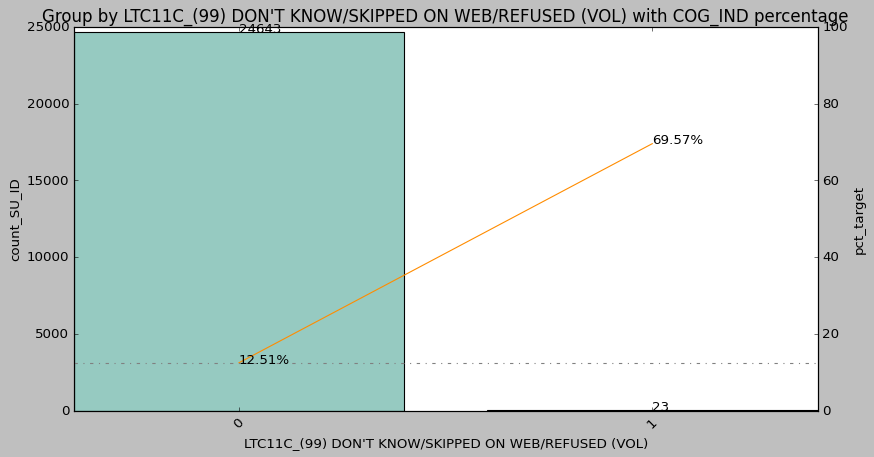

LTC11D_(3) Moderate responsibility
Medicaid


,LTC11D_(3) Moderate responsibility,count_SU_ID,sum_COG_IND,pct_target
0,0,23710,2457,0.1036
1,1,956,641,0.6705


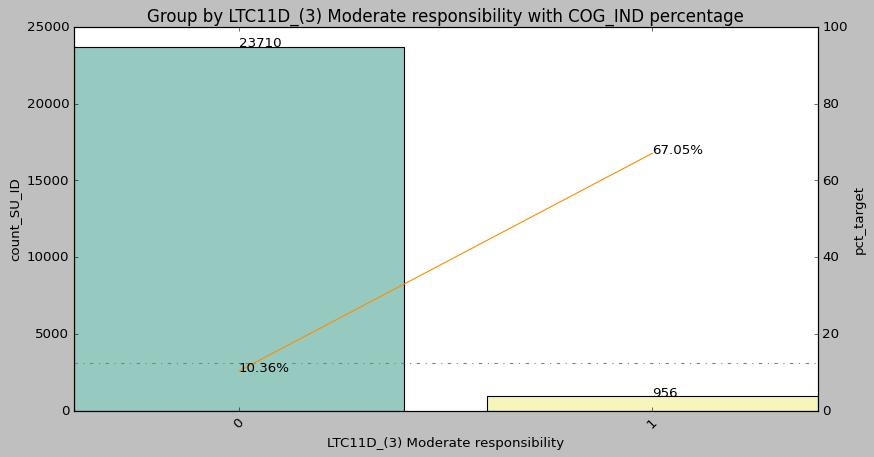

LTC11D_(4) Small responsibility
Medicaid


,LTC11D_(4) Small responsibility,count_SU_ID,sum_COG_IND,pct_target
0,0,24496,3019,0.1232
1,1,170,79,0.4647


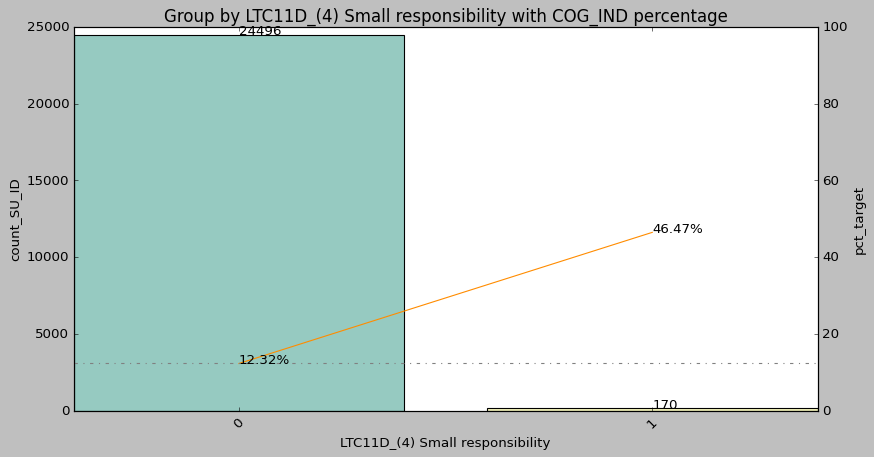

LTC11D_(5) No responsibility at all
Medicaid


,LTC11D_(5) No responsibility at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24563,3073,0.1251
1,1,103,25,0.2427


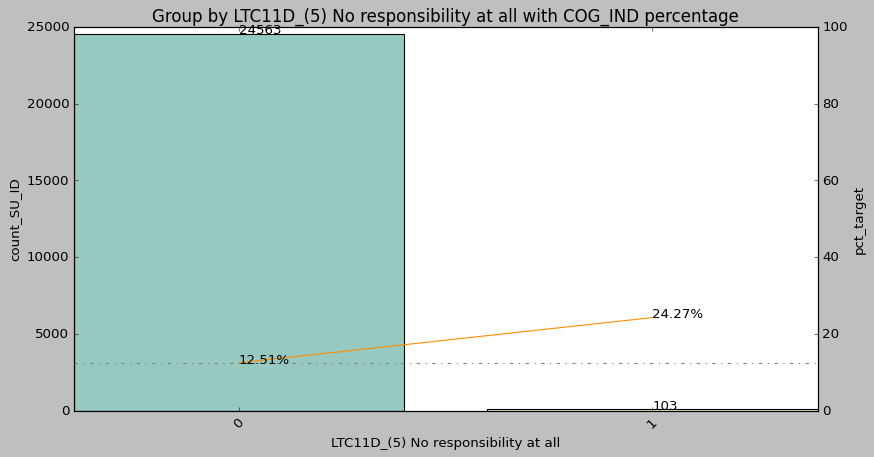

LTC11D_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Medicaid


,LTC11D_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24636,3083,0.1251
1,1,30,15,0.5000


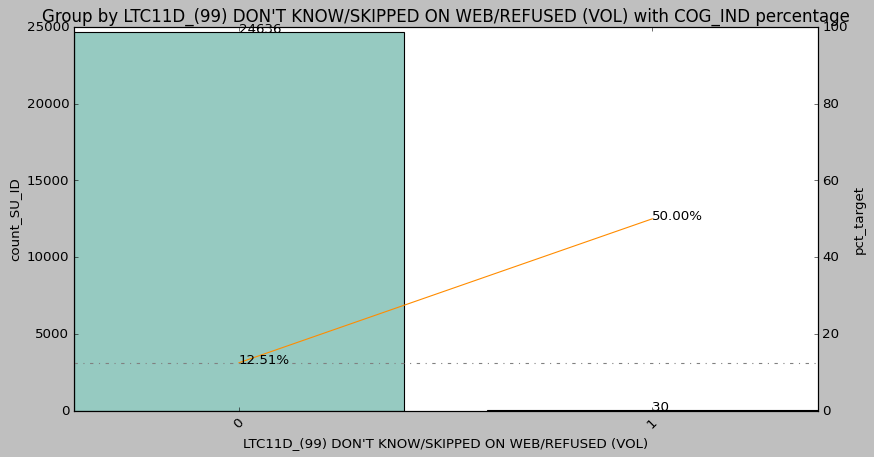

LTC11E_(3) Moderate responsibility
Health insurance companies


,LTC11E_(3) Moderate responsibility,count_SU_ID,sum_COG_IND,pct_target
0,0,23833,2577,0.1081
1,1,833,521,0.6255


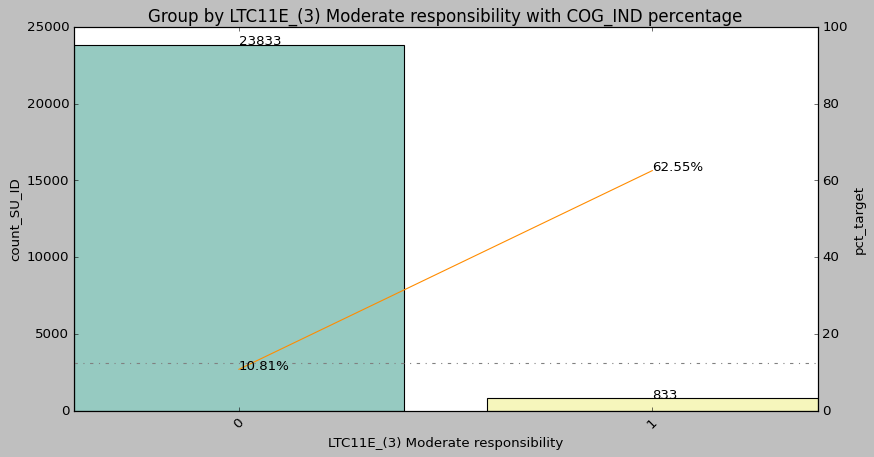

LTC11E_(4) Small responsibility
Health insurance companies


,LTC11E_(4) Small responsibility,count_SU_ID,sum_COG_IND,pct_target
0,0,24571,3055,0.1243
1,1,95,43,0.4526


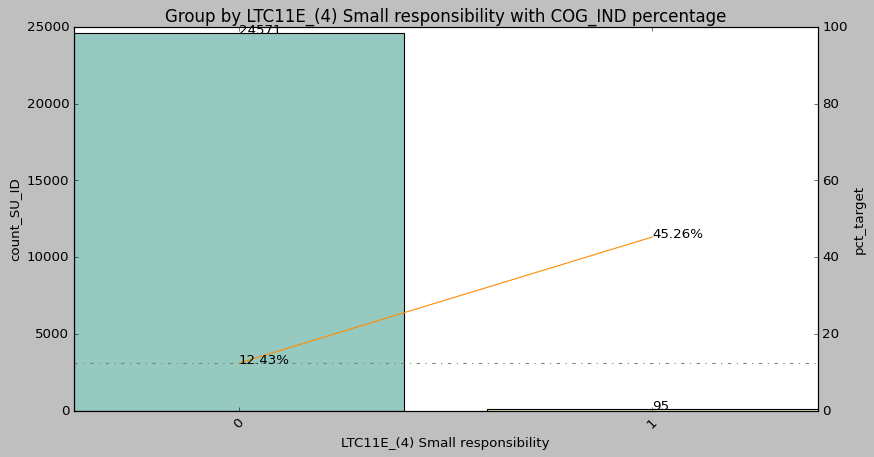

LTC11E_(5) No responsibility at all
Health insurance companies


,LTC11E_(5) No responsibility at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24622,3085,0.1253
1,1,44,13,0.2955


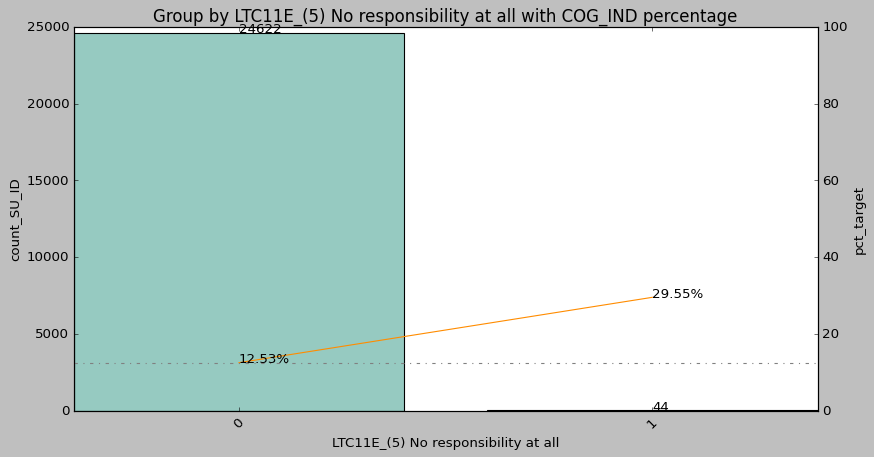

LTC11E_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Health insurance companies


,LTC11E_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24644,3083,0.1251
1,1,22,15,0.6818


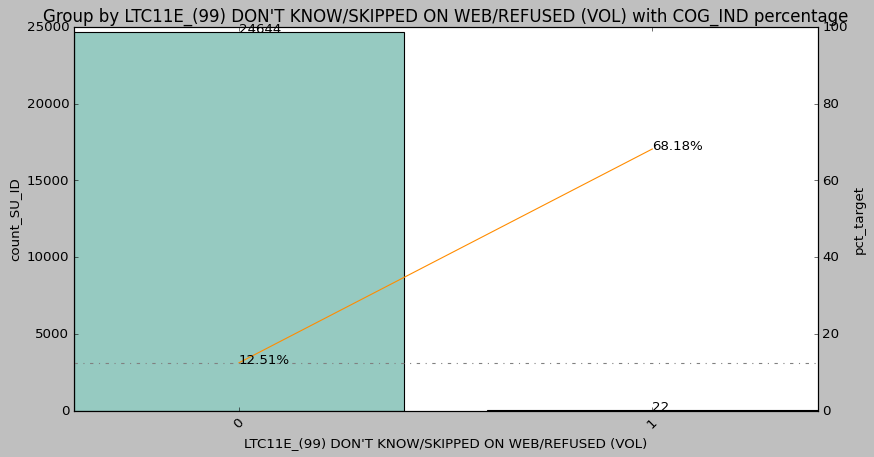

LTC12A_(3) Neither favor nor oppose
A government- administered long-term care insurance program, similar to Medicare


,LTC12A_(3) Neither favor nor oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24089,2690,0.1117
1,1,577,408,0.7071


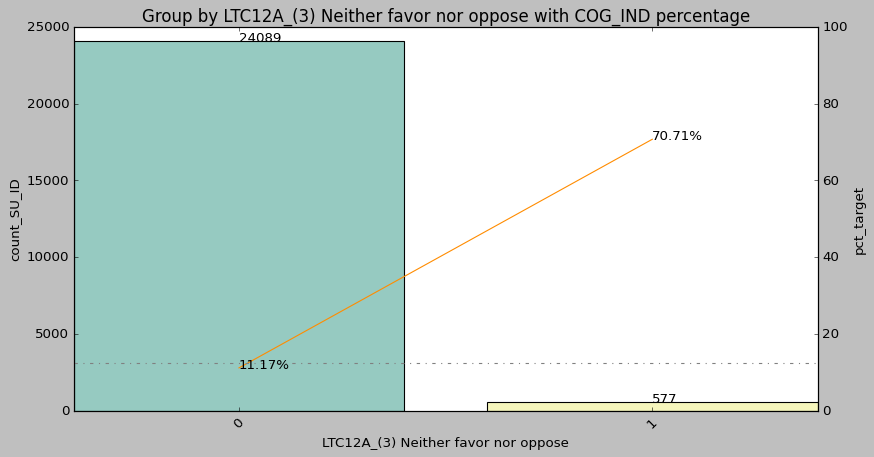

LTC12A_(4) Somewhat oppose
A government- administered long-term care insurance program, similar to Medicare


,LTC12A_(4) Somewhat oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24598,3054,0.1242
1,1,68,44,0.6471


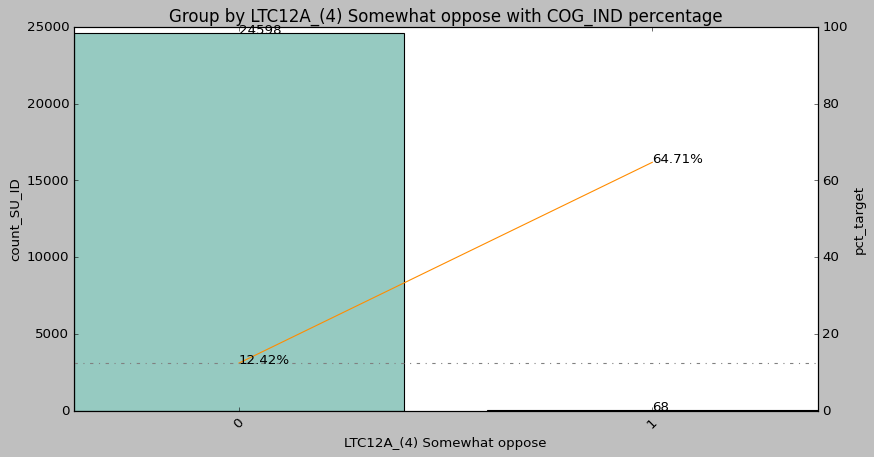

LTC12A_(5) Strongly oppose
A government- administered long-term care insurance program, similar to Medicare


,LTC12A_(5) Strongly oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24611,3077,0.1250
1,1,55,21,0.3818


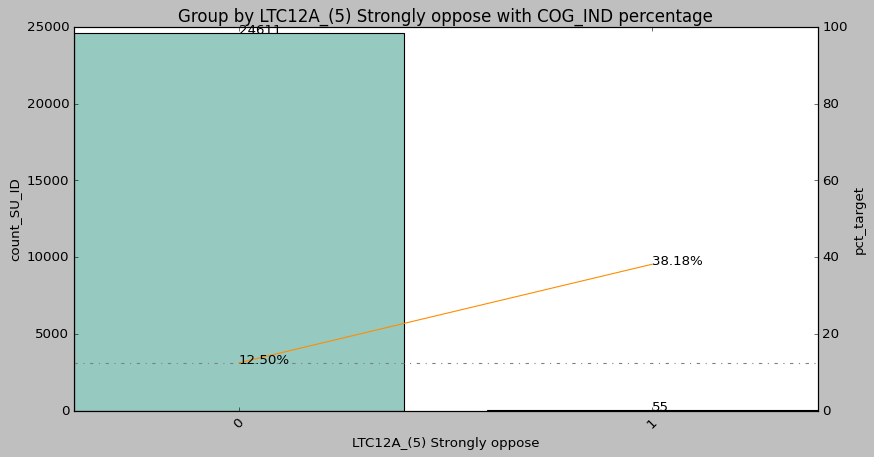

LTC12A_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
A government- administered long-term care insurance program, similar to Medicare


,LTC12A_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24642,3084,0.1252
1,1,24,14,0.5833


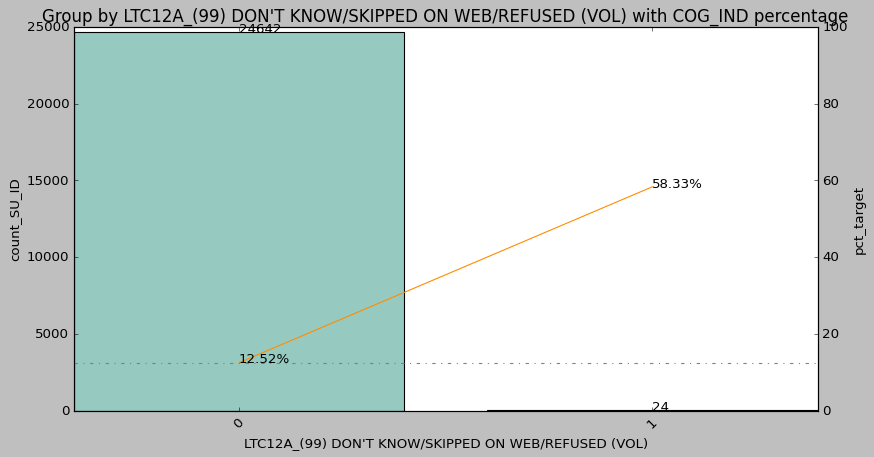

LTC12B_(3) Neither favor nor oppose
Tax breaks for consumers who purchase long- term care insurance


,LTC12B_(3) Neither favor nor oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,23716,2659,0.1121
1,1,950,439,0.4621


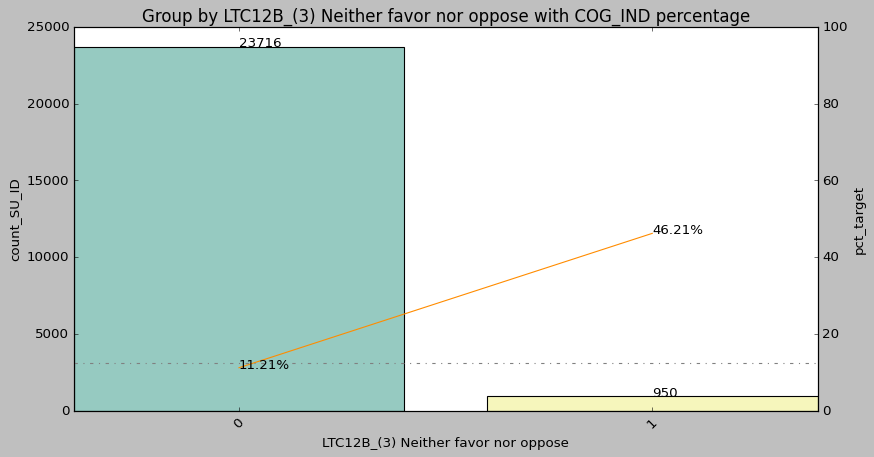

LTC12B_(4) Somewhat oppose
Tax breaks for consumers who purchase long- term care insurance


,LTC12B_(4) Somewhat oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24619,3073,0.1248
1,1,47,25,0.5319


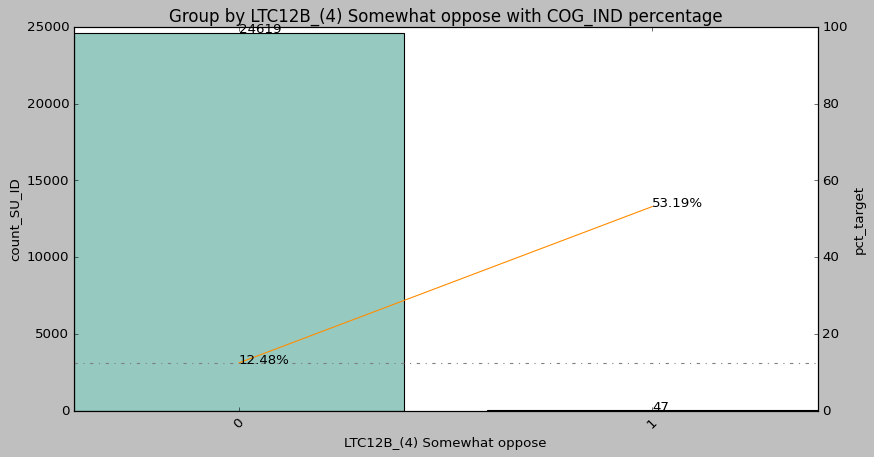

LTC12B_(5) Strongly oppose
Tax breaks for consumers who purchase long- term care insurance


,LTC12B_(5) Strongly oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24635,3089,0.1254
1,1,31,9,0.2903


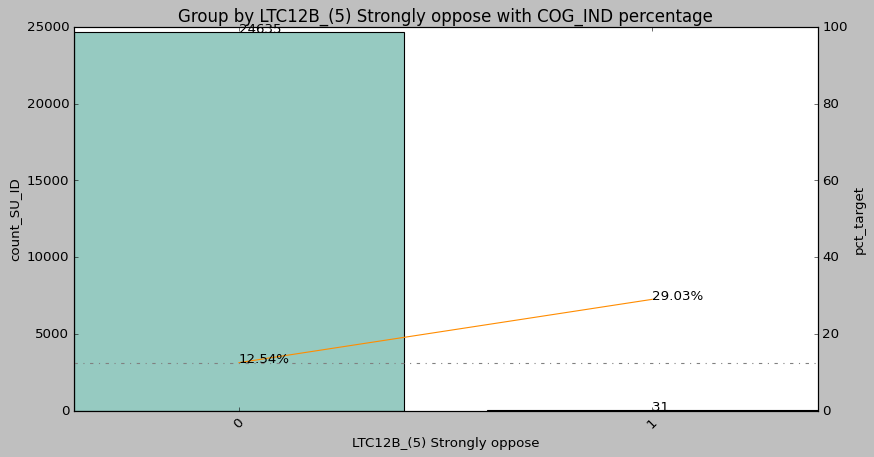

LTC12B_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Tax breaks for consumers who purchase long- term care insurance


,LTC12B_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24639,3081,0.1250
1,1,27,17,0.6296


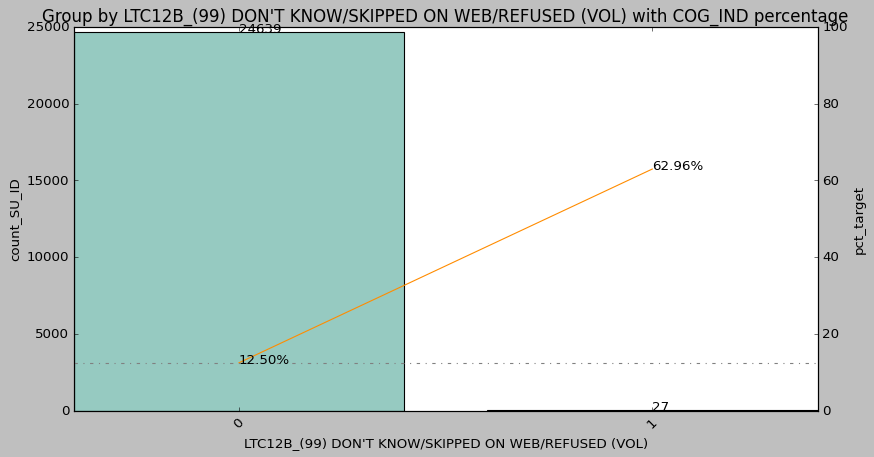

LTC12C_(3) Neither favor nor oppose
The ability to get some long-term care coverage through a Medicare Advantage or supplemental insurance plan


,LTC12C_(3) Neither favor nor oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24267,2795,0.1152
1,1,399,303,0.7594


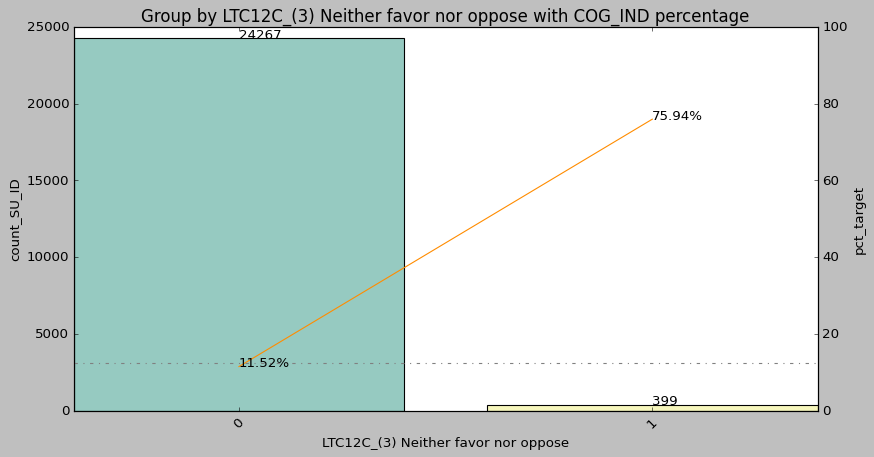

LTC12C_(4) Somewhat oppose
The ability to get some long-term care coverage through a Medicare Advantage or supplemental insurance plan


,LTC12C_(4) Somewhat oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24637,3073,0.1247
1,1,29,25,0.8621


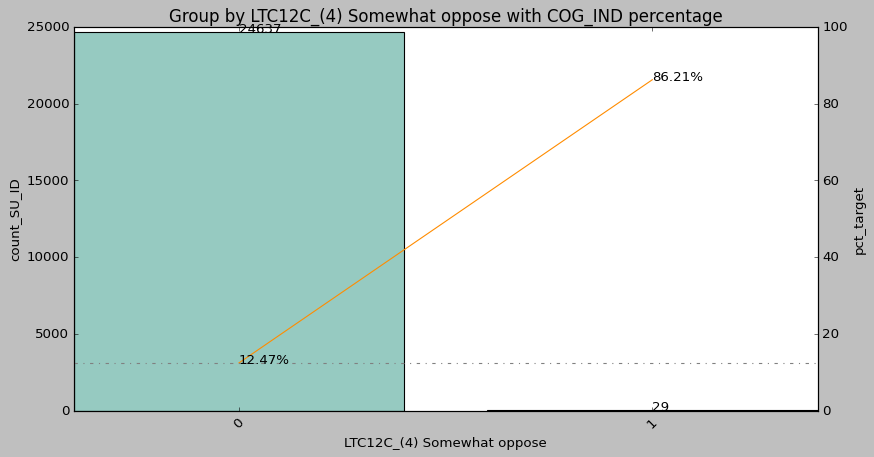

LTC12C_(5) Strongly oppose
The ability to get some long-term care coverage through a Medicare Advantage or supplemental insurance plan


,LTC12C_(5) Strongly oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24644,3090,0.1254
1,1,22,8,0.3636


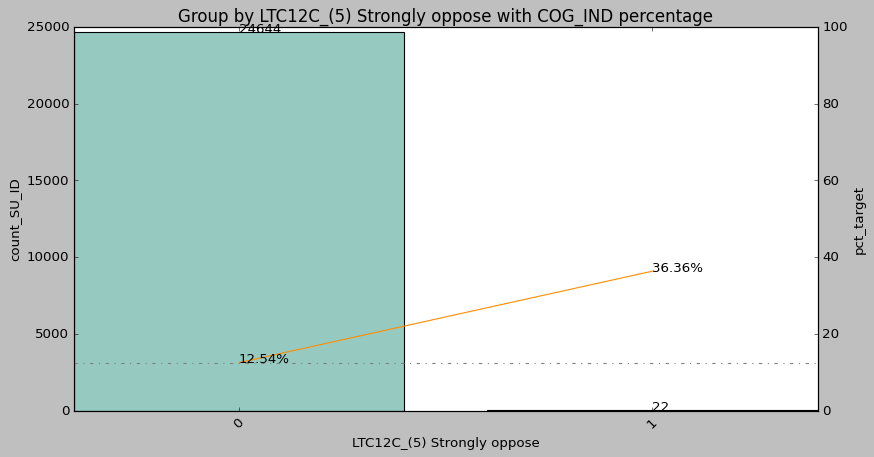

LTC12C_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
The ability to get some long-term care coverage through a Medicare Advantage or supplemental insurance plan


,LTC12C_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24645,3084,0.1251
1,1,21,14,0.6667


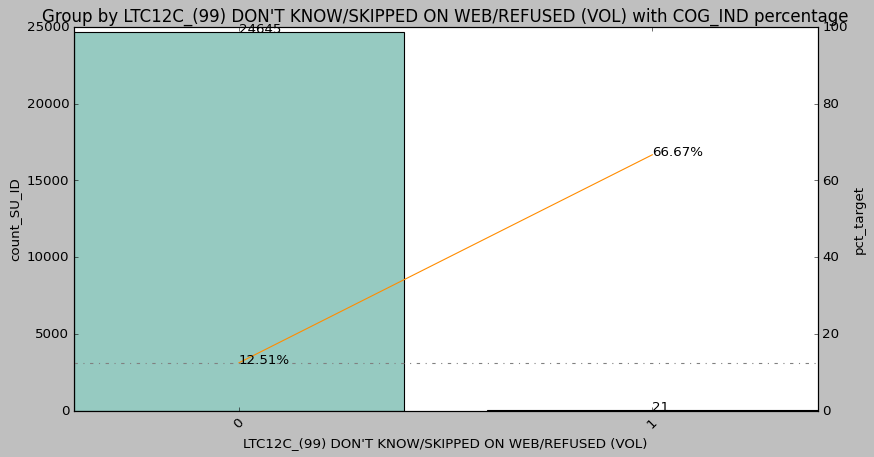

LTC12D_(3) Neither favor nor oppose
Government funding for programs to allow more people with low incomes to receive long-term care in their own homes


,LTC12D_(3) Neither favor nor oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24189,2704,0.1118
1,1,477,394,0.8260


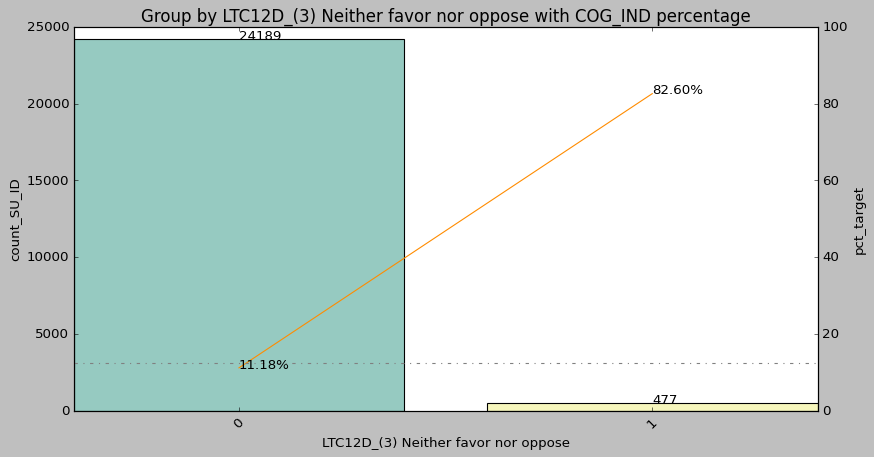

LTC12D_(4) Somewhat oppose
Government funding for programs to allow more people with low incomes to receive long-term care in their own homes


,LTC12D_(4) Somewhat oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24602,3062,0.1245
1,1,64,36,0.5625


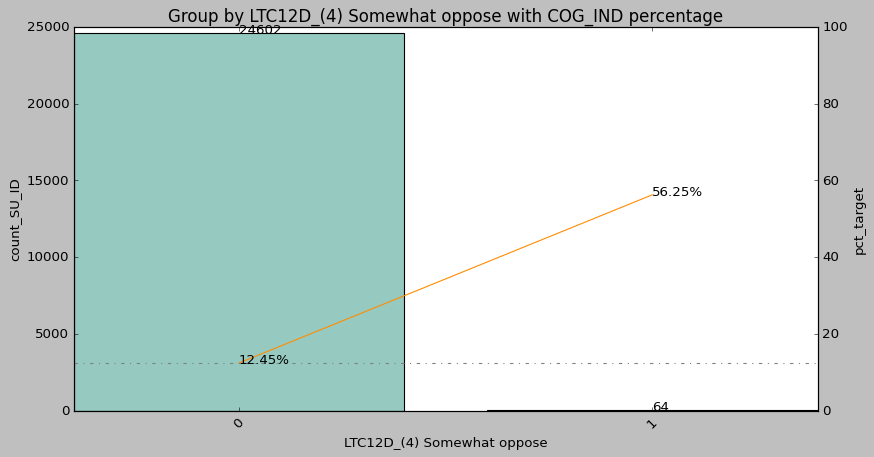

LTC12D_(5) Strongly oppose
Government funding for programs to allow more people with low incomes to receive long-term care in their own homes


,LTC12D_(5) Strongly oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24623,3081,0.1251
1,1,43,17,0.3953


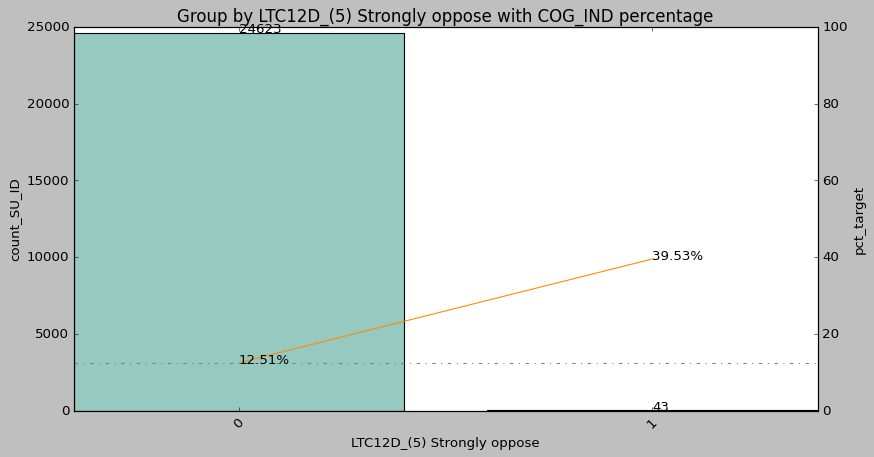

LTC12D_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Government funding for programs to allow more people with low incomes to receive long-term care in their own homes


,LTC12D_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24642,3082,0.1251
1,1,24,16,0.6667


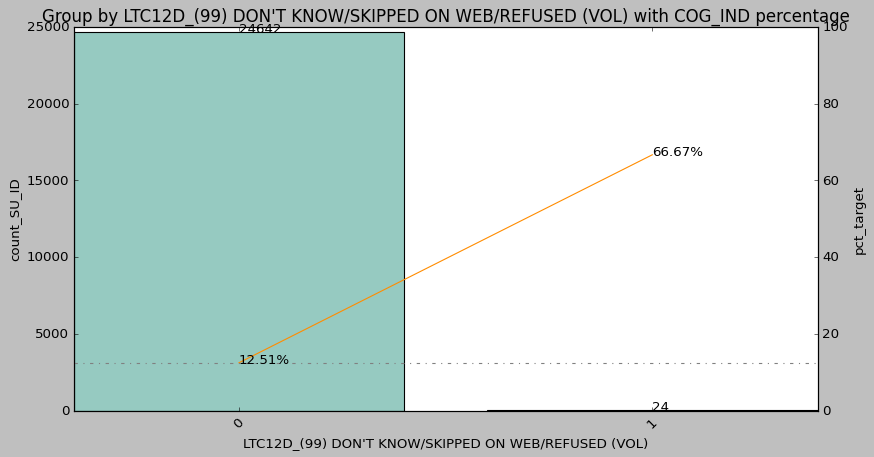

LTC13_(3) Not an important priority
 The Congressional Budget Office expects that the Medicare trust fund, which finances health services for Medicare beneficiaries, will run out of money in 2026. Thinking about the things Congress and the Biden Administration should work on, how much of a priority do you think securing the Medicare trust fund should be this year?


,LTC13_(3) Not an important priority,count_SU_ID,sum_COG_IND,pct_target
0,0,24574,3014,0.1226
1,1,92,84,0.9130


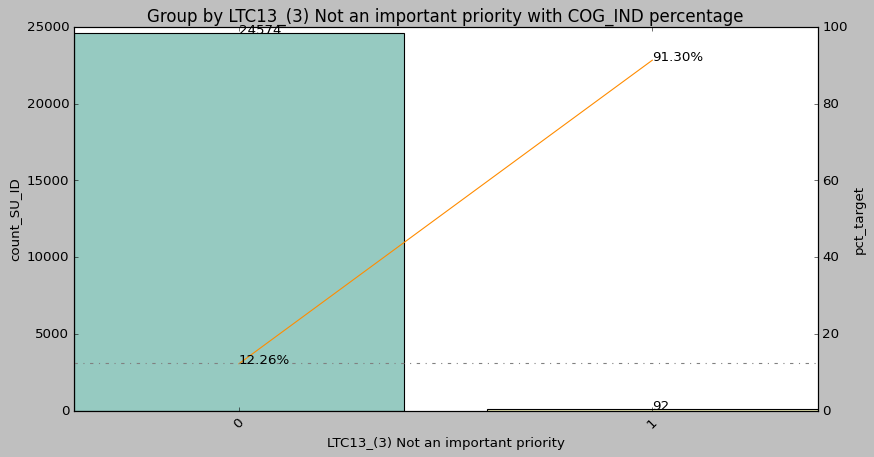

LTC13_(4) Should not be done at all
 The Congressional Budget Office expects that the Medicare trust fund, which finances health services for Medicare beneficiaries, will run out of money in 2026. Thinking about the things Congress and the Biden Administration should work on, how much of a priority do you think securing the Medicare trust fund should be this year?


,LTC13_(4) Should not be done at all,count_SU_ID,sum_COG_IND,pct_target
0,0,24635,3078,0.1249
1,1,31,20,0.6452


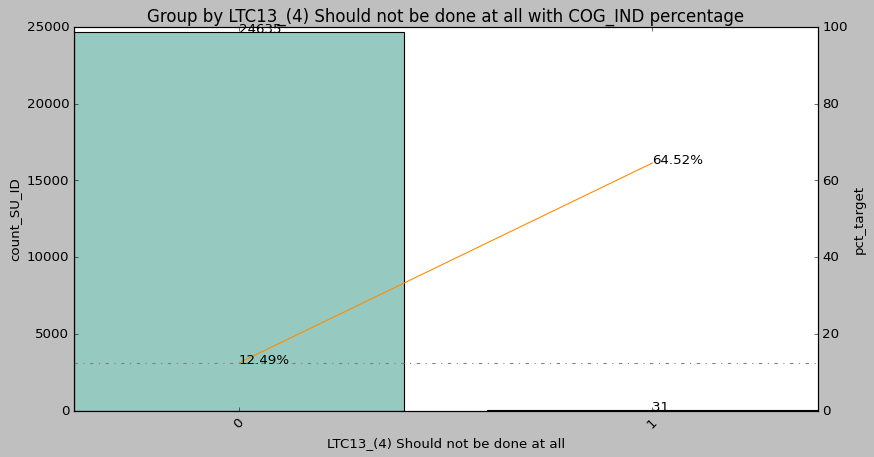

LTC13_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
 The Congressional Budget Office expects that the Medicare trust fund, which finances health services for Medicare beneficiaries, will run out of money in 2026. Thinking about the things Congress and the Biden Administration should work on, how much of a priority do you think securing the Medicare trust fund should be this year?


,LTC13_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24645,3081,0.1250
1,1,21,17,0.8095


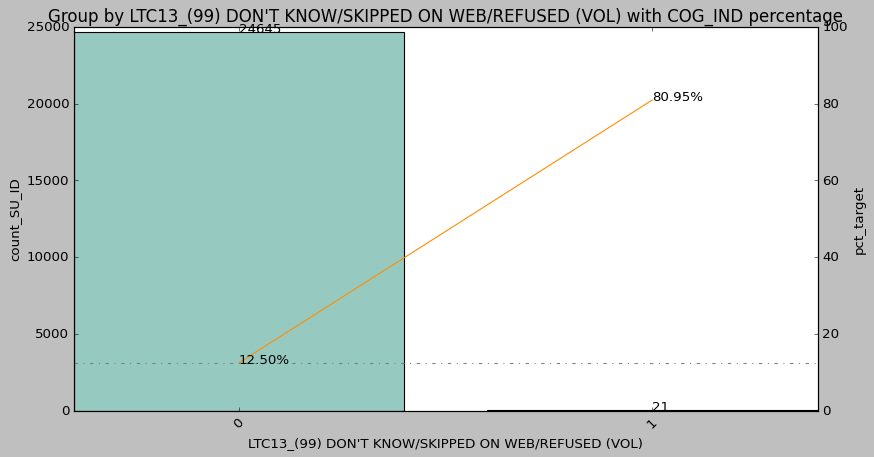

LTC14A_(3) Neither favor nor oppose
Cuts to benefits provided to current Medicare beneficiaries


,LTC14A_(3) Neither favor nor oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24235,2741,0.1131
1,1,431,357,0.8283


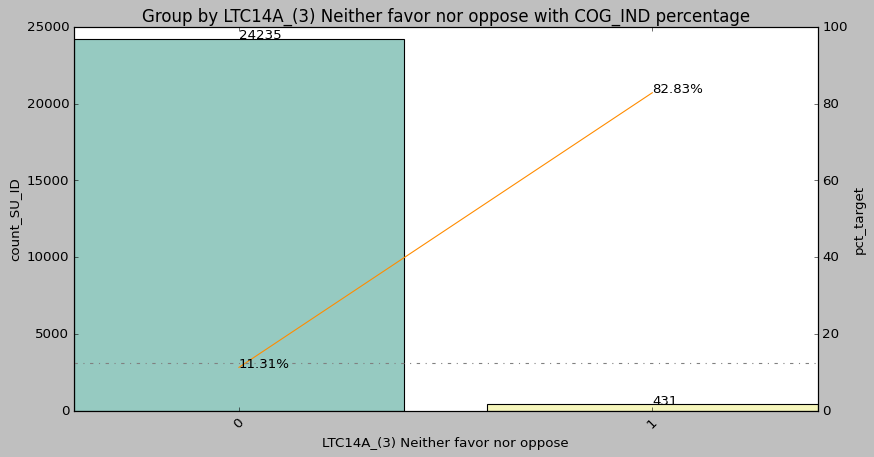

LTC14A_(4) Somewhat oppose
Cuts to benefits provided to current Medicare beneficiaries


,LTC14A_(4) Somewhat oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,23814,2865,0.1203
1,1,852,233,0.2735


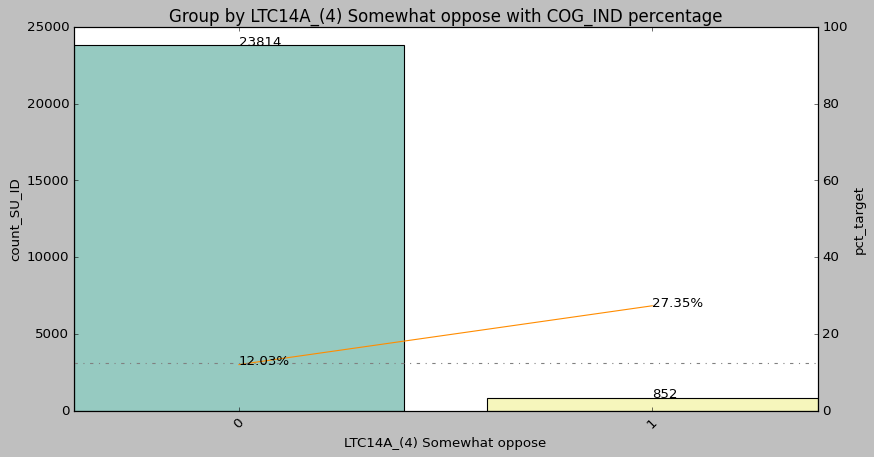

LTC14A_(5) Strongly oppose
Cuts to benefits provided to current Medicare beneficiaries


,LTC14A_(5) Strongly oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,23113,2982,0.1290
1,1,1553,116,0.0747


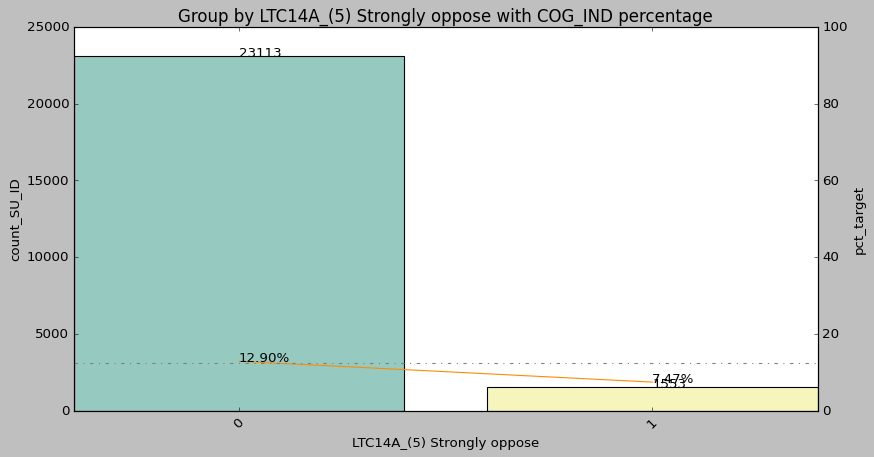

LTC14A_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Cuts to benefits provided to current Medicare beneficiaries


,LTC14A_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24637,3083,0.1251
1,1,29,15,0.5172


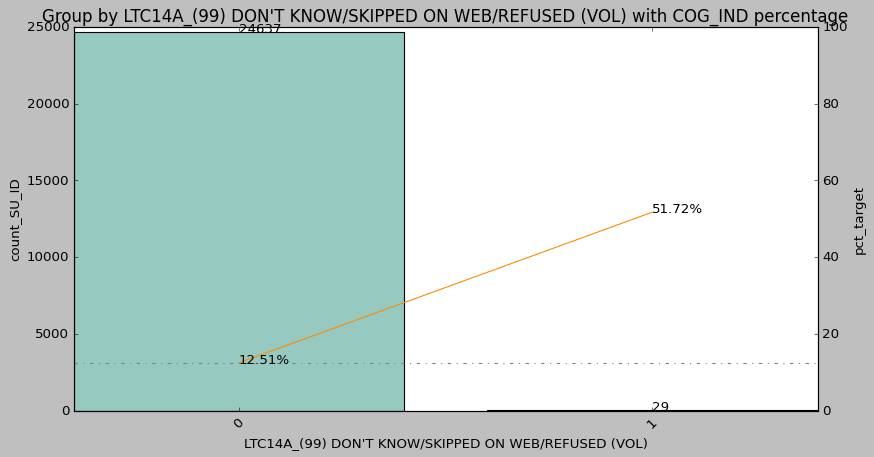

LTC14B_(3) Neither favor nor oppose
Cuts to benefits that would be provided to future Medicare beneficiaries


,LTC14B_(3) Neither favor nor oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,23969,2529,0.1055
1,1,697,569,0.8164


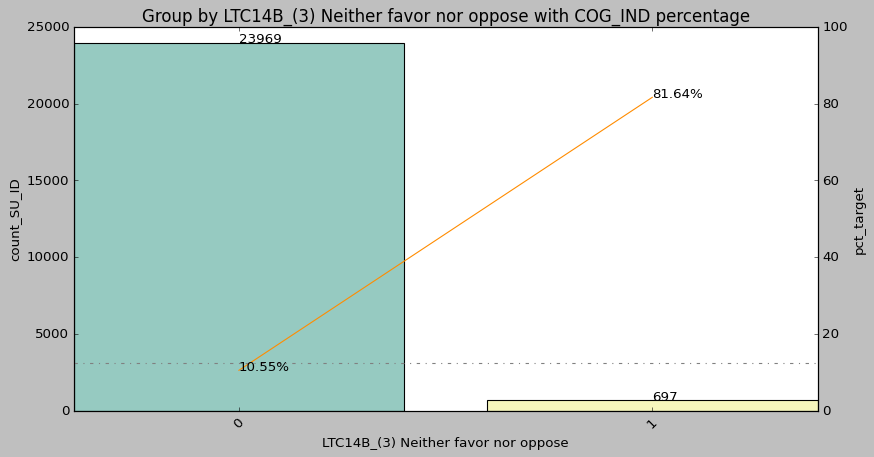

LTC14B_(4) Somewhat oppose
Cuts to benefits that would be provided to future Medicare beneficiaries


,LTC14B_(4) Somewhat oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,23332,2926,0.1254
1,1,1334,172,0.1289


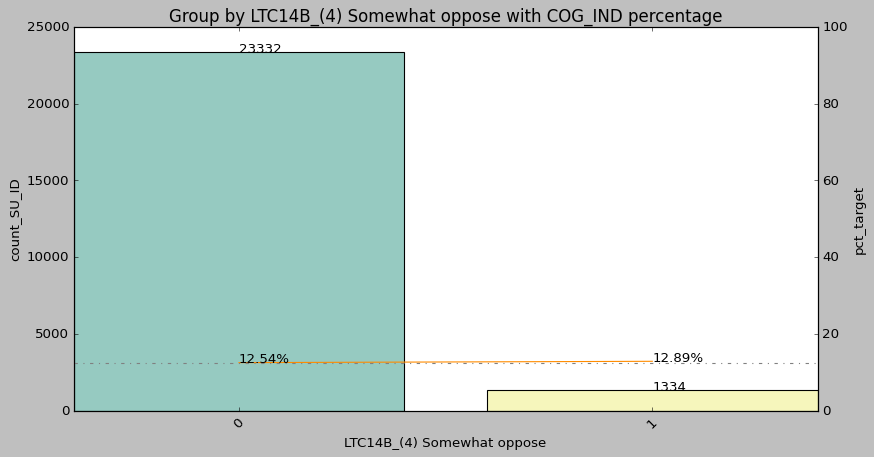

LTC14B_(5) Strongly oppose
Cuts to benefits that would be provided to future Medicare beneficiaries


,LTC14B_(5) Strongly oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,23671,2992,0.1264
1,1,995,106,0.1065


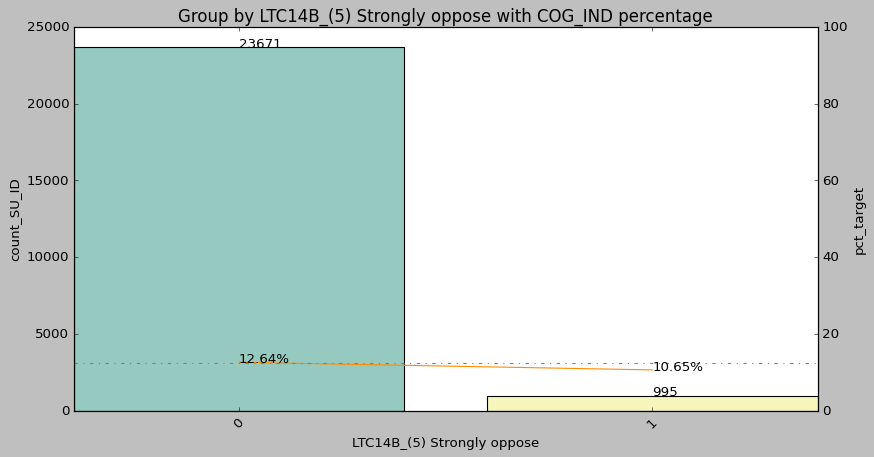

LTC14B_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Cuts to benefits that would be provided to future Medicare beneficiaries


,LTC14B_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24638,3083,0.1251
1,1,28,15,0.5357


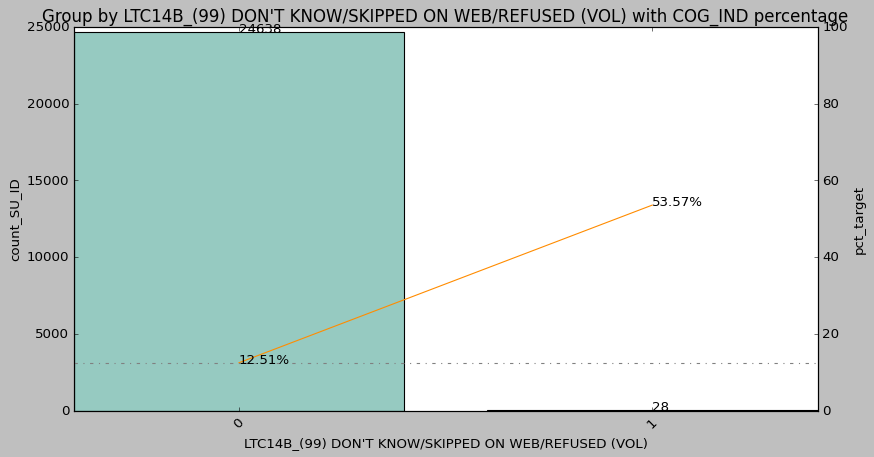

LTC14C_(3) Neither favor nor oppose
Cuts in how much Medicare pays to hospitals, doctors, and other services providers


,LTC14C_(3) Neither favor nor oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,23921,2526,0.1056
1,1,745,572,0.7678


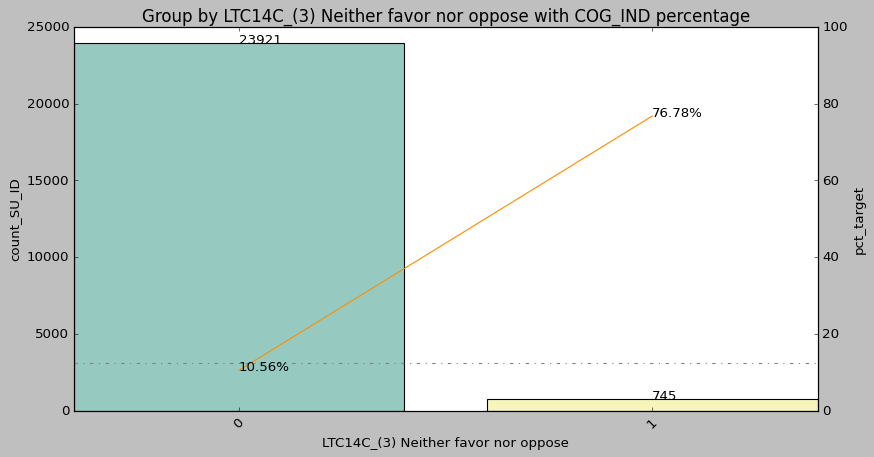

LTC14C_(4) Somewhat oppose
Cuts in how much Medicare pays to hospitals, doctors, and other services providers


,LTC14C_(4) Somewhat oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24190,2989,0.1236
1,1,476,109,0.2290


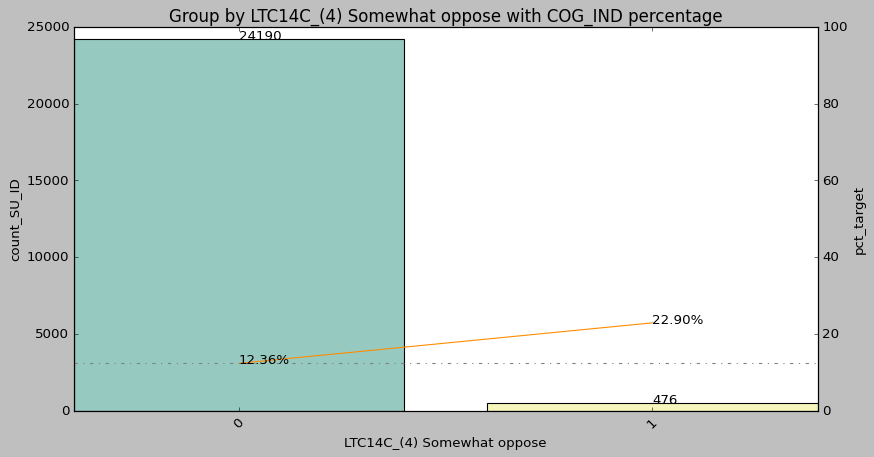

LTC14C_(5) Strongly oppose
Cuts in how much Medicare pays to hospitals, doctors, and other services providers


,LTC14C_(5) Strongly oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24395,3037,0.1245
1,1,271,61,0.2251


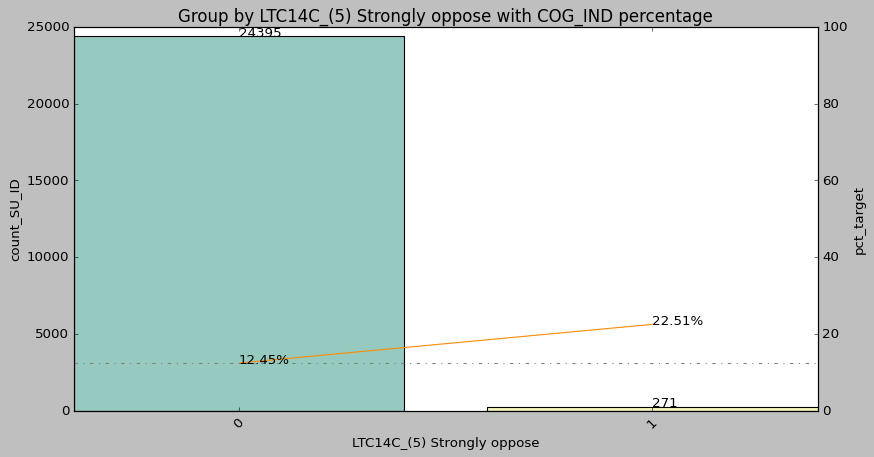

LTC14C_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Cuts in how much Medicare pays to hospitals, doctors, and other services providers


,LTC14C_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24637,3084,0.1252
1,1,29,14,0.4828


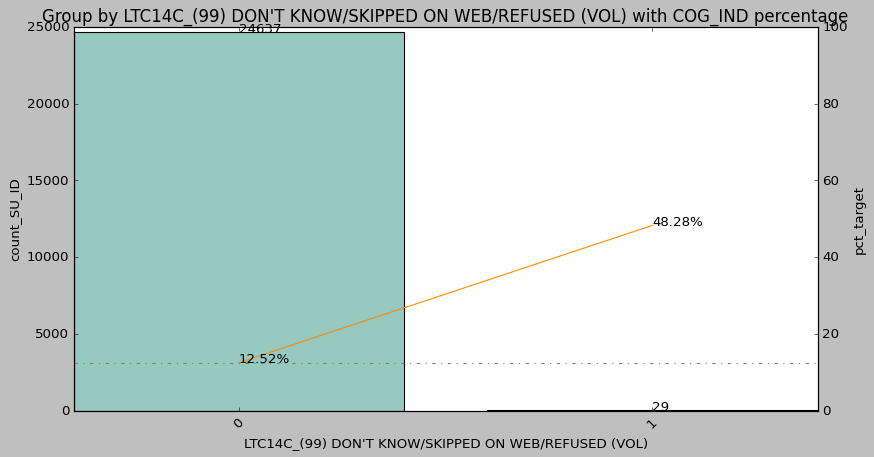

LTC14D_(3) Neither favor nor oppose
Cuts in how much Medicare pays to pharmaceutical companies for prescription drugs


,LTC14D_(3) Neither favor nor oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24059,2625,0.1091
1,1,607,473,0.7792


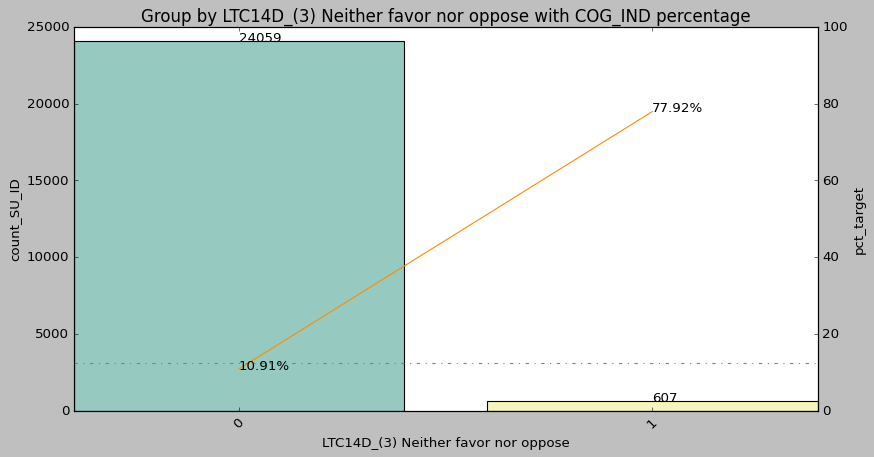

LTC14D_(4) Somewhat oppose
Cuts in how much Medicare pays to pharmaceutical companies for prescription drugs


,LTC14D_(4) Somewhat oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24419,3009,0.1232
1,1,247,89,0.3603


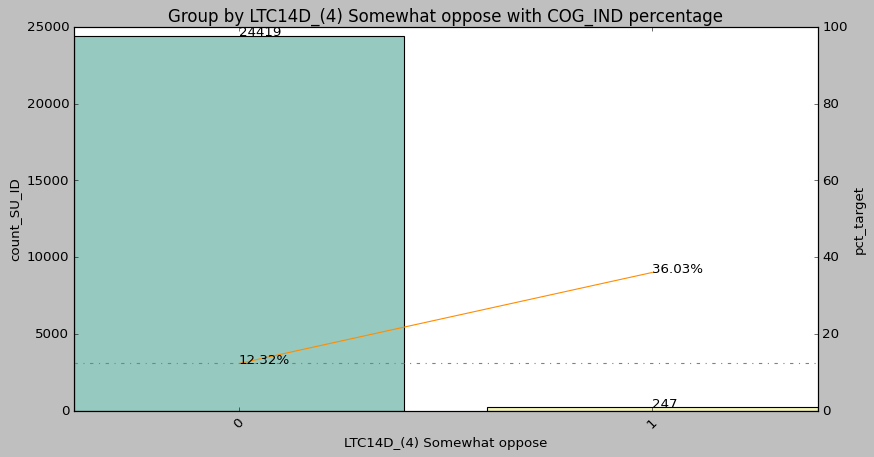

LTC14D_(5) Strongly oppose
Cuts in how much Medicare pays to pharmaceutical companies for prescription drugs


,LTC14D_(5) Strongly oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24461,3044,0.1244
1,1,205,54,0.2634


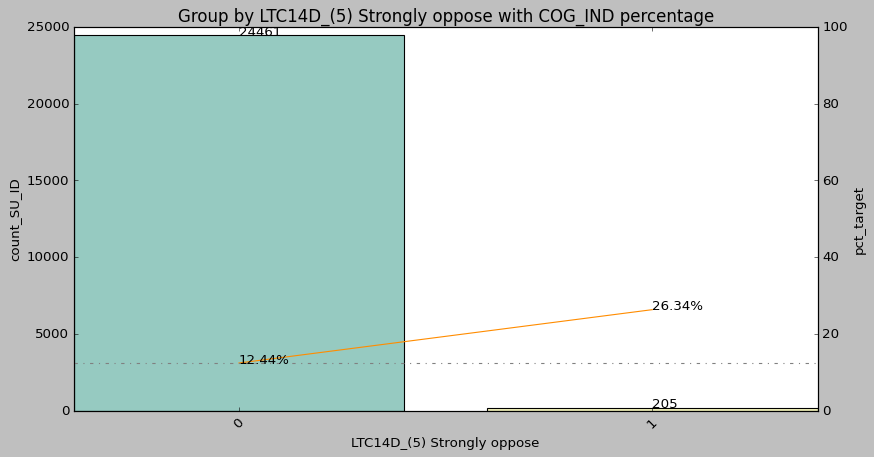

LTC14D_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Cuts in how much Medicare pays to pharmaceutical companies for prescription drugs


,LTC14D_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24644,3087,0.1253
1,1,22,11,0.5000


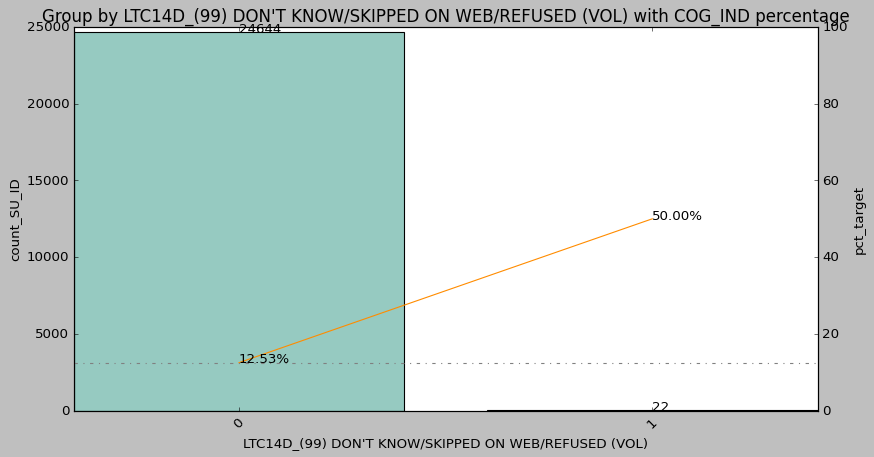

LTC14E_(3) Neither favor nor oppose
Cuts in how much Medicare pays to insurance companies


,LTC14E_(3) Neither favor nor oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,23929,2569,0.1074
1,1,737,529,0.7178


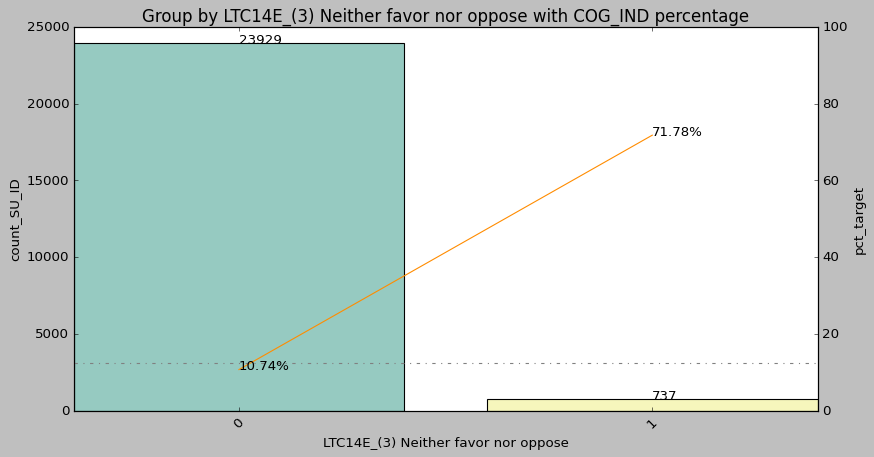

LTC14E_(4) Somewhat oppose
Cuts in how much Medicare pays to insurance companies


,LTC14E_(4) Somewhat oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24443,3015,0.1233
1,1,223,83,0.3722


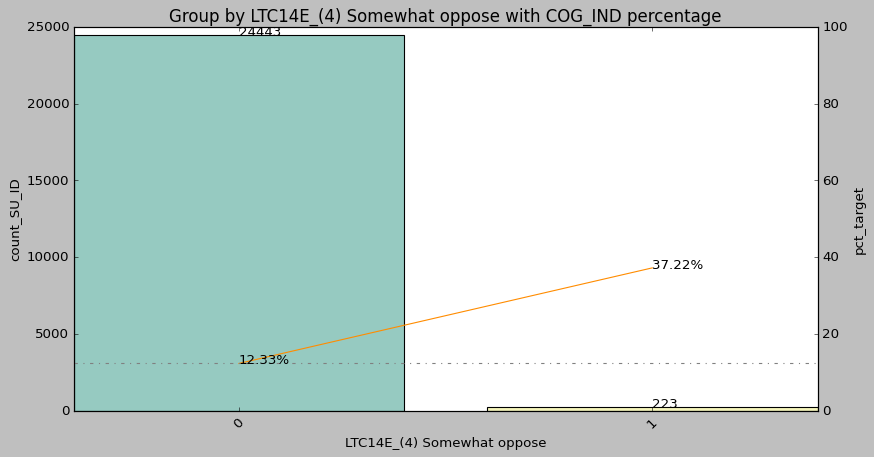

LTC14E_(5) Strongly oppose
Cuts in how much Medicare pays to insurance companies


,LTC14E_(5) Strongly oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24502,3054,0.1246
1,1,164,44,0.2683


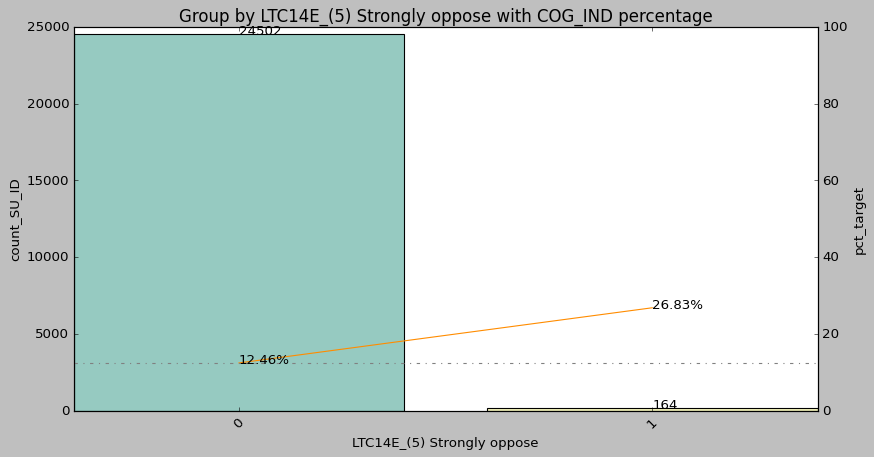

LTC14E_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
Cuts in how much Medicare pays to insurance companies


,LTC14E_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24638,3085,0.1252
1,1,28,13,0.4643


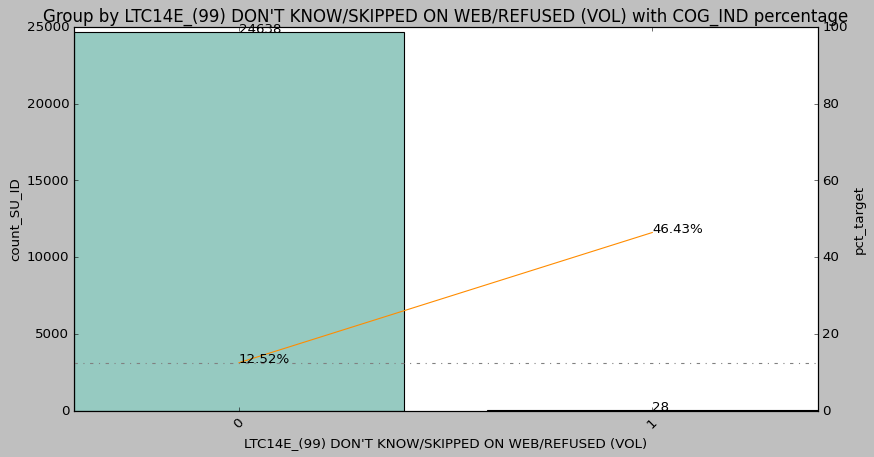

LTC14F_(3) Neither favor nor oppose
An increase in the Medicare payroll tax that is paid by both employees and employers


,LTC14F_(3) Neither favor nor oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,23917,2519,0.1053
1,1,749,579,0.7730


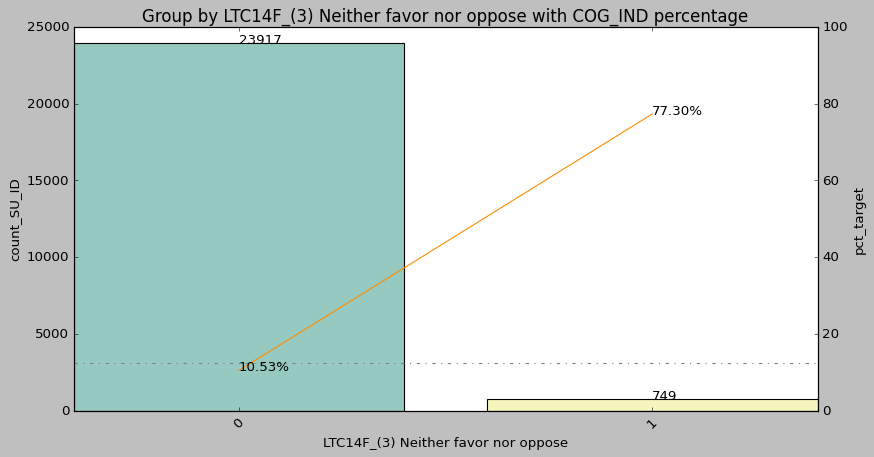

LTC14F_(4) Somewhat oppose
An increase in the Medicare payroll tax that is paid by both employees and employers


,LTC14F_(4) Somewhat oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24473,3011,0.1230
1,1,193,87,0.4508


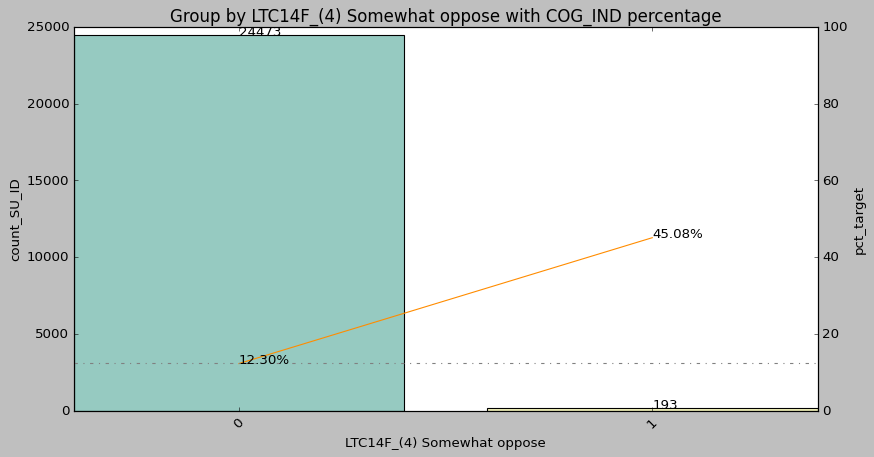

LTC14F_(5) Strongly oppose
An increase in the Medicare payroll tax that is paid by both employees and employers


,LTC14F_(5) Strongly oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24570,3058,0.1245
1,1,96,40,0.4167


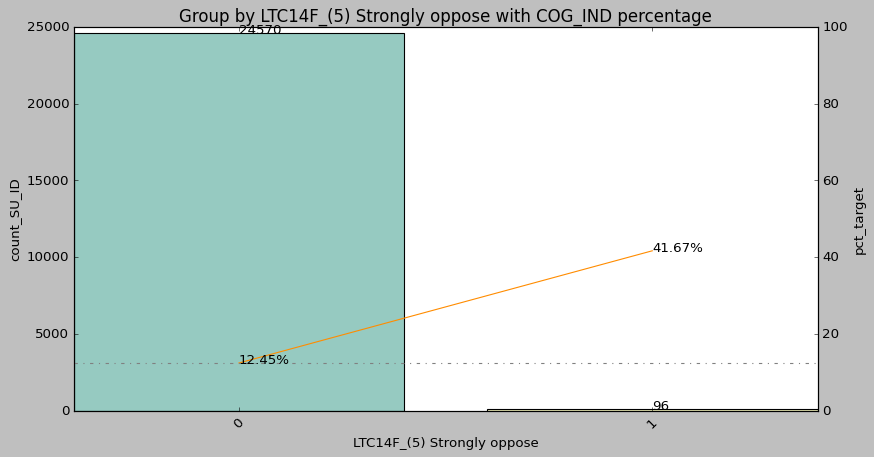

LTC14F_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
An increase in the Medicare payroll tax that is paid by both employees and employers


,LTC14F_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24639,3082,0.1251
1,1,27,16,0.5926


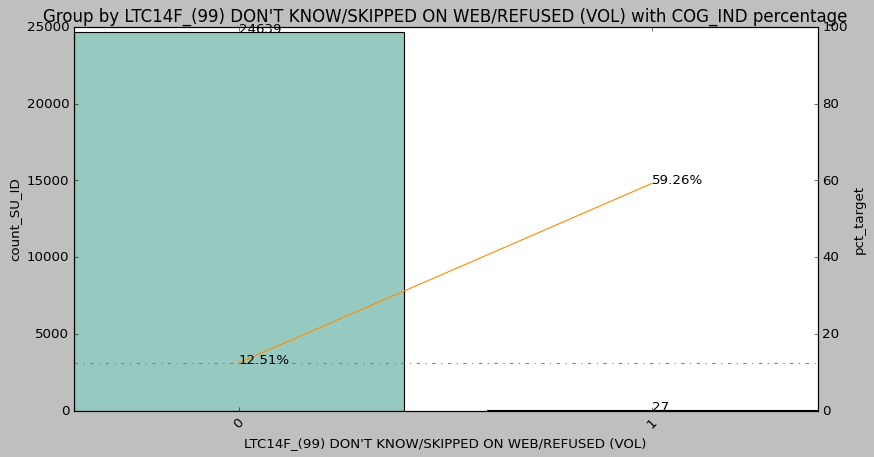

LTC14G_(3) Neither favor nor oppose
A tax increase for wealthy individuals making over $250,000 per year


,LTC14G_(3) Neither favor nor oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24336,2818,0.1158
1,1,330,280,0.8485


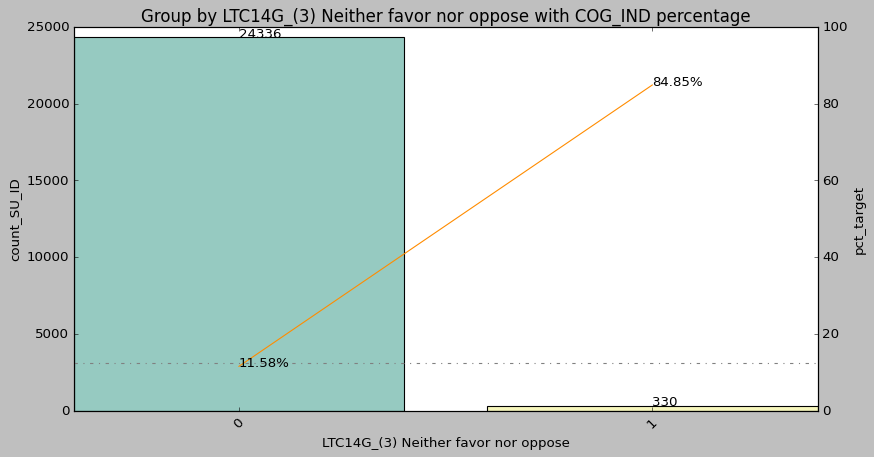

LTC14G_(4) Somewhat oppose
A tax increase for wealthy individuals making over $250,000 per year


,LTC14G_(4) Somewhat oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24588,3053,0.1242
1,1,78,45,0.5769


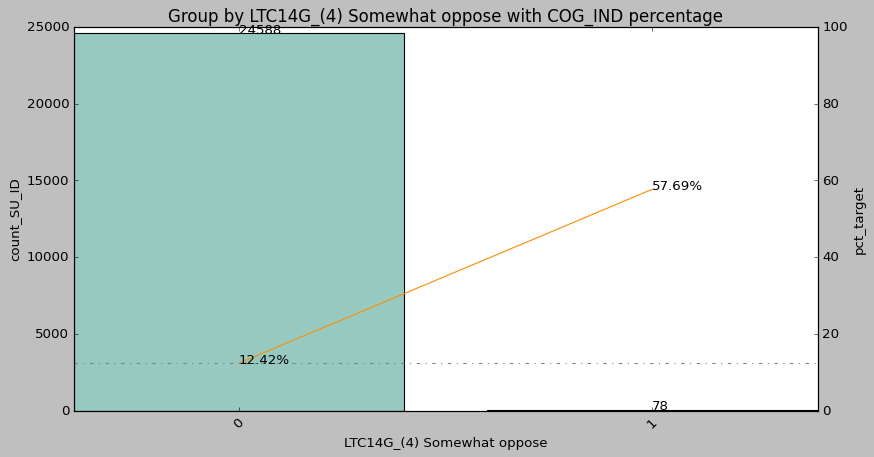

LTC14G_(5) Strongly oppose
A tax increase for wealthy individuals making over $250,000 per year


,LTC14G_(5) Strongly oppose,count_SU_ID,sum_COG_IND,pct_target
0,0,24572,3052,0.1242
1,1,94,46,0.4894


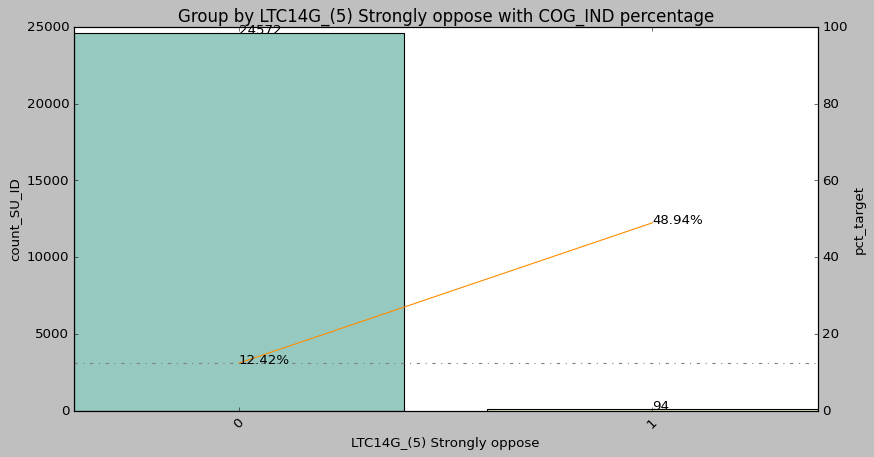

LTC14G_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
A tax increase for wealthy individuals making over $250,000 per year


,LTC14G_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24647,3086,0.1252
1,1,19,12,0.6316


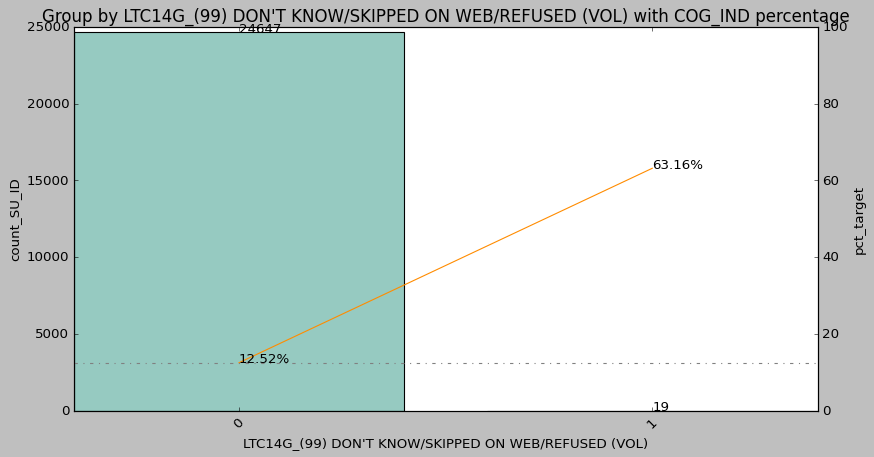

VIRUS2A_(3) Somewhat worried
The coronavirus


,VIRUS2A_(3) Somewhat worried,count_SU_ID,sum_COG_IND,pct_target
0,0,23466,2728,0.1163
1,1,1200,370,0.3083


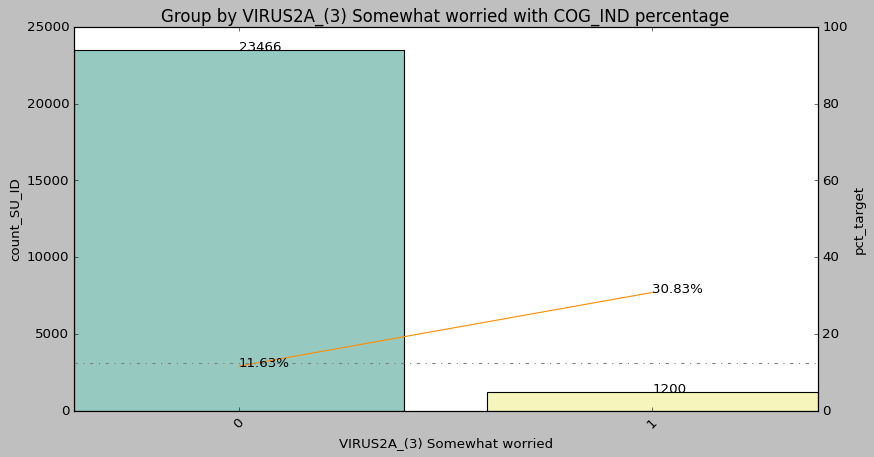

VIRUS2A_(4) Not too worried
The coronavirus


,VIRUS2A_(4) Not too worried,count_SU_ID,sum_COG_IND,pct_target
0,0,24129,2875,0.1192
1,1,537,223,0.4153


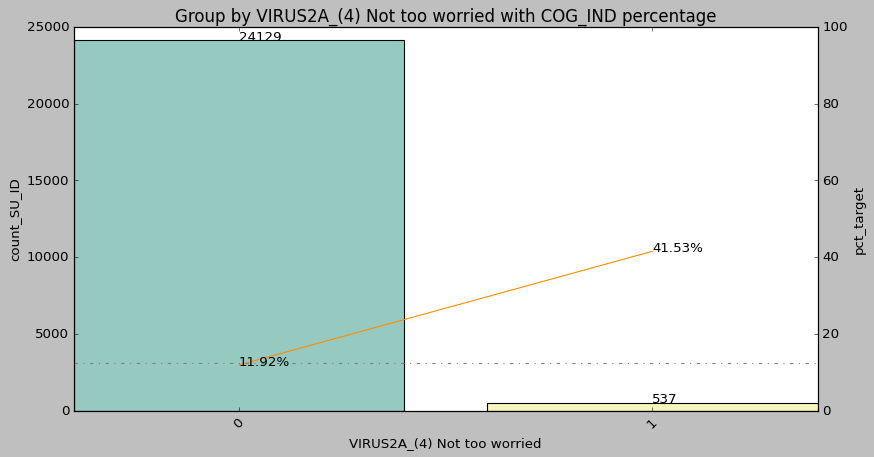

VIRUS2A_(5) Not at all worried
The coronavirus


,VIRUS2A_(5) Not at all worried,count_SU_ID,sum_COG_IND,pct_target
0,0,24562,3036,0.1236
1,1,104,62,0.5962


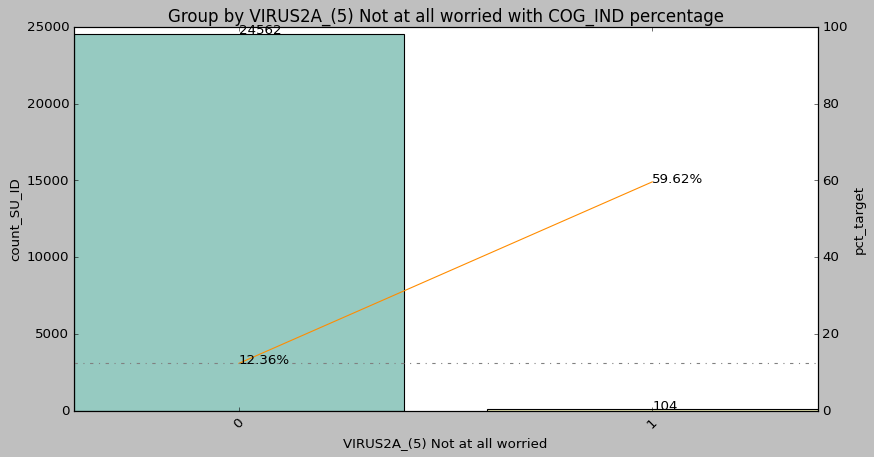

VIRUS2B_(3) Somewhat worried
The flu


,VIRUS2B_(3) Somewhat worried,count_SU_ID,sum_COG_IND,pct_target
0,0,24135,2902,0.1202
1,1,531,196,0.3691


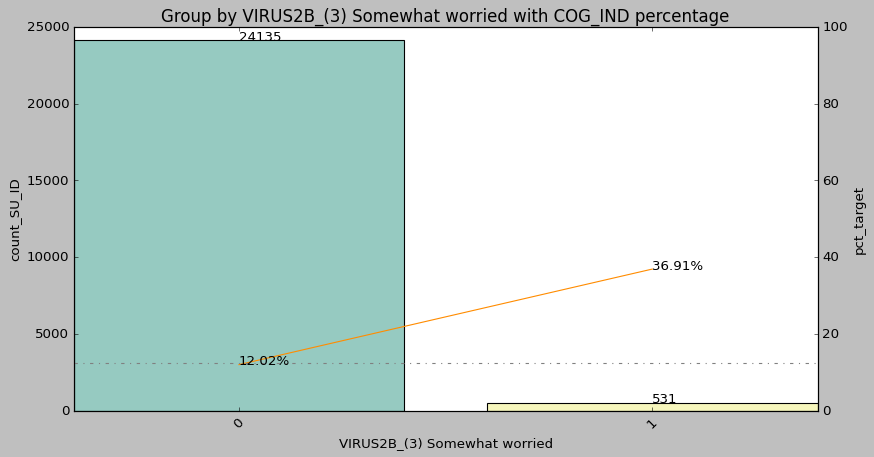

VIRUS2B_(4) Not too worried
The flu


,VIRUS2B_(4) Not too worried,count_SU_ID,sum_COG_IND,pct_target
0,0,22907,2651,0.1157
1,1,1759,447,0.2541


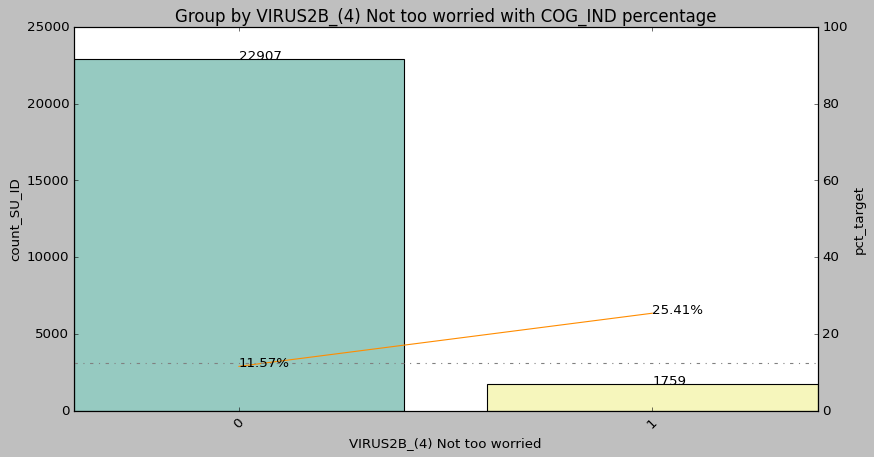

VIRUS2B_(5) Not at all worried
The flu


,VIRUS2B_(5) Not at all worried,count_SU_ID,sum_COG_IND,pct_target
0,0,24281,2948,0.1214
1,1,385,150,0.3896


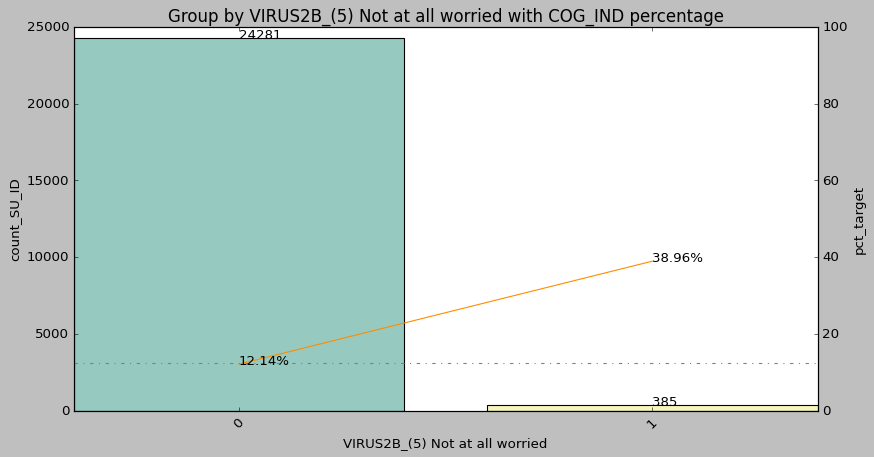

APVAX3_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
 Have you received a COVID-19 vaccine?


,APVAX3_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24665,3097,0.1256
1,1,1,1,1.0000


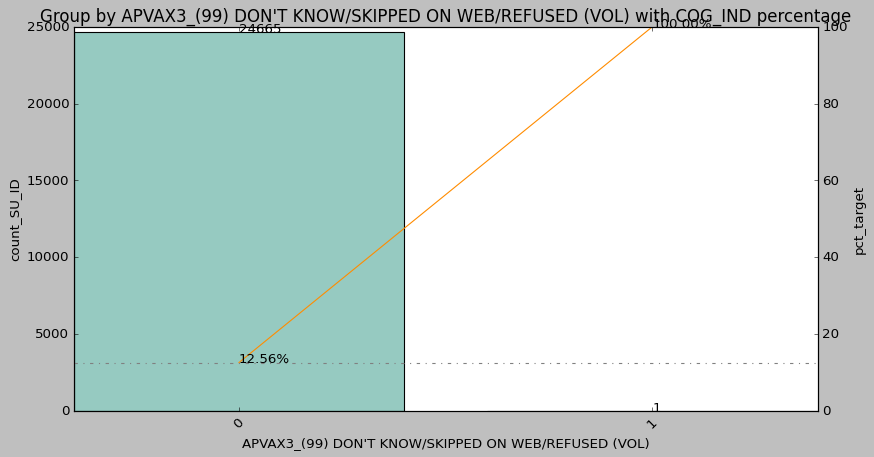

APVAX7_(3) Probably not get a vaccine
 Once a vaccine to prevent COVID-19 is available to you, would you...


,APVAX7_(3) Probably not get a vaccine,count_SU_ID,sum_COG_IND,pct_target
0,0,24459,2983,0.1220
1,1,207,115,0.5556


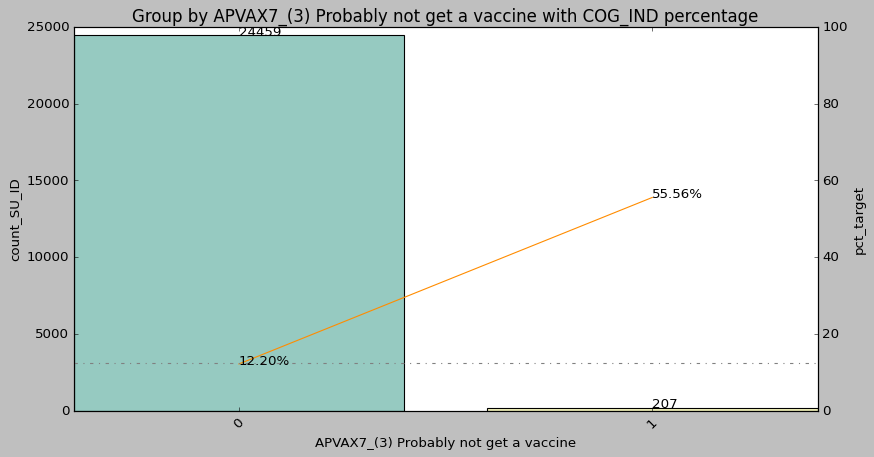

APVAX7_(4) Definitely not get a vaccine
 Once a vaccine to prevent COVID-19 is available to you, would you...


,APVAX7_(4) Definitely not get a vaccine,count_SU_ID,sum_COG_IND,pct_target
0,0,24521,2999,0.1223
1,1,145,99,0.6828


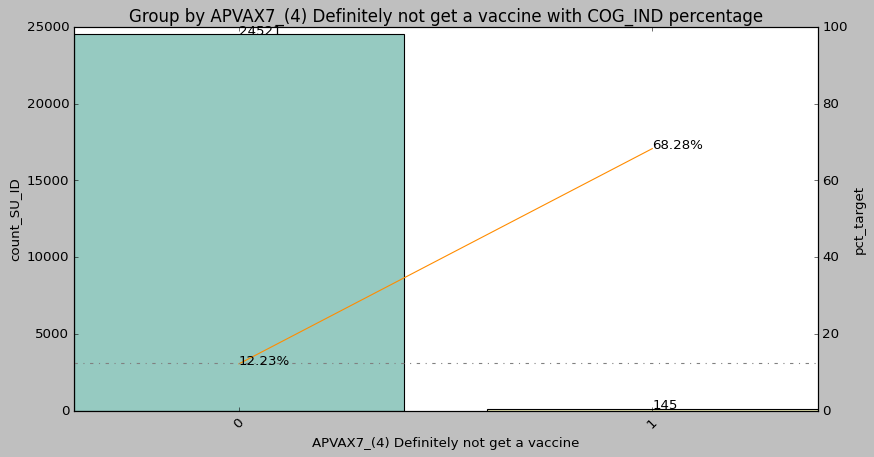

APVAX7_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)
 Once a vaccine to prevent COVID-19 is available to you, would you...


,APVAX7_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24665,3097,0.1256
1,1,1,1,1.0000


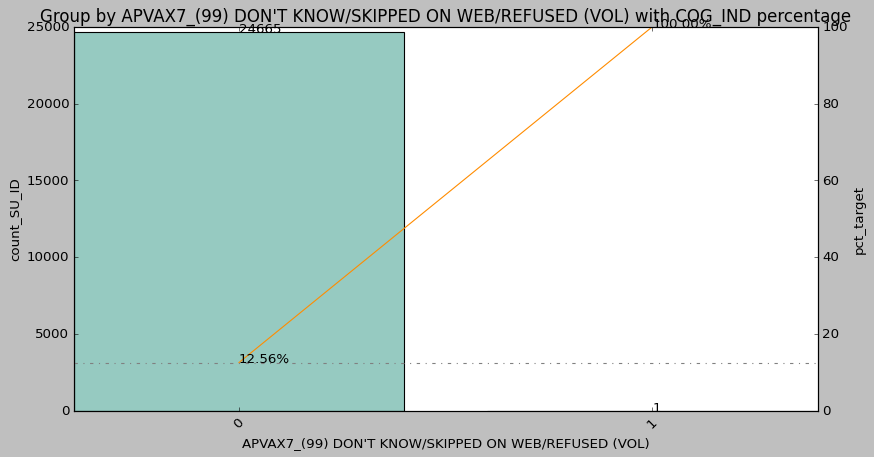

POLITICS_(3) Independent
 Do you consider yourself a Democrat, a Republican, an independent or none of these?


,POLITICS_(3) Independent,count_SU_ID,sum_COG_IND,pct_target
0,0,24440,2974,0.1217
1,1,226,124,0.5487


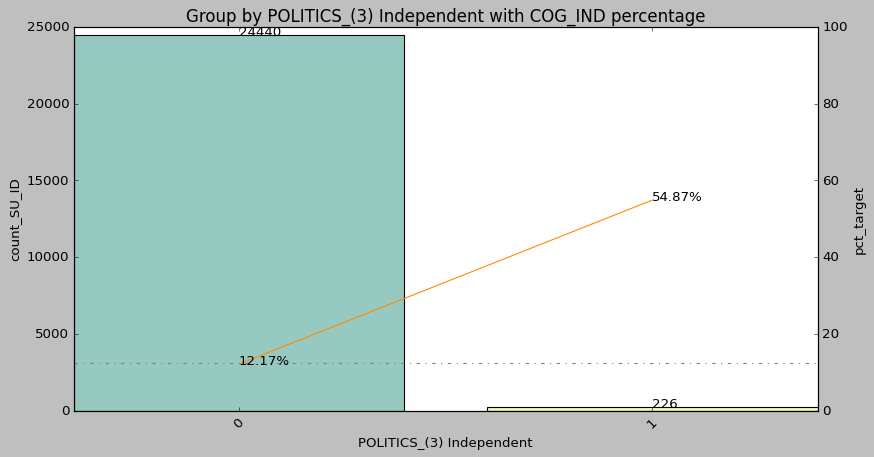

POLITICS_(4) None of these
 Do you consider yourself a Democrat, a Republican, an independent or none of these?


,POLITICS_(4) None of these,count_SU_ID,sum_COG_IND,pct_target
0,0,24665,3097,0.1256
1,1,1,1,1.0000


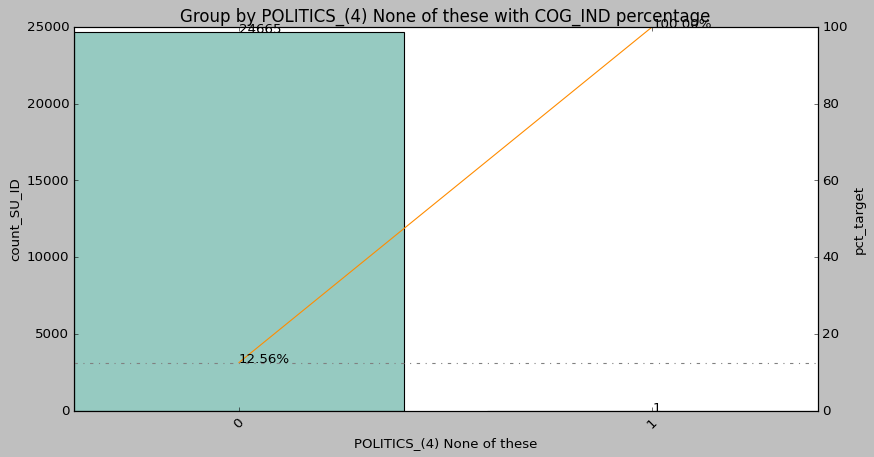

MARITAL_(3) Divorced
 Marital status


,MARITAL_(3) Divorced,count_SU_ID,sum_COG_IND,pct_target
0,0,24541,3073,0.1252
1,1,125,25,0.2000


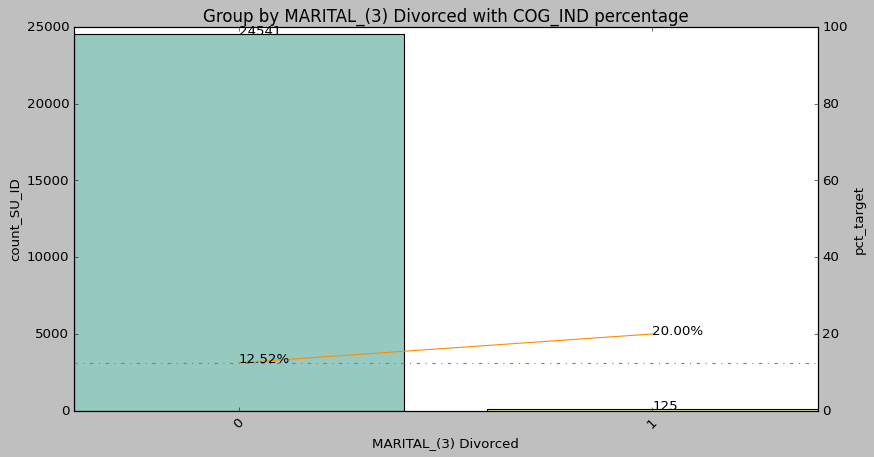

MARITAL_(4) Separated
 Marital status


,MARITAL_(4) Separated,count_SU_ID,sum_COG_IND,pct_target
0,0,24564,3084,0.1255
1,1,102,14,0.1373


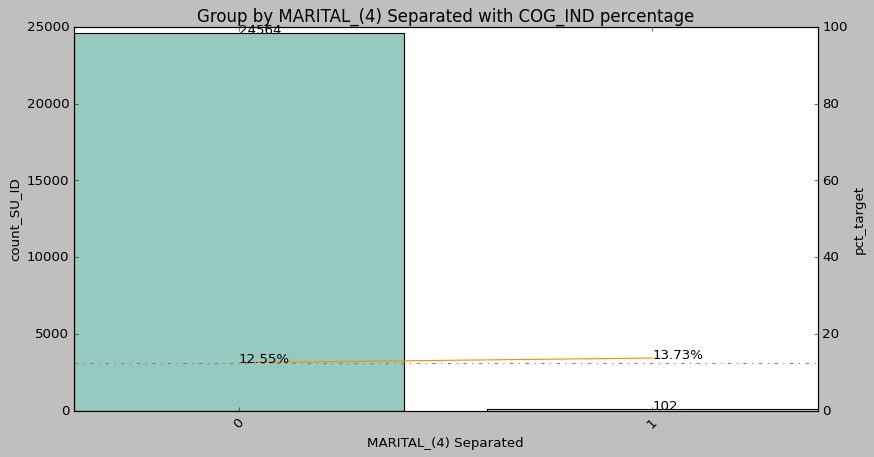

MARITAL_(5) Never married
 Marital status


,MARITAL_(5) Never married,count_SU_ID,sum_COG_IND,pct_target
0,0,24264,2800,0.1154
1,1,402,298,0.7413


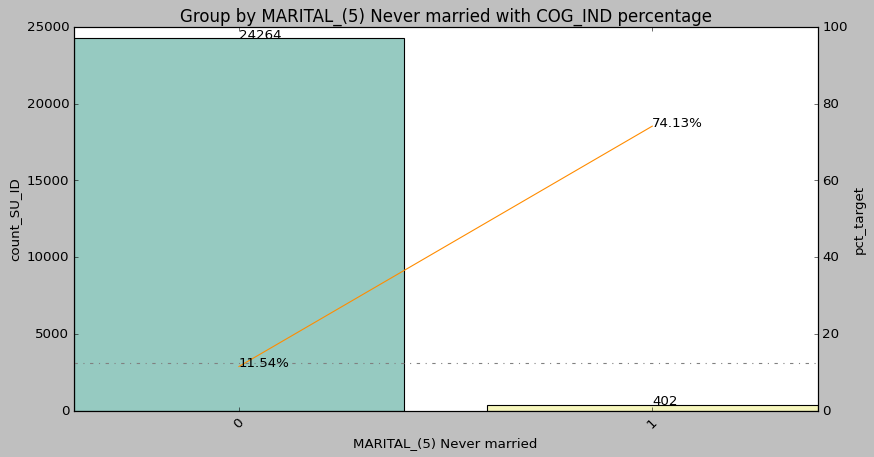

MARITAL_(6) Living with partner
 Marital status


,MARITAL_(6) Living with partner,count_SU_ID,sum_COG_IND,pct_target
0,0,24579,3042,0.1238
1,1,87,56,0.6437


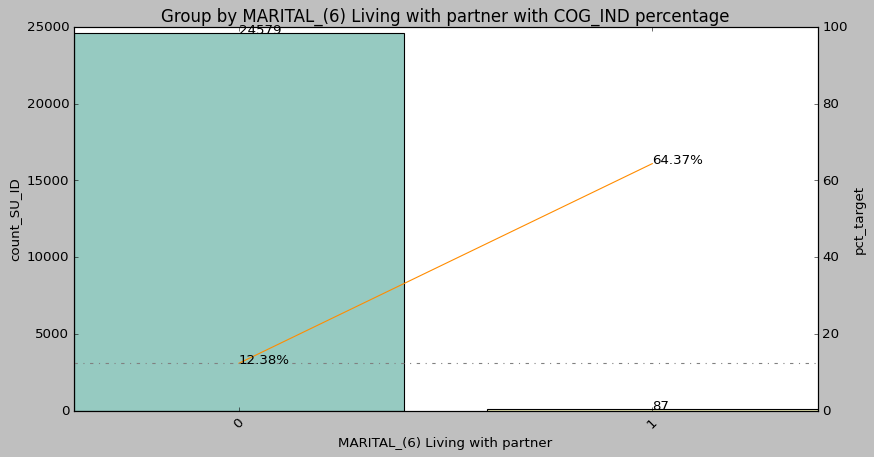

AGEGRP_(3) 40 to 59
 Age


,AGEGRP_(3) 40 to 59,count_SU_ID,sum_COG_IND,pct_target
0,0,23924,3000,0.1254
1,1,742,98,0.1321


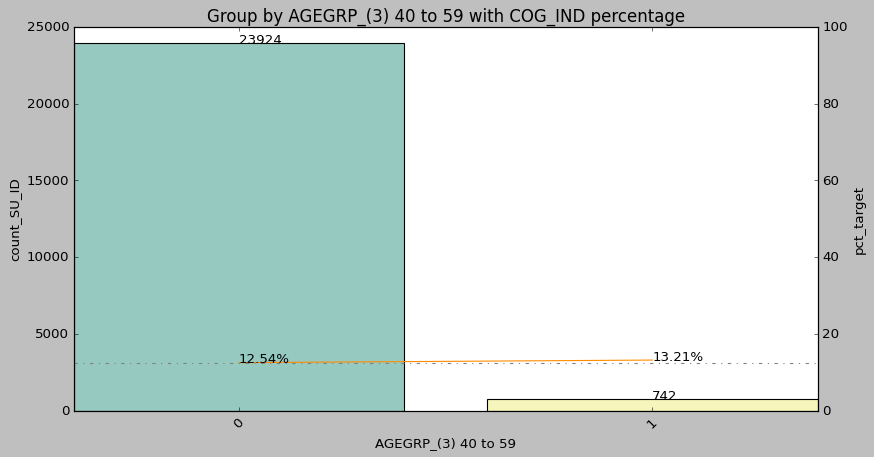

AGEGRP_(4) 60 to 64
 Age


,AGEGRP_(4) 60 to 64,count_SU_ID,sum_COG_IND,pct_target
0,0,24506,3072,0.1254
1,1,160,26,0.1625


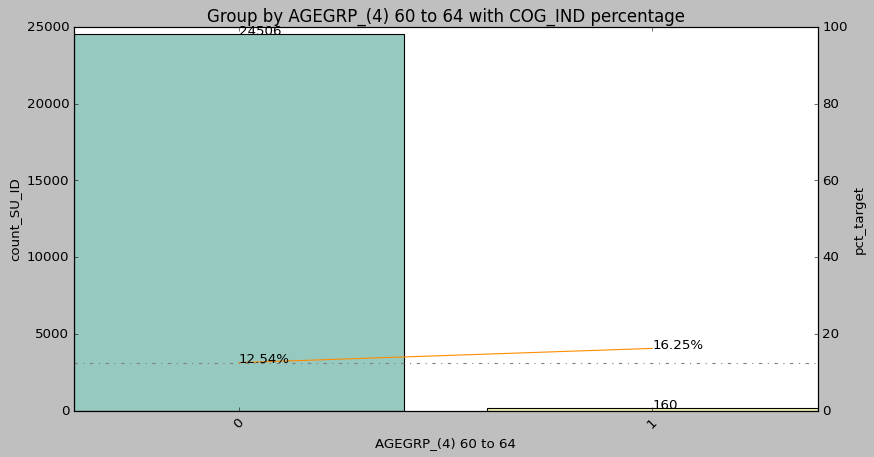

AGEGRP_(5) 65 or older
 Age


,AGEGRP_(5) 65 or older,count_SU_ID,sum_COG_IND,pct_target
0,0,23827,3053,0.1281
1,1,839,45,0.0536


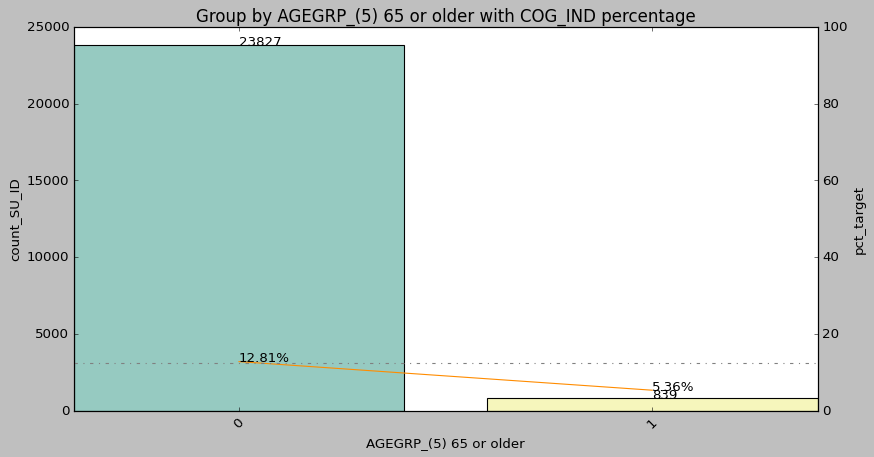

EDUCATION_(3) Some college
 Educational attainment


,EDUCATION_(3) Some college,count_SU_ID,sum_COG_IND,pct_target
0,0,22995,2642,0.1149
1,1,1671,456,0.2729


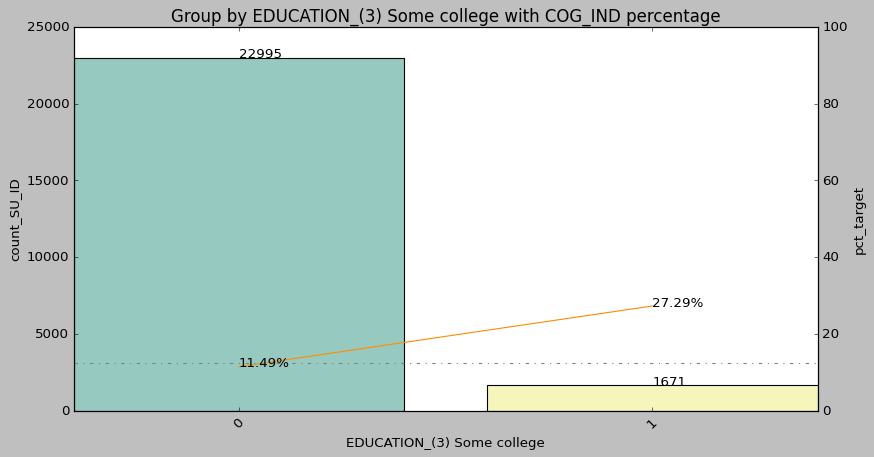

EDUCATION_(4) Bachelor's degree or higher
 Educational attainment


,EDUCATION_(4) Bachelor's degree or higher,count_SU_ID,sum_COG_IND,pct_target
0,0,23765,2773,0.1167
1,1,901,325,0.3607


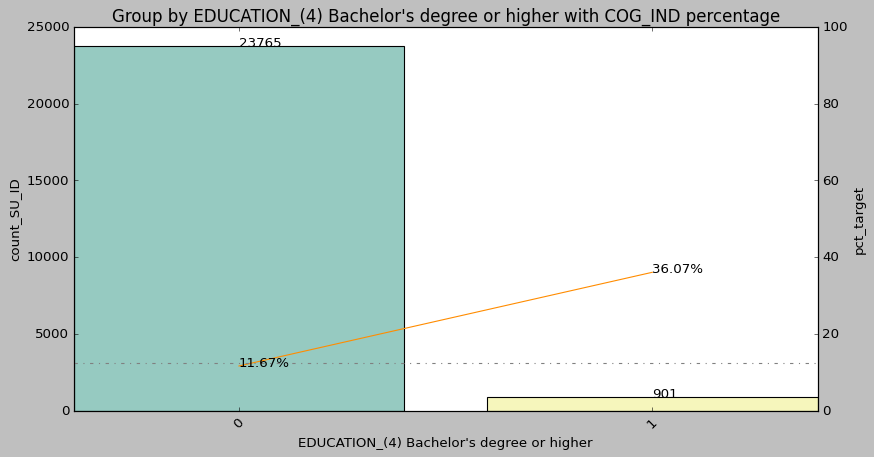

RACETH_(3) Hispanic
 Race/ethnicity


,RACETH_(3) Hispanic,count_SU_ID,sum_COG_IND,pct_target
0,0,24185,2911,0.1204
1,1,481,187,0.3888


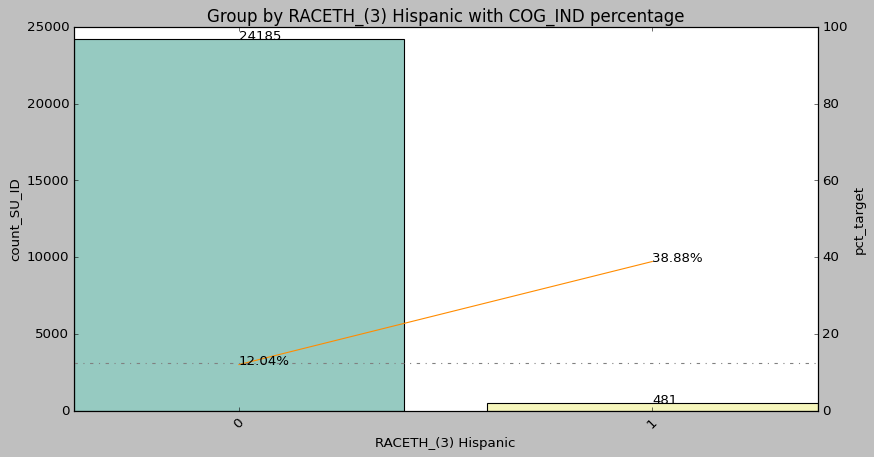

RACETH_(4) Other
 Race/ethnicity


,RACETH_(4) Other,count_SU_ID,sum_COG_IND,pct_target
0,0,24563,3036,0.1236
1,1,103,62,0.6019


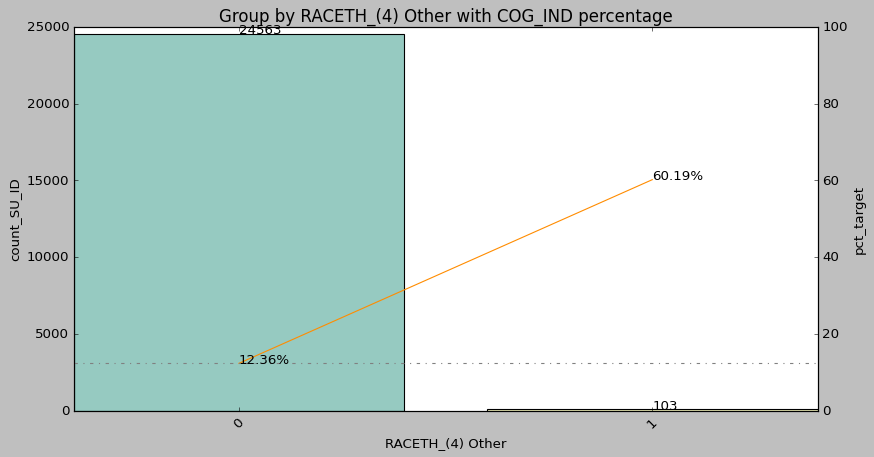

HHINCOME_(3) $20,000 to under $30,000
 Household income


,"HHINCOME_(3) $20,000 to under $30,000",count_SU_ID,sum_COG_IND,pct_target
0,0,24513,3014,0.123
1,1,153,84,0.549


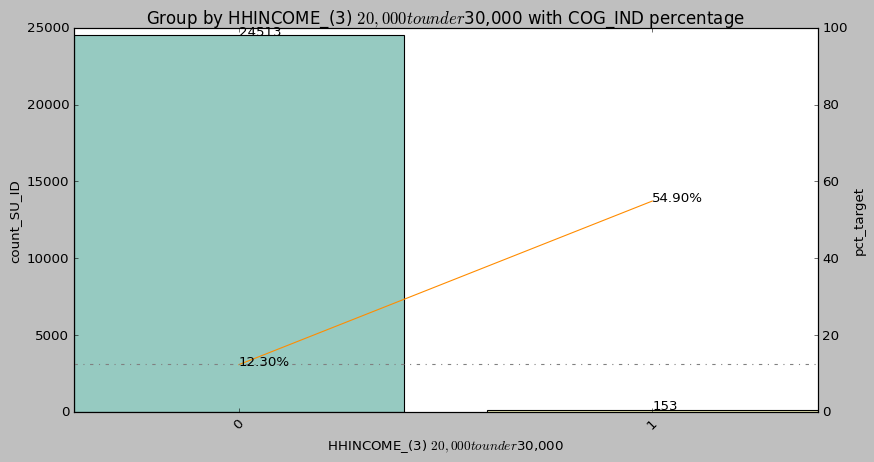

HHINCOME_(4) $30,000 to under $40,000
 Household income


,"HHINCOME_(4) $30,000 to under $40,000",count_SU_ID,sum_COG_IND,pct_target
0,0,24523,3033,0.1237
1,1,143,65,0.4545


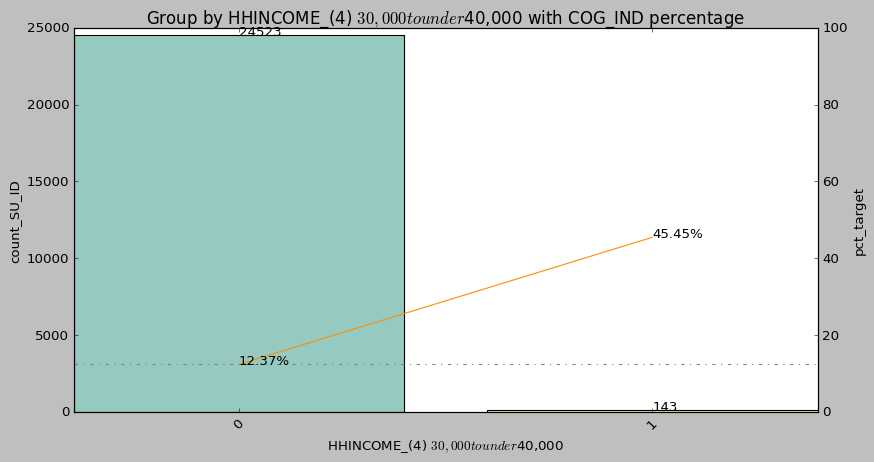

HHINCOME_(5) $40,000 to under $50,000
 Household income


,"HHINCOME_(5) $40,000 to under $50,000",count_SU_ID,sum_COG_IND,pct_target
0,0,24557,3052,0.1243
1,1,109,46,0.4220


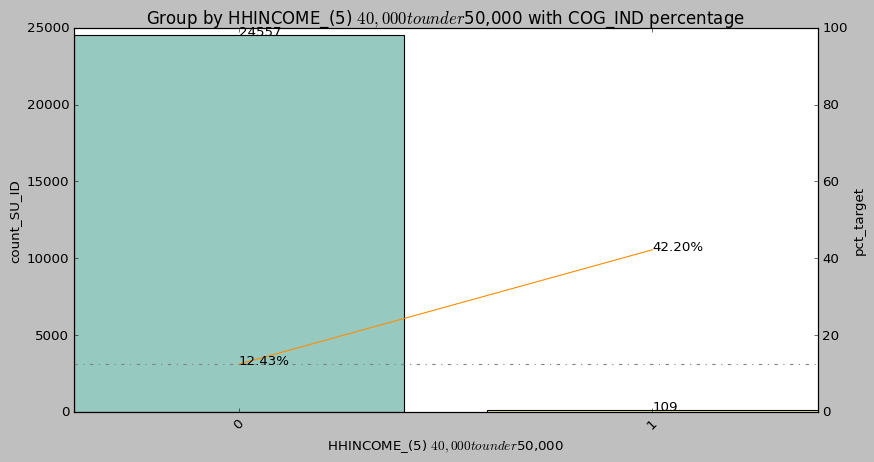

HHINCOME_(6) $50,000 to under $75,000
 Household income


,"HHINCOME_(6) $50,000 to under $75,000",count_SU_ID,sum_COG_IND,pct_target
0,0,24336,2938,0.1207
1,1,330,160,0.4848


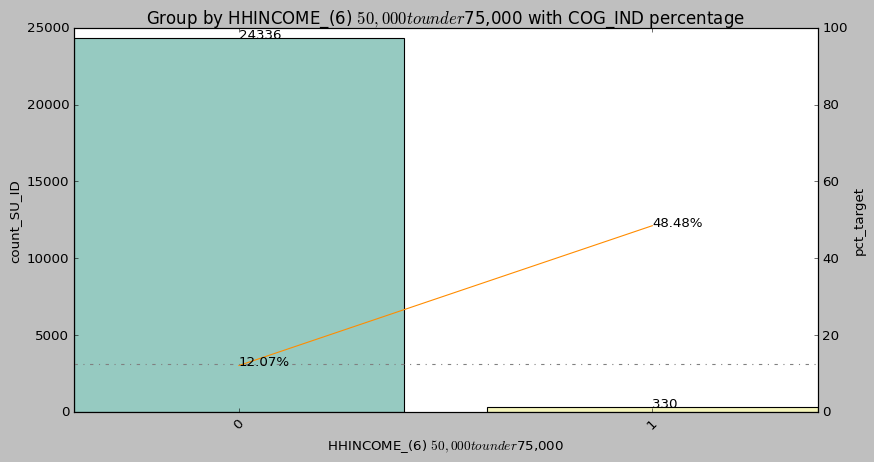

HHINCOME_(7) $75,000 to under $100,000
 Household income


,"HHINCOME_(7) $75,000 to under $100,000",count_SU_ID,sum_COG_IND,pct_target
0,0,24418,2987,0.1223
1,1,248,111,0.4476


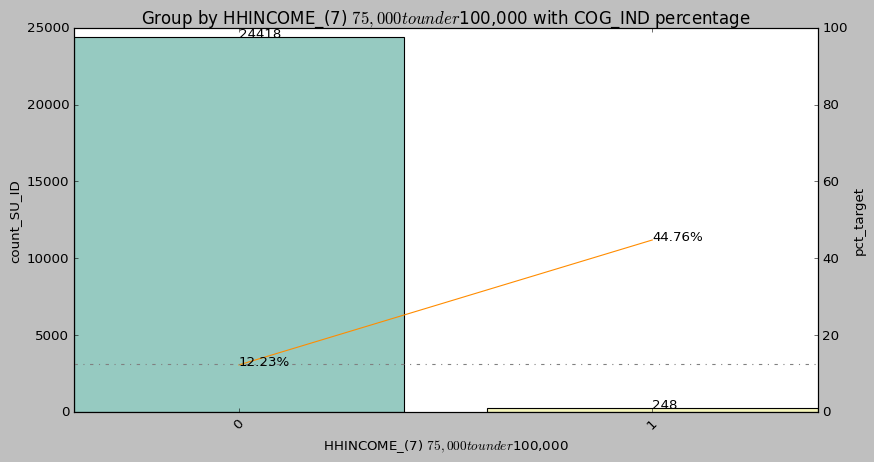

HHINCOME_(8) $100,000 to under $150,000
 Household income


,"HHINCOME_(8) $100,000 to under $150,000",count_SU_ID,sum_COG_IND,pct_target
0,0,24467,3027,0.1237
1,1,199,71,0.3568


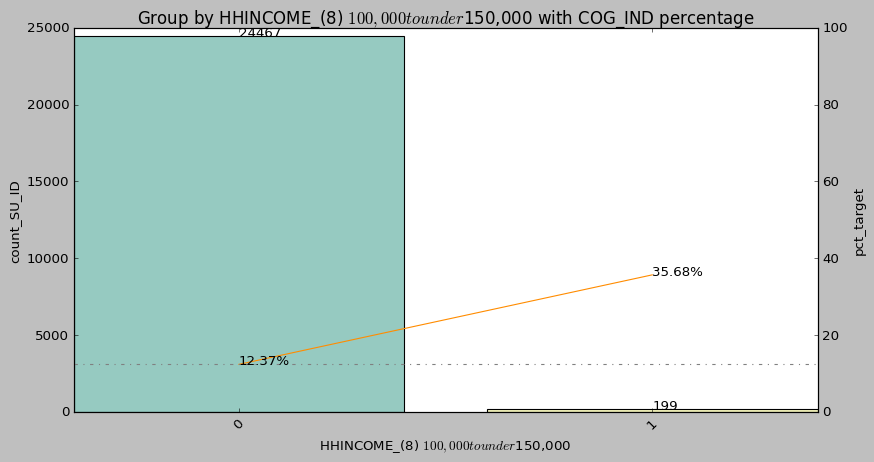

HHINCOME_(9) $150,000 or more
 Household income


,"HHINCOME_(9) $150,000 or more",count_SU_ID,sum_COG_IND,pct_target
0,0,24572,3058,0.1245
1,1,94,40,0.4255


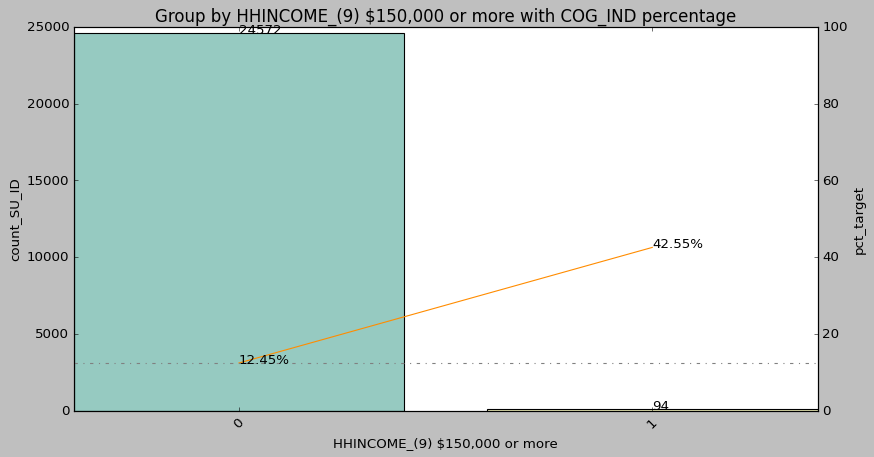

EMPSTATUS_(99) DON'T KNOW/SKIPPED/REFUSED (VOL)
 Employment status


,EMPSTATUS_(99) DON'T KNOW/SKIPPED/REFUSED (VOL),count_SU_ID,sum_COG_IND,pct_target
0,0,24662,3095,0.1255
1,1,4,3,0.7500


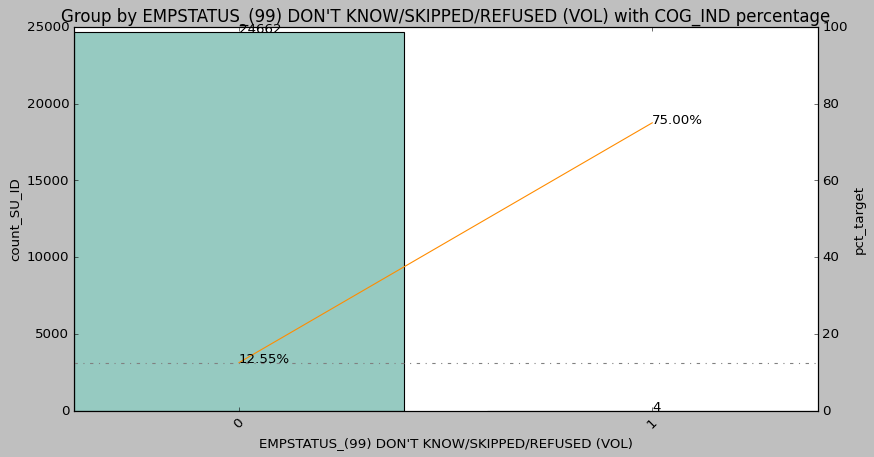

STATE_AR. Arkansas
 State of residence


,STATE_AR. Arkansas,count_SU_ID,sum_COG_IND,pct_target
0,0,24660,3097,0.1256
1,1,6,1,0.1667


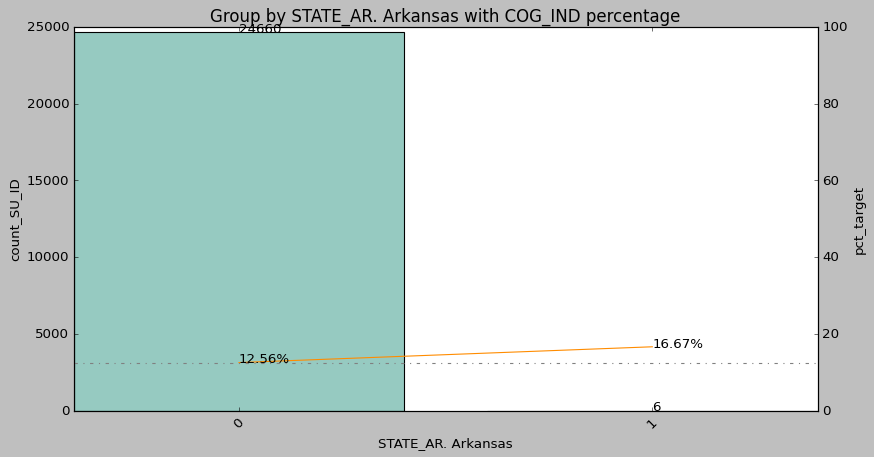

STATE_AZ. Arizona
 State of residence


,STATE_AZ. Arizona,count_SU_ID,sum_COG_IND,pct_target
0,0,24631,3085,0.1252
1,1,35,13,0.3714


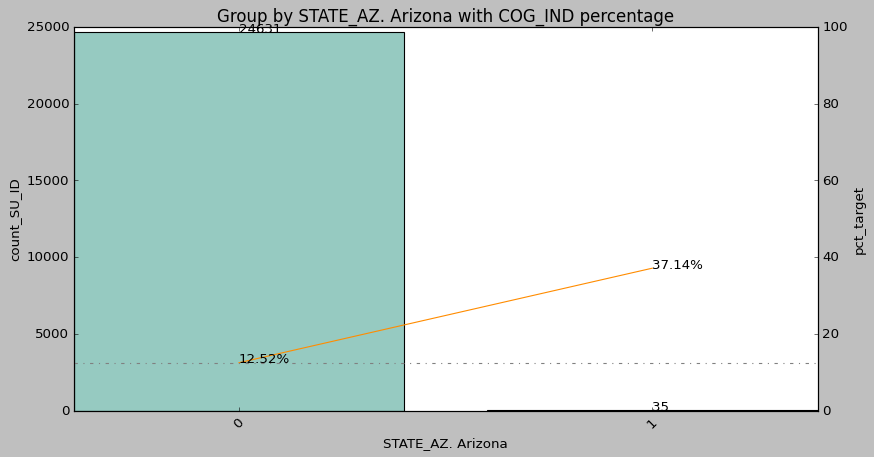

STATE_CA. California
 State of residence


,STATE_CA. California,count_SU_ID,sum_COG_IND,pct_target
0,0,24470,3011,0.1230
1,1,196,87,0.4439


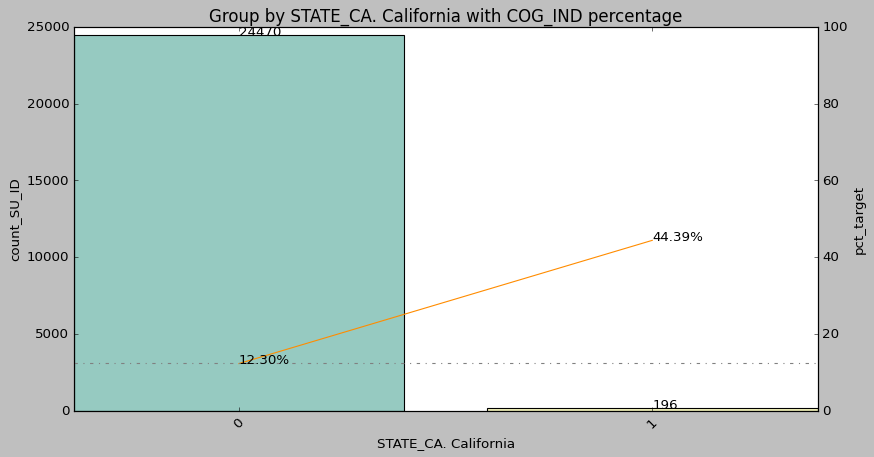

STATE_CO. Colorado
 State of residence


,STATE_CO. Colorado,count_SU_ID,sum_COG_IND,pct_target
0,0,24643,3087,0.1253
1,1,23,11,0.4783


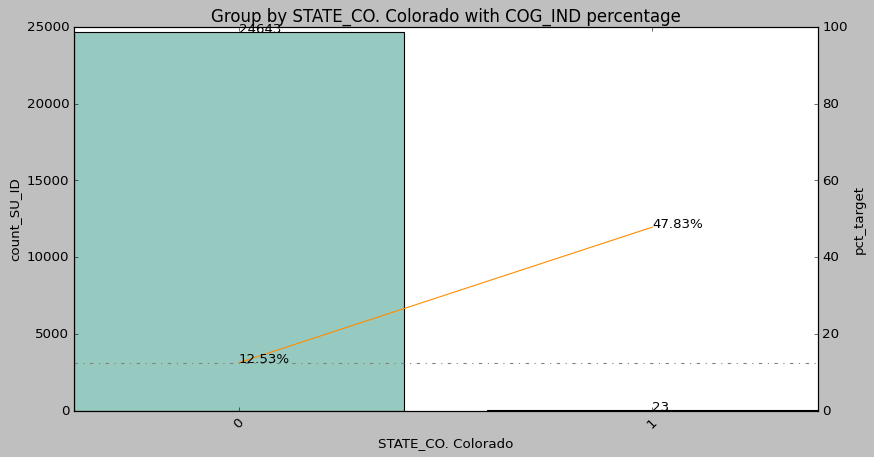

STATE_CT. Connecticut
 State of residence


,STATE_CT. Connecticut,count_SU_ID,sum_COG_IND,pct_target
0,0,24657,3092,0.1254
1,1,9,6,0.6667


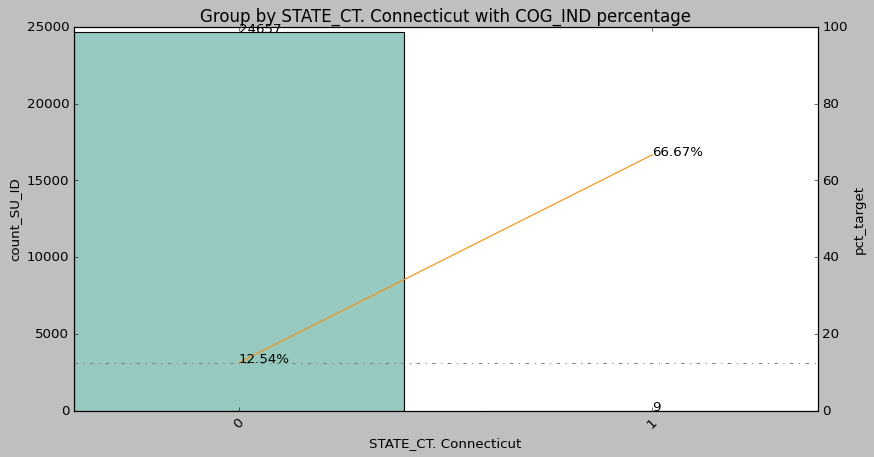

STATE_DC. District of Columbia
 State of residence


,STATE_DC. District of Columbia,count_SU_ID,sum_COG_IND,pct_target
0,0,24665,3097,0.1256
1,1,1,1,1.0000


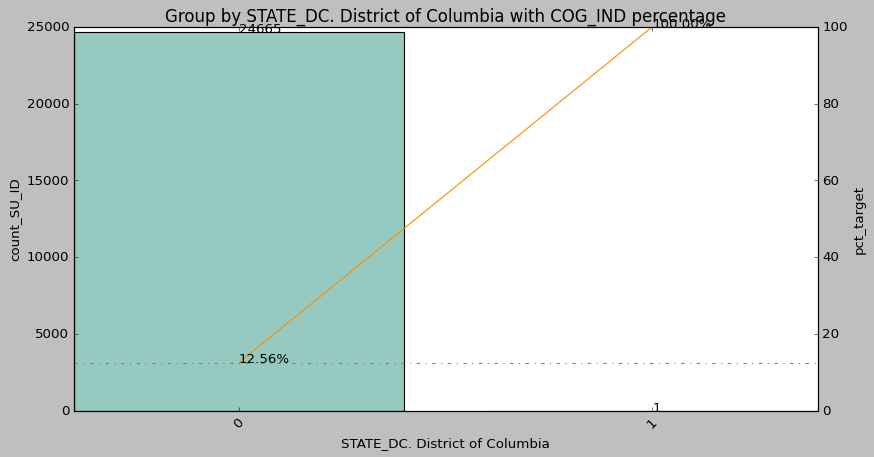

STATE_DE. Delaware
 State of residence


,STATE_DE. Delaware,count_SU_ID,sum_COG_IND,pct_target
0,0,24662,3097,0.1256
1,1,4,1,0.2500


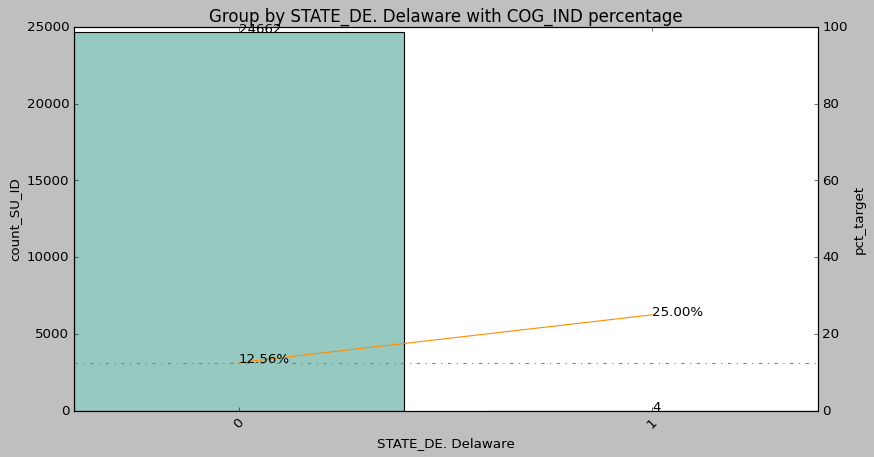

STATE_FL. Florida
 State of residence


,STATE_FL. Florida,count_SU_ID,sum_COG_IND,pct_target
0,0,24593,3067,0.1247
1,1,73,31,0.4247


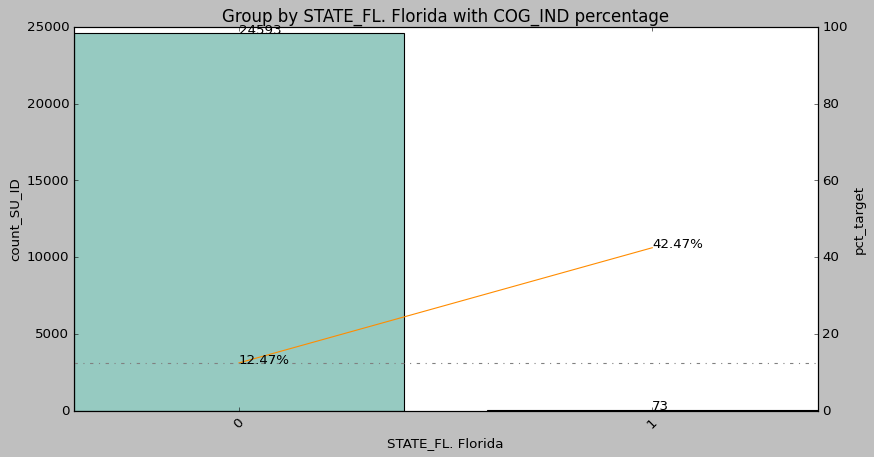

STATE_GA. Georgia
 State of residence


,STATE_GA. Georgia,count_SU_ID,sum_COG_IND,pct_target
0,0,24640,3086,0.1252
1,1,26,12,0.4615


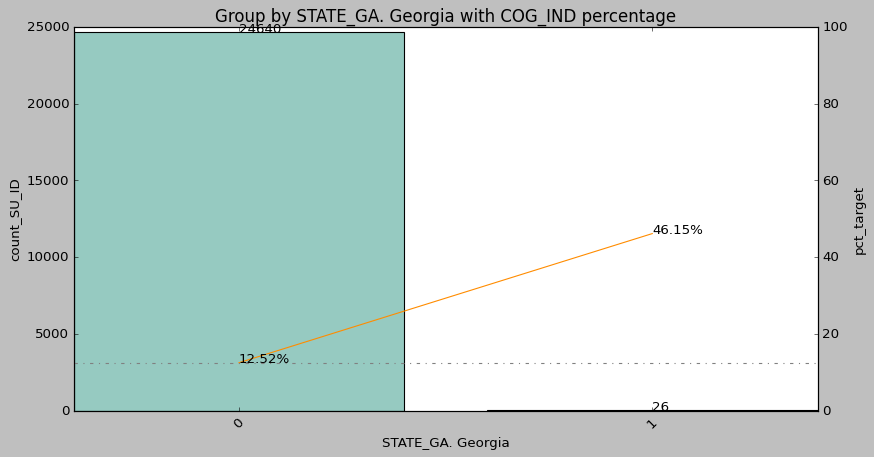

STATE_HI. Hawaii
 State of residence


,STATE_HI. Hawaii,count_SU_ID,sum_COG_IND,pct_target
0,0,24662,3096,0.1255
1,1,4,2,0.5000


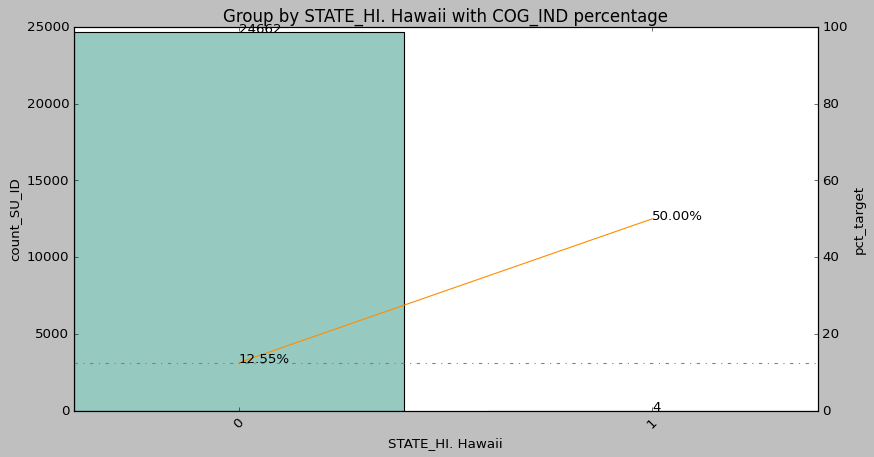

STATE_IA. Iowa
 State of residence


,STATE_IA. Iowa,count_SU_ID,sum_COG_IND,pct_target
0,0,24652,3091,0.1254
1,1,14,7,0.5000


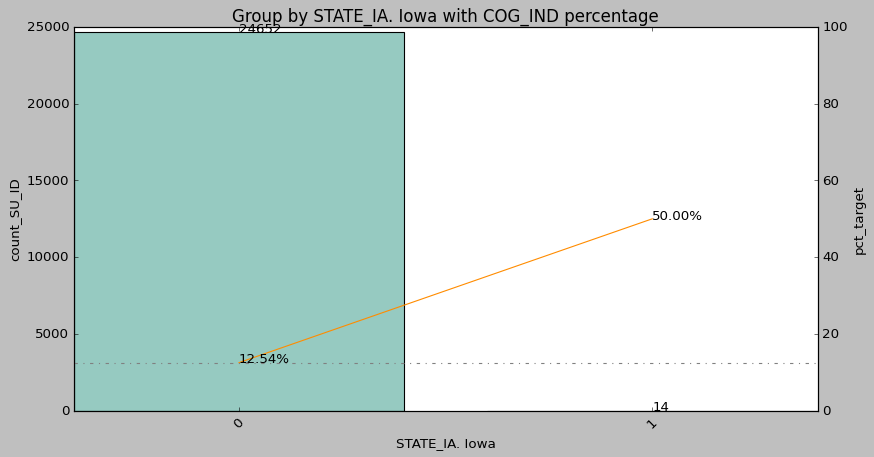

STATE_ID. Idaho
 State of residence


,STATE_ID. Idaho,count_SU_ID,sum_COG_IND,pct_target
0,0,24658,3092,0.1254
1,1,8,6,0.7500


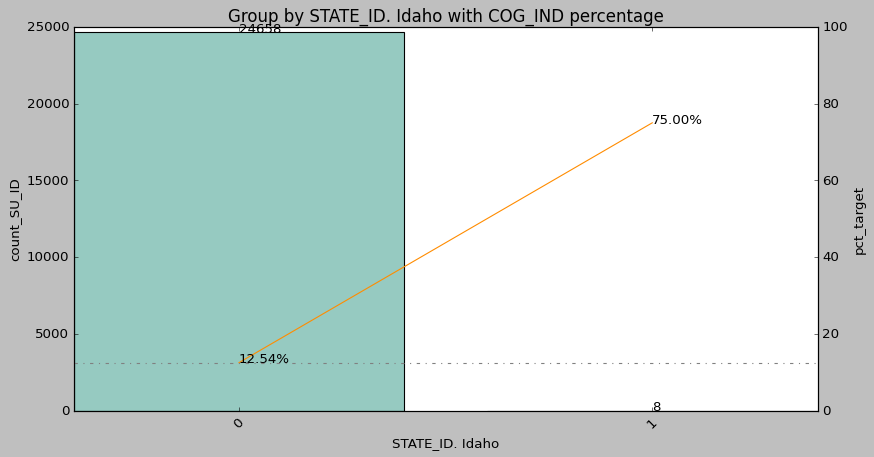

STATE_IL. Illinois
 State of residence


,STATE_IL. Illinois,count_SU_ID,sum_COG_IND,pct_target
0,0,24622,3083,0.1252
1,1,44,15,0.3409


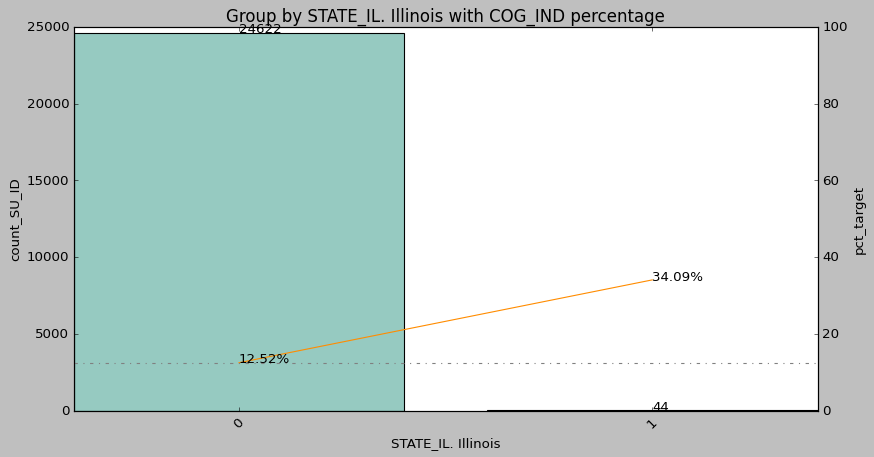

STATE_IN. Indiana
 State of residence


,STATE_IN. Indiana,count_SU_ID,sum_COG_IND,pct_target
0,0,24621,3084,0.1253
1,1,45,14,0.3111


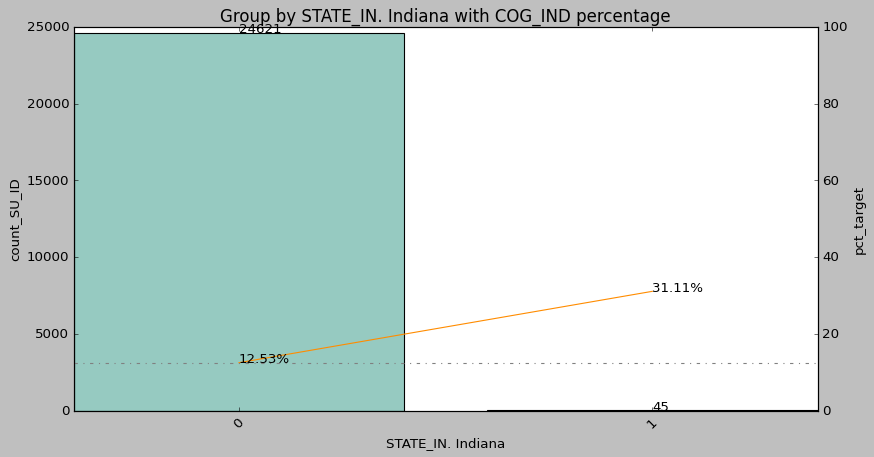

STATE_KS. Kansas
 State of residence


,STATE_KS. Kansas,count_SU_ID,sum_COG_IND,pct_target
0,0,24654,3091,0.1254
1,1,12,7,0.5833


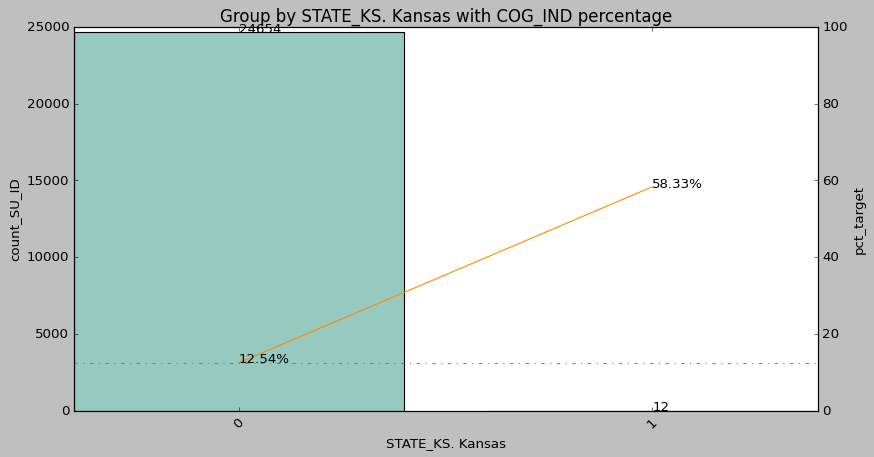

STATE_KY. Kentucky
 State of residence


,STATE_KY. Kentucky,count_SU_ID,sum_COG_IND,pct_target
0,0,24648,3092,0.1254
1,1,18,6,0.3333


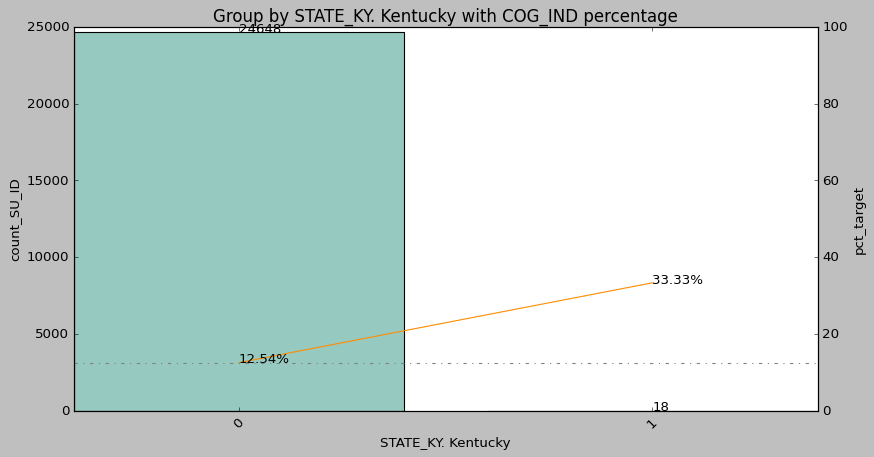

STATE_LA. Louisiana
 State of residence


,STATE_LA. Louisiana,count_SU_ID,sum_COG_IND,pct_target
0,0,24655,3093,0.1255
1,1,11,5,0.4545


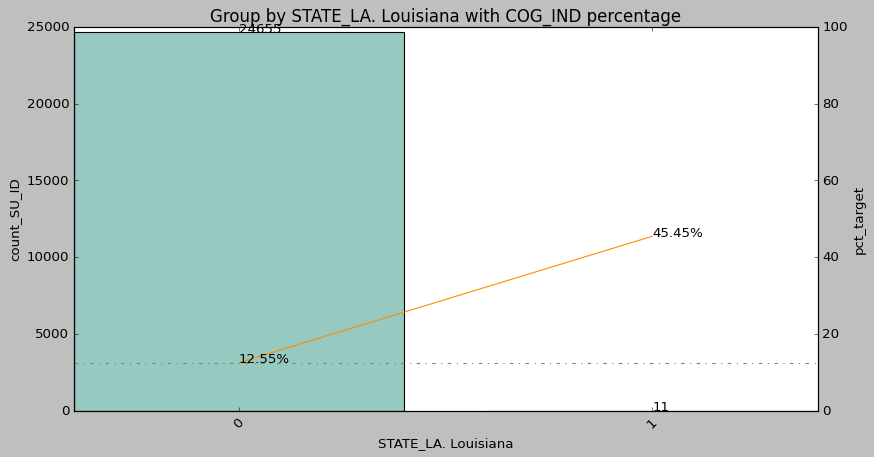

STATE_MA. Massachusetts
 State of residence


,STATE_MA. Massachusetts,count_SU_ID,sum_COG_IND,pct_target
0,0,24645,3091,0.1254
1,1,21,7,0.3333


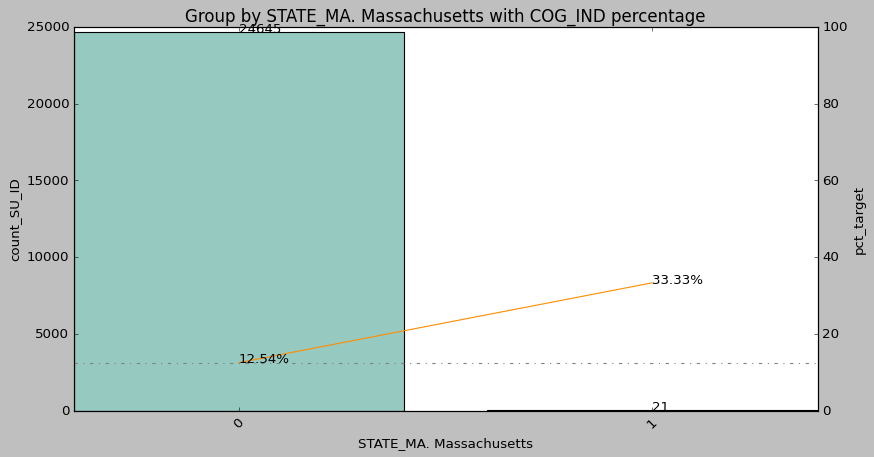

STATE_MD. Maryland
 State of residence


,STATE_MD. Maryland,count_SU_ID,sum_COG_IND,pct_target
0,0,24648,3091,0.1254
1,1,18,7,0.3889


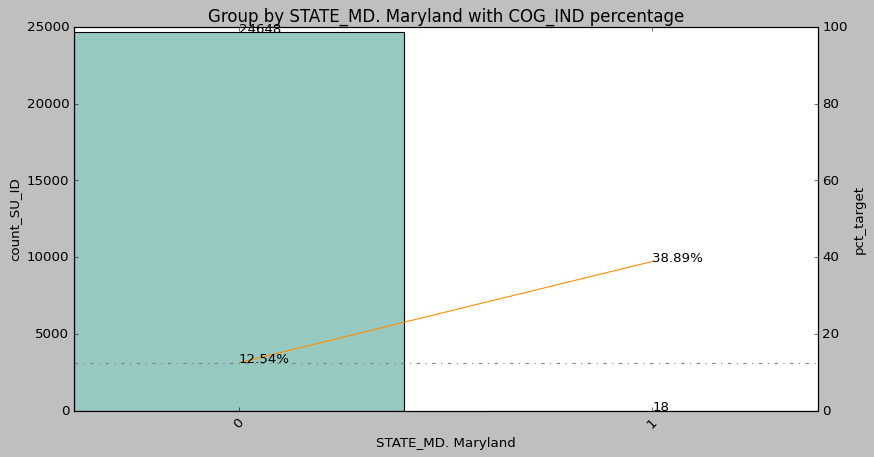

STATE_ME. Maine
 State of residence


,STATE_ME. Maine,count_SU_ID,sum_COG_IND,pct_target
0,0,24655,3091,0.1254
1,1,11,7,0.6364


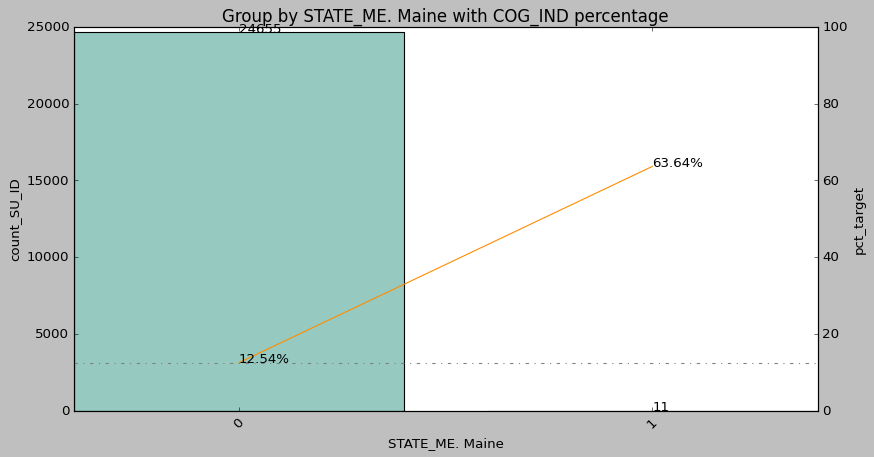

STATE_MI. Michigan
 State of residence


,STATE_MI. Michigan,count_SU_ID,sum_COG_IND,pct_target
0,0,24617,3085,0.1253
1,1,49,13,0.2653


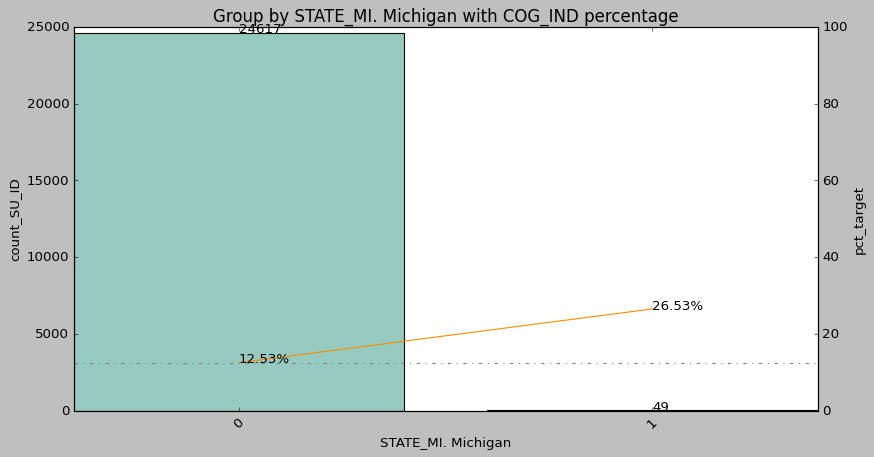

STATE_MN. Minnesota
 State of residence


,STATE_MN. Minnesota,count_SU_ID,sum_COG_IND,pct_target
0,0,24643,3087,0.1253
1,1,23,11,0.4783


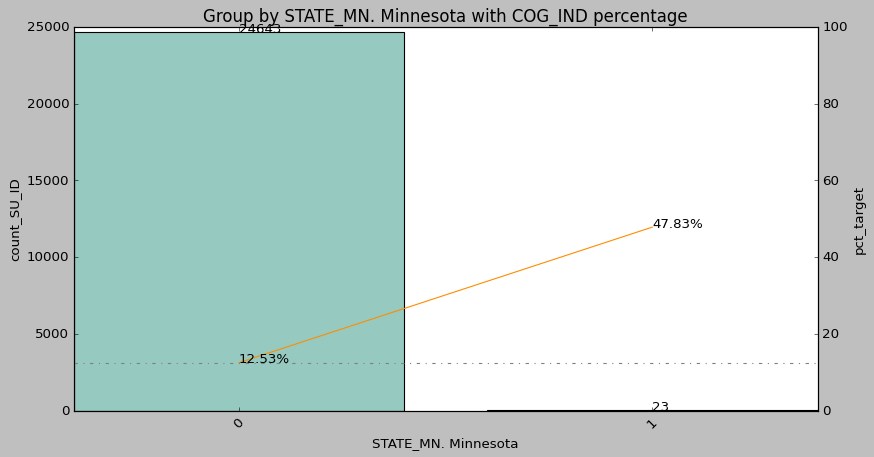

STATE_MO. Missouri
 State of residence


,STATE_MO. Missouri,count_SU_ID,sum_COG_IND,pct_target
0,0,24634,3083,0.1252
1,1,32,15,0.4688


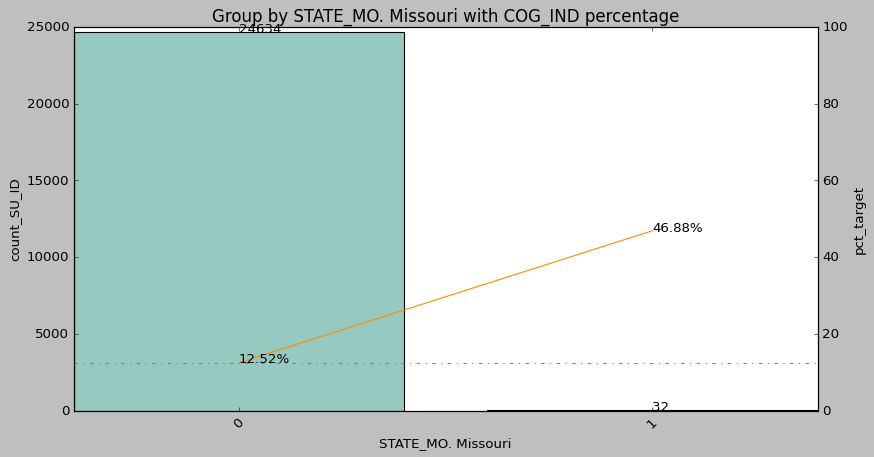

STATE_MS. Mississippi
 State of residence


,STATE_MS. Mississippi,count_SU_ID,sum_COG_IND,pct_target
0,0,24655,3094,0.1255
1,1,11,4,0.3636


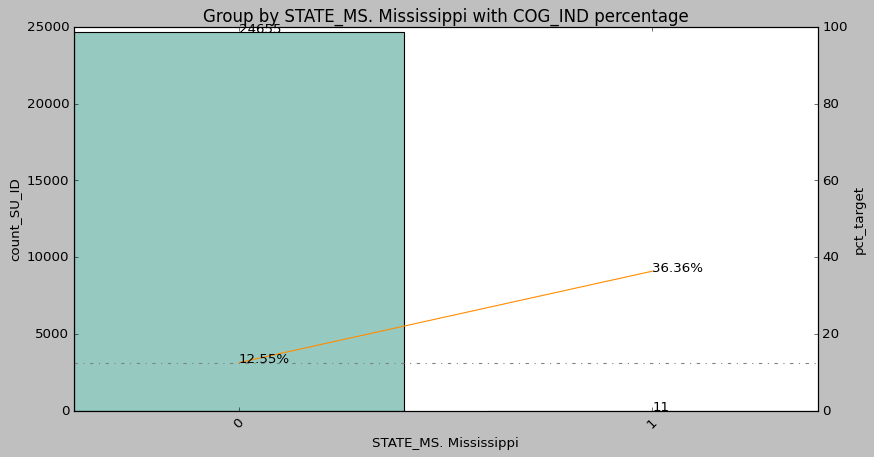

STATE_MT. Montana
 State of residence


,STATE_MT. Montana,count_SU_ID,sum_COG_IND,pct_target
0,0,24662,3096,0.1255
1,1,4,2,0.5000


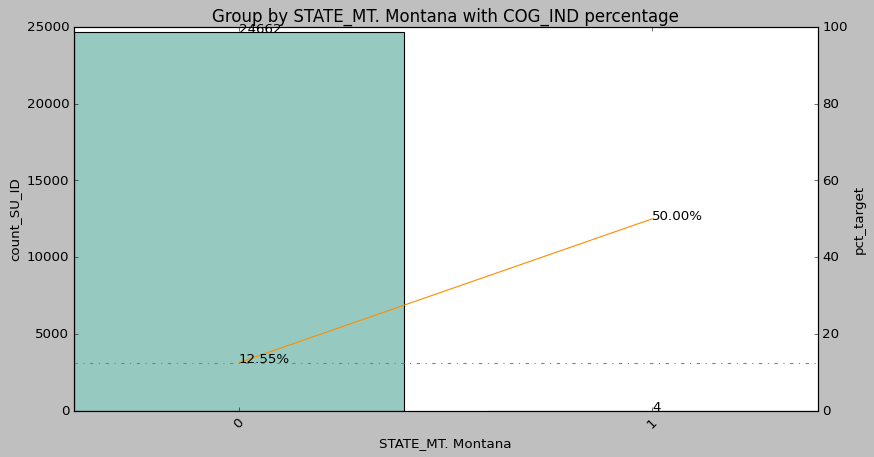

STATE_NC. North Carolina
 State of residence


,STATE_NC. North Carolina,count_SU_ID,sum_COG_IND,pct_target
0,0,24635,3081,0.1251
1,1,31,17,0.5484


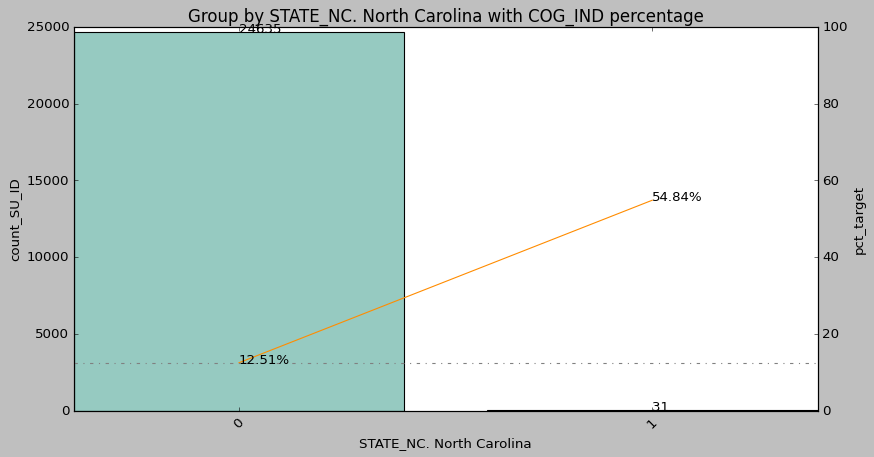

STATE_ND. North Dakota
 State of residence


,STATE_ND. North Dakota,count_SU_ID,sum_COG_IND,pct_target
0,0,24663,3095,0.1255
1,1,3,3,1.0000


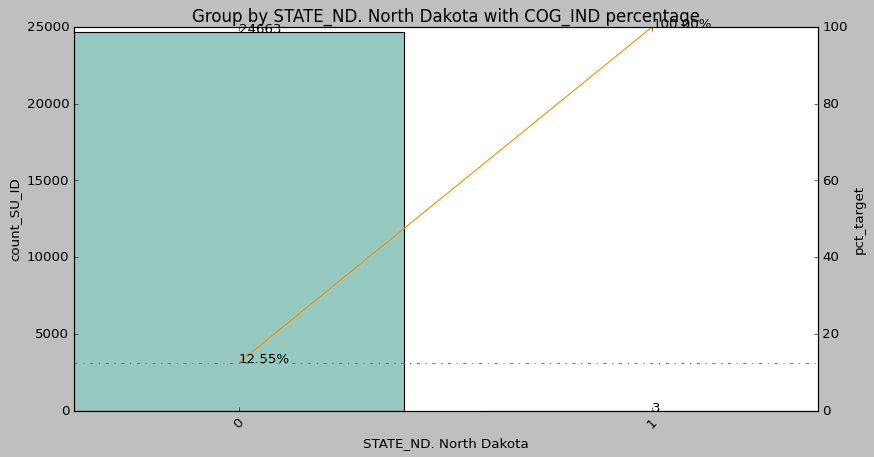

STATE_NE. Nebraska
 State of residence


,STATE_NE. Nebraska,count_SU_ID,sum_COG_IND,pct_target
0,0,24651,3090,0.1253
1,1,15,8,0.5333


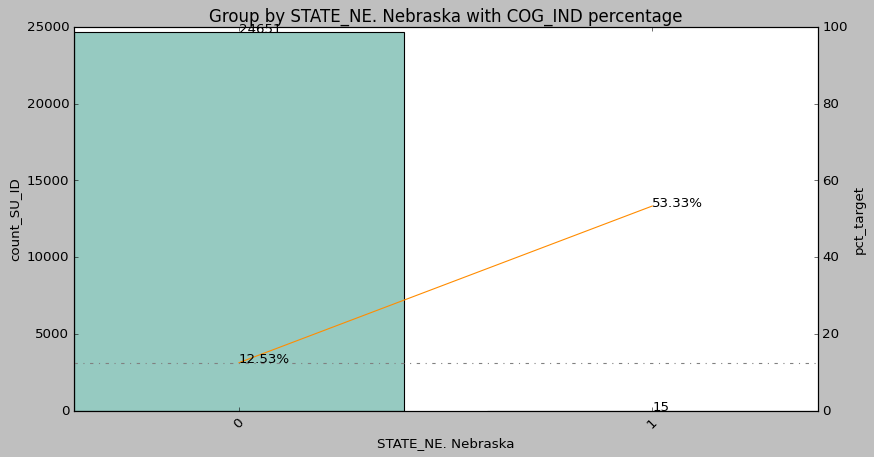

STATE_NH. New Hampshire
 State of residence


,STATE_NH. New Hampshire,count_SU_ID,sum_COG_IND,pct_target
0,0,24661,3096,0.1255
1,1,5,2,0.4000


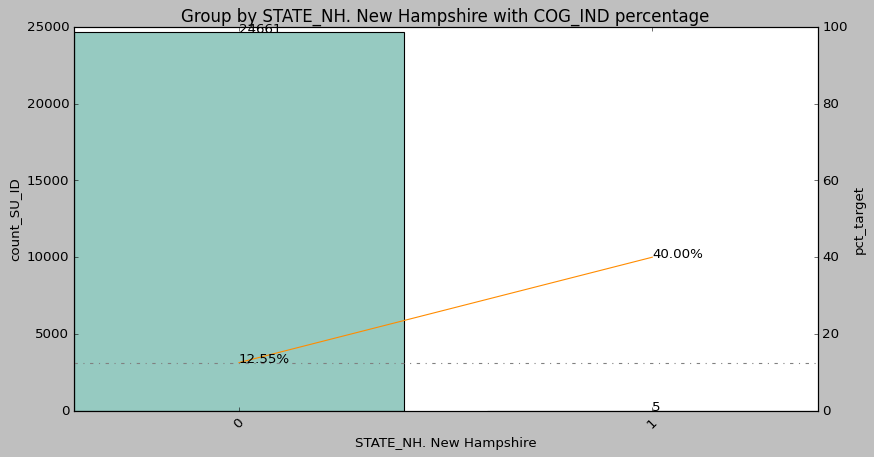

STATE_NJ. New Jersey
 State of residence


,STATE_NJ. New Jersey,count_SU_ID,sum_COG_IND,pct_target
0,0,24640,3086,0.1252
1,1,26,12,0.4615


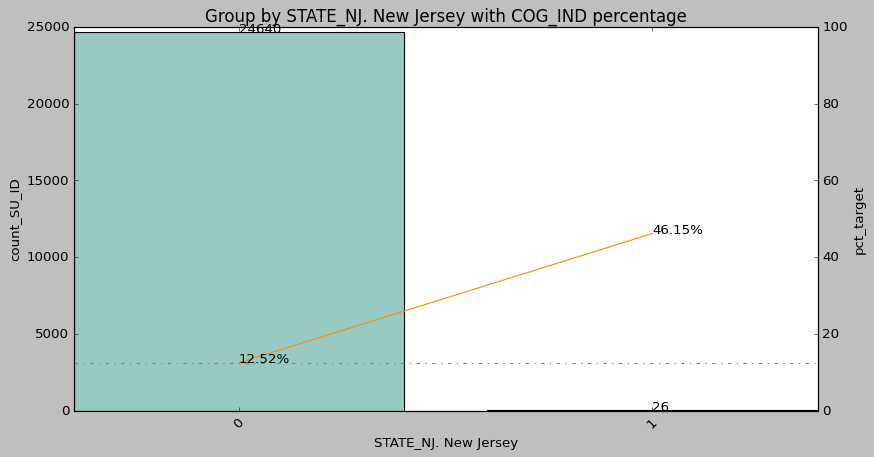

STATE_NM. New Mexico
 State of residence


,STATE_NM. New Mexico,count_SU_ID,sum_COG_IND,pct_target
0,0,24658,3097,0.1256
1,1,8,1,0.1250


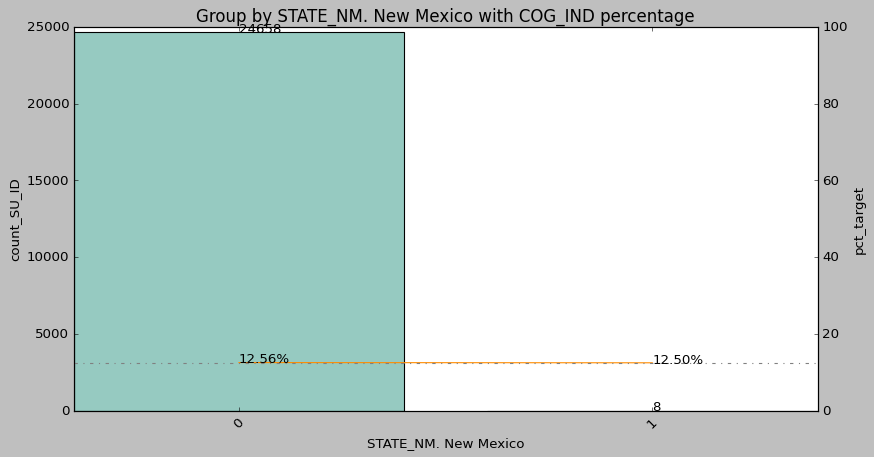

STATE_NV. Nevada
 State of residence


,STATE_NV. Nevada,count_SU_ID,sum_COG_IND,pct_target
0,0,24655,3089,0.1253
1,1,11,9,0.8182


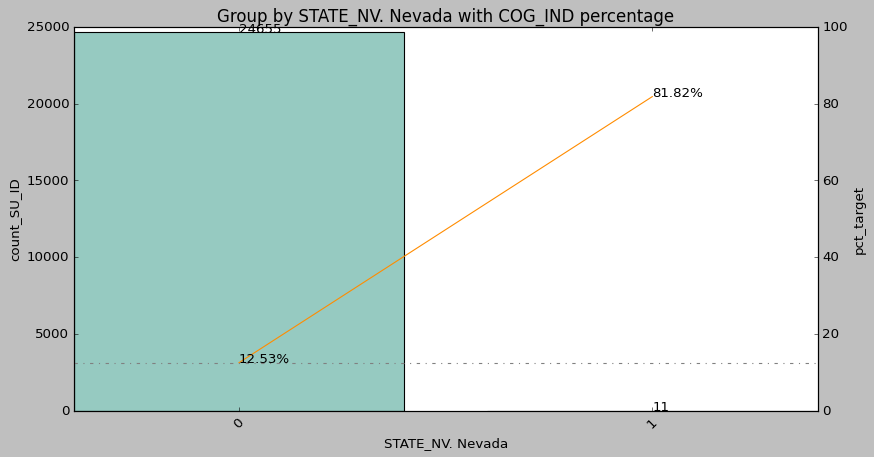

STATE_NY. New York
 State of residence


,STATE_NY. New York,count_SU_ID,sum_COG_IND,pct_target
0,0,24608,3076,0.1250
1,1,58,22,0.3793


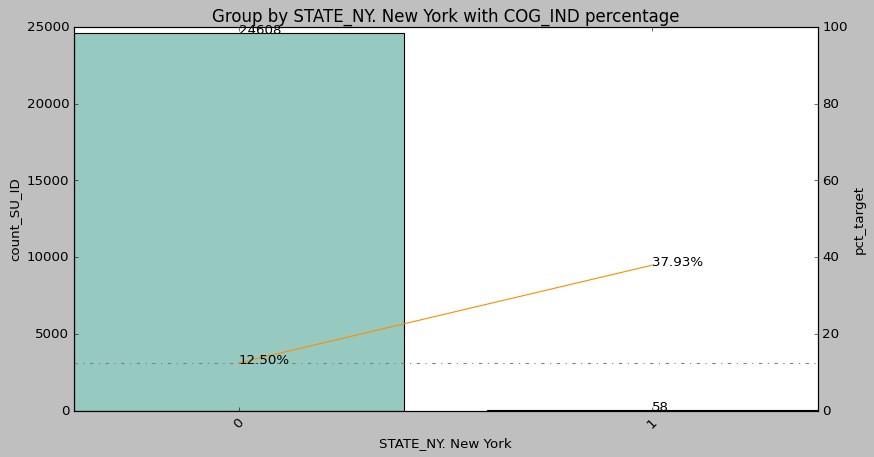

STATE_OH. Ohio
 State of residence


,STATE_OH. Ohio,count_SU_ID,sum_COG_IND,pct_target
0,0,24627,3076,0.1249
1,1,39,22,0.5641


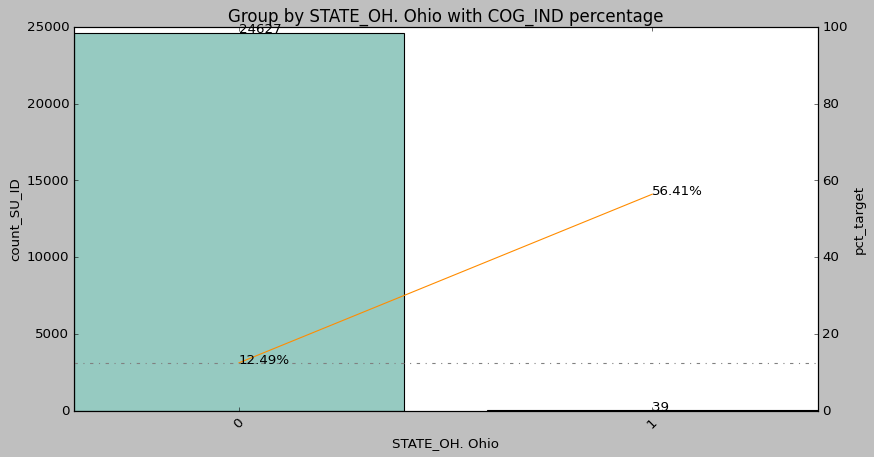

STATE_OK. Oklahoma
 State of residence


,STATE_OK. Oklahoma,count_SU_ID,sum_COG_IND,pct_target
0,0,24652,3088,0.1253
1,1,14,10,0.7143


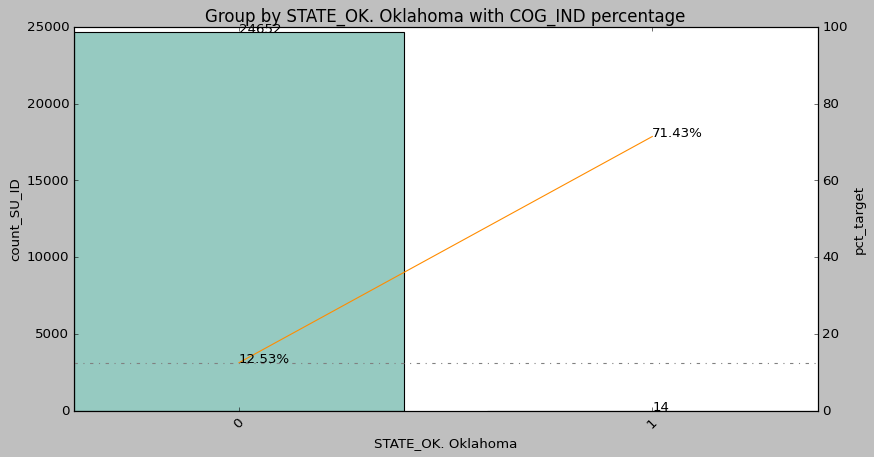

STATE_OR. Oregon
 State of residence


,STATE_OR. Oregon,count_SU_ID,sum_COG_IND,pct_target
0,0,24647,3092,0.1255
1,1,19,6,0.3158


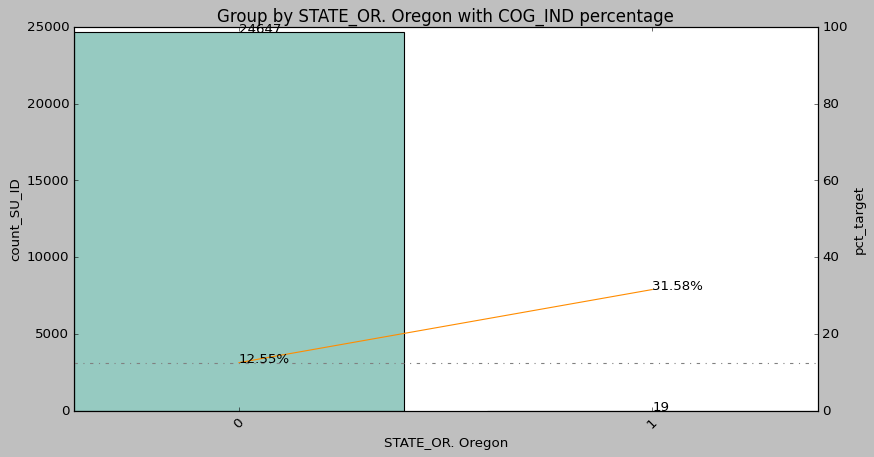

STATE_PA. Pennsylvania
 State of residence


,STATE_PA. Pennsylvania,count_SU_ID,sum_COG_IND,pct_target
0,0,24630,3083,0.1252
1,1,36,15,0.4167


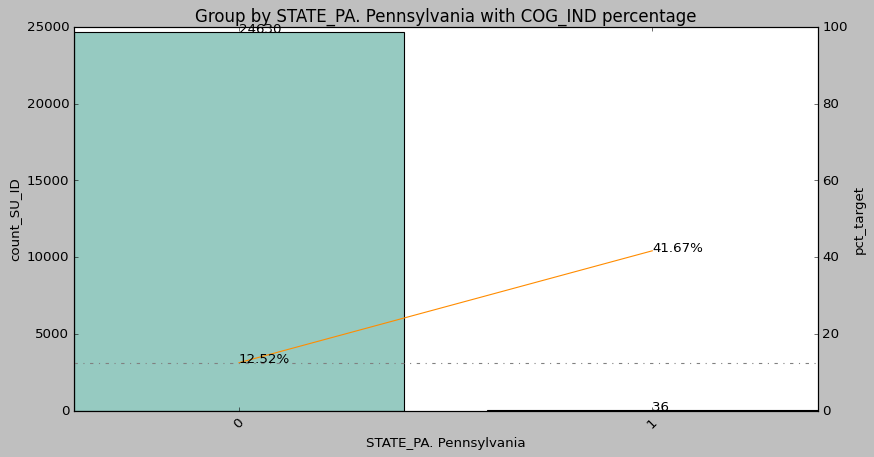

STATE_RI. Rhode Island
 State of residence


,STATE_RI. Rhode Island,count_SU_ID,sum_COG_IND,pct_target
0,0,24665,3098,0.1256
1,1,1,0,0.0000


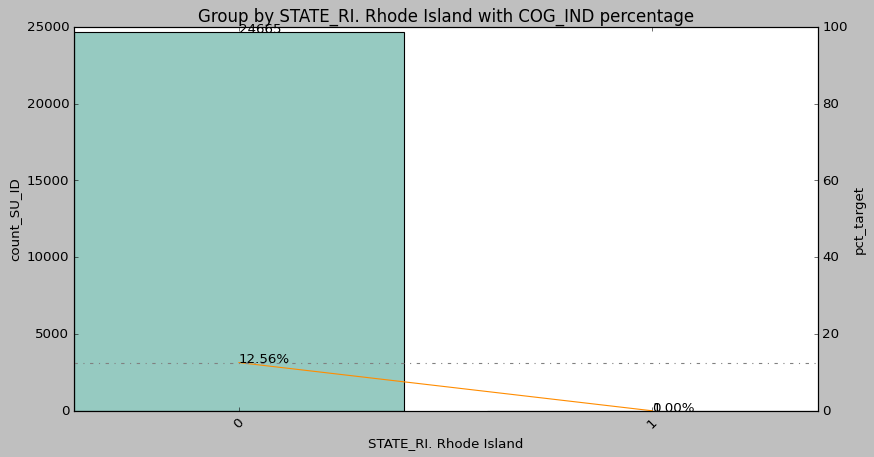

STATE_SC. South Carolina
 State of residence


,STATE_SC. South Carolina,count_SU_ID,sum_COG_IND,pct_target
0,0,24646,3091,0.1254
1,1,20,7,0.3500


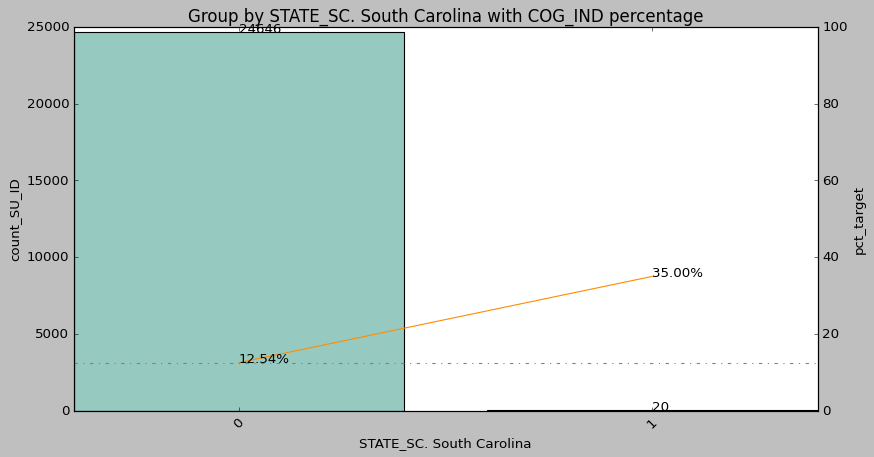

STATE_SD. South Dakota
 State of residence


,STATE_SD. South Dakota,count_SU_ID,sum_COG_IND,pct_target
0,0,24658,3094,0.1255
1,1,8,4,0.5000


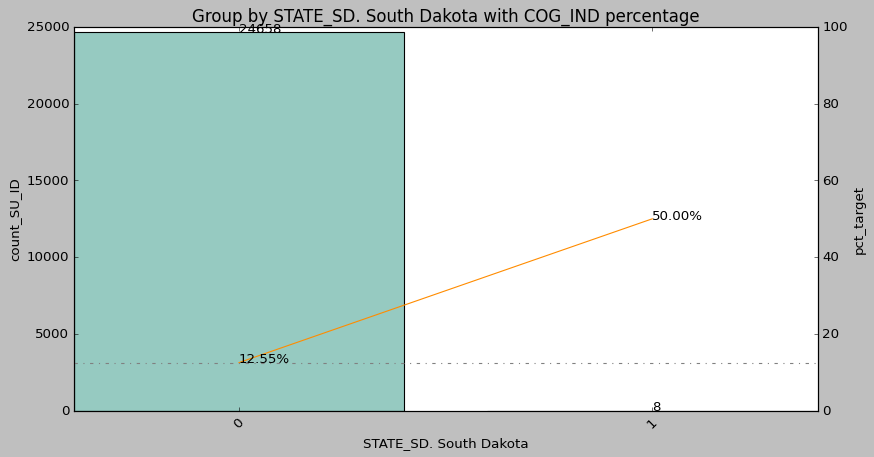

STATE_TN. Tennessee
 State of residence


,STATE_TN. Tennessee,count_SU_ID,sum_COG_IND,pct_target
0,0,24641,3086,0.1252
1,1,25,12,0.4800


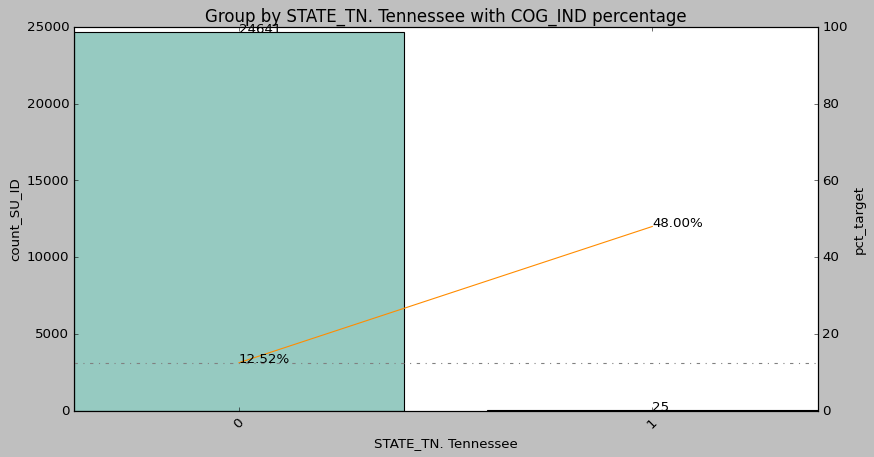

STATE_TX. Texas
 State of residence


,STATE_TX. Texas,count_SU_ID,sum_COG_IND,pct_target
0,0,24578,3047,0.1240
1,1,88,51,0.5795


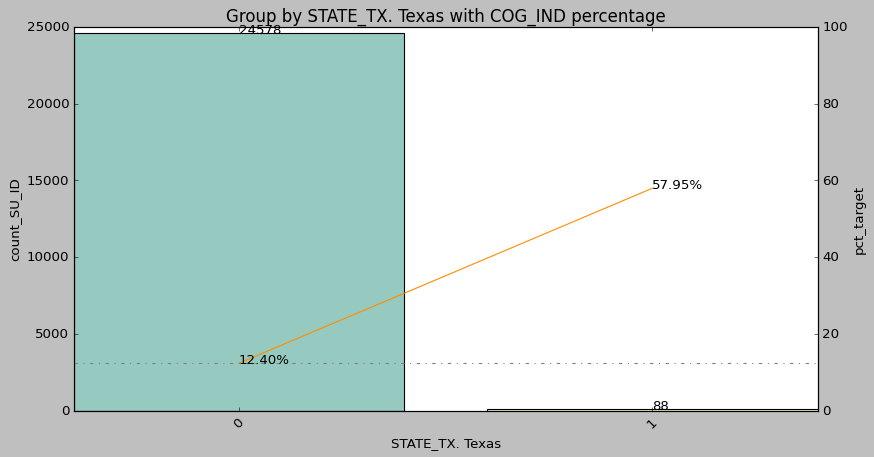

STATE_UT. Utah
 State of residence


,STATE_UT. Utah,count_SU_ID,sum_COG_IND,pct_target
0,0,24659,3097,0.1256
1,1,7,1,0.1429


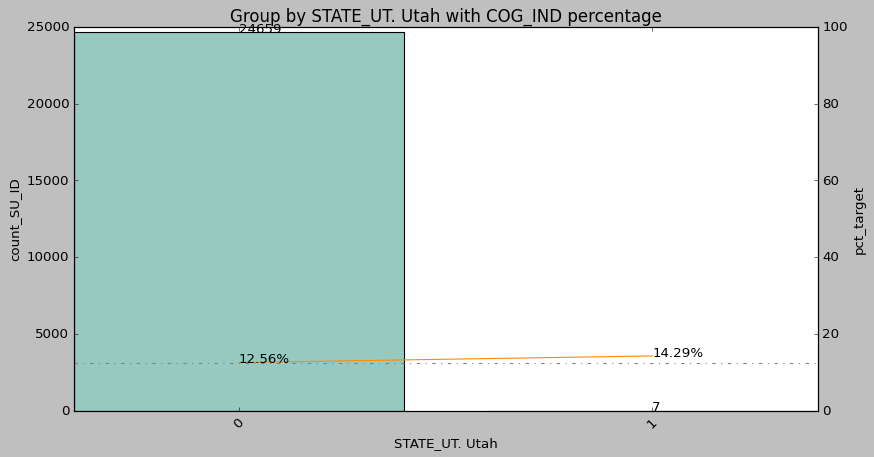

STATE_VA. Virginia
 State of residence


,STATE_VA. Virginia,count_SU_ID,sum_COG_IND,pct_target
0,0,24639,3084,0.1252
1,1,27,14,0.5185


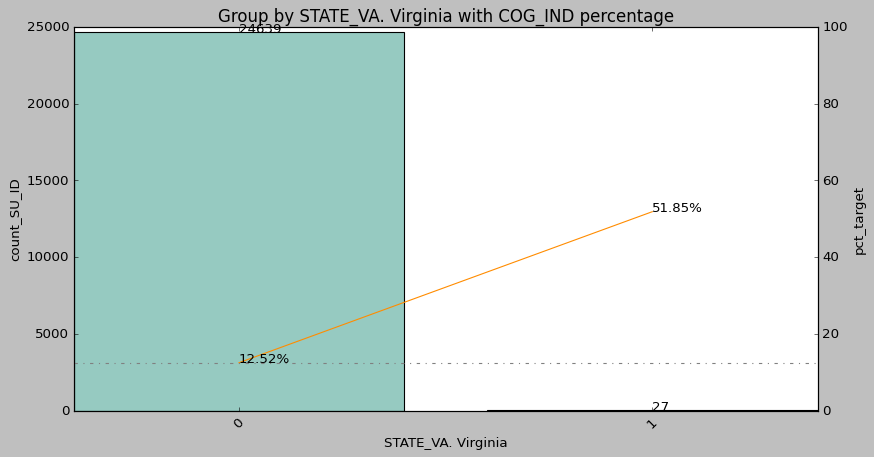

STATE_VT. Vermont
 State of residence


,STATE_VT. Vermont,count_SU_ID,sum_COG_IND,pct_target
0,0,24664,3096,0.1255
1,1,2,2,1.0000


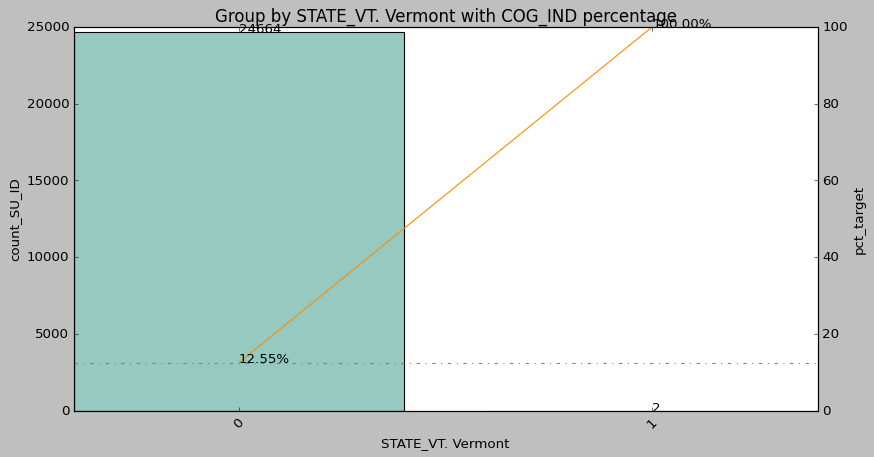

STATE_WA. Washington
 State of residence


,STATE_WA. Washington,count_SU_ID,sum_COG_IND,pct_target
0,0,24641,3081,0.125
1,1,25,17,0.680


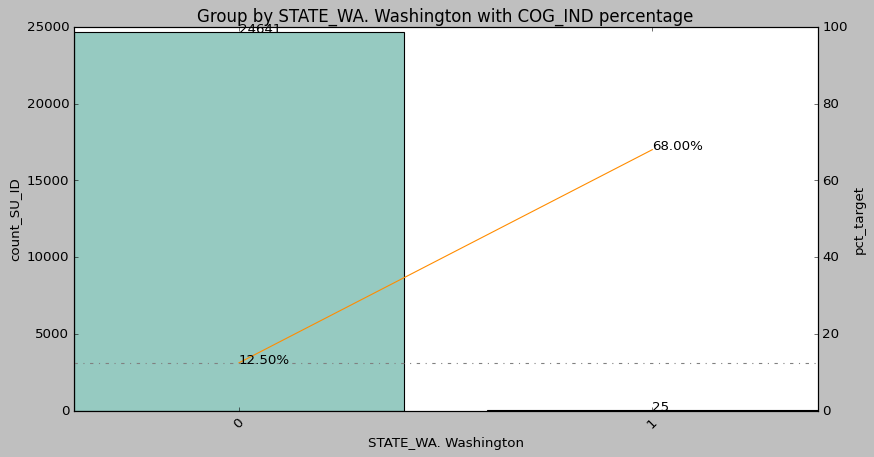

STATE_WI. Wisconsin
 State of residence


,STATE_WI. Wisconsin,count_SU_ID,sum_COG_IND,pct_target
0,0,24638,3082,0.1251
1,1,28,16,0.5714


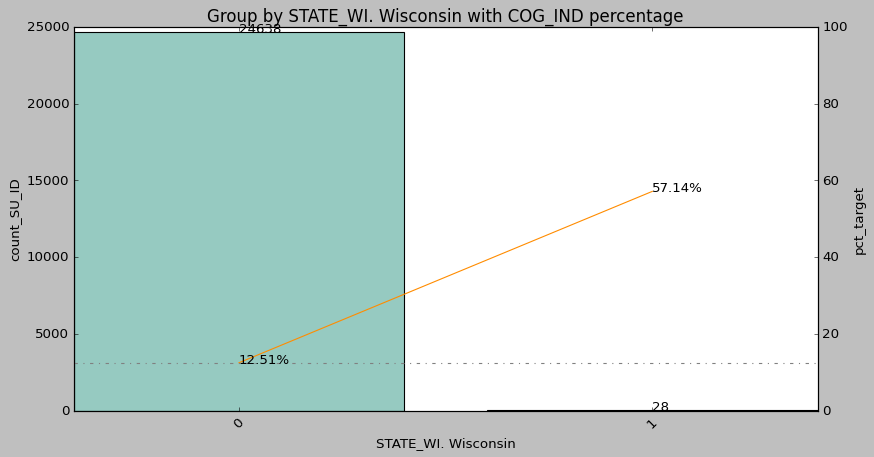

STATE_WV. West Virginia
 State of residence


,STATE_WV. West Virginia,count_SU_ID,sum_COG_IND,pct_target
0,0,24660,3095,0.1255
1,1,6,3,0.5000


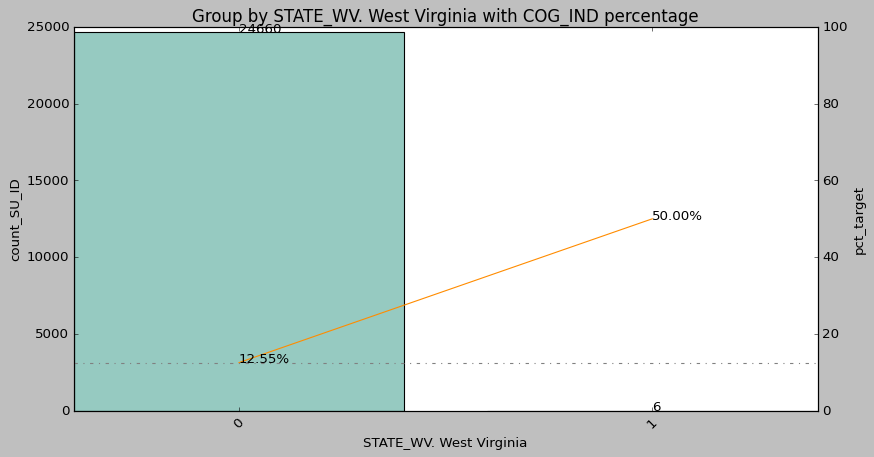

STATE_WY. Wyoming
 State of residence


,STATE_WY. Wyoming,count_SU_ID,sum_COG_IND,pct_target
0,0,24662,3096,0.1255
1,1,4,2,0.5000


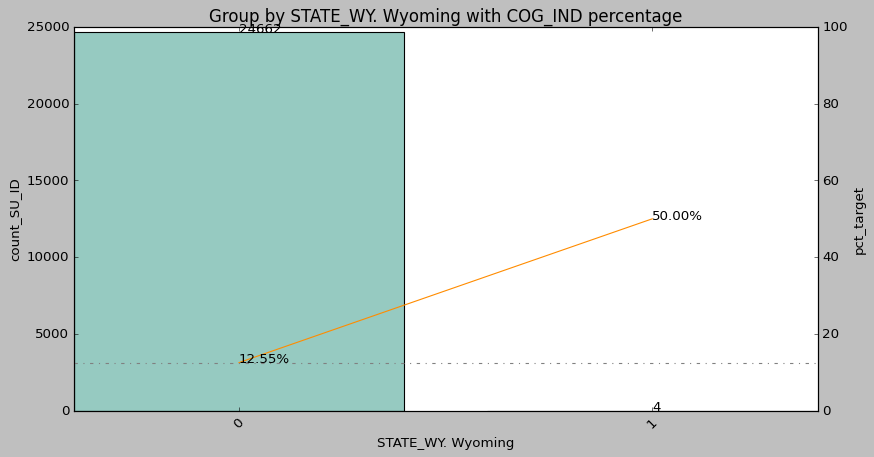

CENSUS_REGION_(3) South
CENSUS_REGION_(4) West


In [107]:
bin = None
for i in df.columns:
    if (df[i].nunique()==2) & (i != 'COG_IND'):
        try:
            print(i)
            i_t = i.split('_')[0]
            print(data_dict[data_dict['Variable']==i_t]['Label'].values[0].split(':')[1].split(']')[0].replace(' [', ''))
            plot_cnt(df, 'SU_ID', i, 'COG_IND', bin)
        except:
            a=0

Short-term stays for rehabilitation before moving home


,LTC8A_(3) Moderately concerned,count_SU_ID,sum_COG_IND,pct_target
0,0,23541,2580,0.1096
1,1,1125,518,0.4604


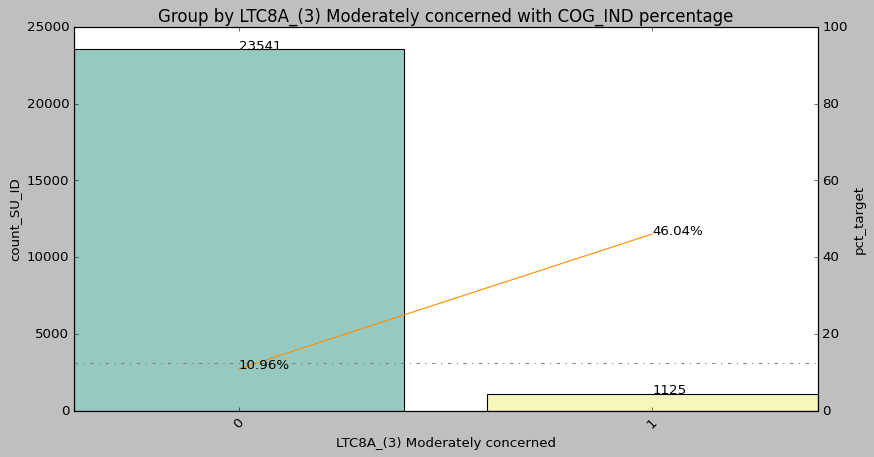

In [110]:
i = 'LTC8A_(3) Moderately concerned'
i_t = i.split('_')[0]
print(data_dict[data_dict['Variable']==i_t]['Label'].values[0].split(':')[1].split(']')[0].replace(' [', ''))
plot_cnt(df, 'SU_ID', i, 'COG_IND', bin)

KeyError: 'Taken_product'

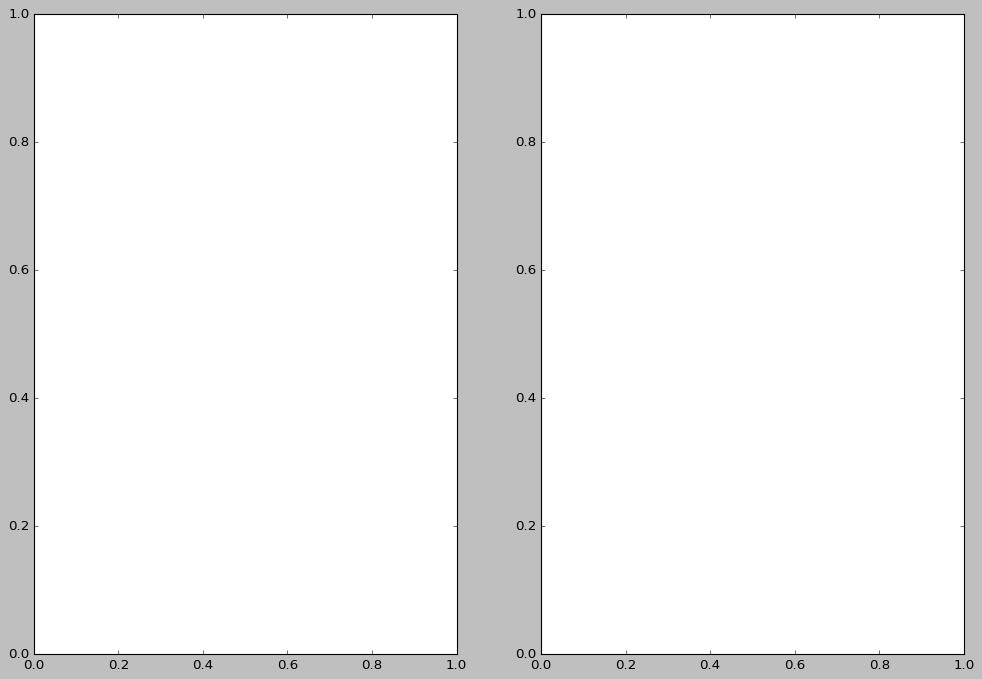

In [52]:
f,ax=plt.subplots(1,2,figsize=(15,10))
SMD['Taken_product'][SMD['Preferred_location_type']=='Financial'].value_counts().plot.pie(colors = ['#2554C7','#50EBEC'], autopct='%1.2f%%',ax=ax[0],textprops={'fontsize': 20},shadow=True)
SMD['Taken_product'][SMD['Preferred_location_type']=='Historical site'].value_counts().plot.pie(colors = ['#2554C7','#50EBEC'], autopct='%1.2f%%',ax=ax[1],textprops={'fontsize': 20},shadow=True)
ax[0].set_title('% of people that have Financial as Preferred location type and bought Product', fontsize=13)
ax[1].set_title('% of people that have Historical site as Preferred location type and bought Product', fontsize=13)
ax[0].set_ylabel('Taken_product', fontsize=18)
ax[1].set_ylabel('Taken_product', fontsize=18)
plt.tight_layout()
plt.show()

f,ax=plt.subplots(1,2,figsize=(15,10))
SMD['Taken_product'][SMD['Preferred_location_type']=='Beach'].value_counts().plot.pie(colors = ['#2554C7','#50EBEC'], autopct='%1.2f%%',ax=ax[0],textprops={'fontsize': 20},shadow=True)
SMD['Taken_product'][SMD['Preferred_location_type']=='Medical'].value_counts().plot.pie(colors = ['#2554C7','#50EBEC'], autopct='%1.2f%%',ax=ax[1],textprops={'fontsize': 20},shadow=True)
ax[0].set_title('% of people that have Beach as Preferred location type and bought Product', fontsize=13)
ax[1].set_title('% of people that have Medical as Preferred location type and bought Product', fontsize=13)
ax[0].set_ylabel('Taken_product', fontsize=18)
ax[1].set_ylabel('Taken_product', fontsize=18)
plt.tight_layout()
plt.show()

In [ ]:
df['COG_IND']

In [ ]:
df = SMD.copy()
df['COG_IND'] = df['COG_IND'].astype(float)
df['COG_IND'] = df['COG_IND'].astype(int)
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

cat_cols = categorical_columns
df[cat_cols] = df[cat_cols].astype("category")
df = pd.get_dummies(df, columns = cat_cols, drop_first=True)
df['SUID'] = df.index

In [ ]:
df.columns

In [ ]:
df_copy = df.copy()
col_plot = 'LTC1A_(3) A moderate amount'
col_target = 'COG_IND'
col_id = 'SUID'
df_p = df_copy.groupby([col_plot], dropna=False).agg({col_id:'count', col_target:'sum'}).reset_index()
df_p['pct_target'] = round(df_p[col_target] / df_p[col_id], 4)
df['col_plot'] = df_p[col_plot].astype(str)

count_col_id = 'count_'+col_id
sum_col_target = 'sum_'+col_target
df_p.columns = [col_plot, count_col_id, sum_col_target, 'pct_target']
display(df_p)

#plot
fig, ax1 = plt.subplots(figsize = (12, 6))
plt.title('Group by {} with {} percentage'.format(col_plot, col_target), size=15)
plt.xticks(rotation=45)
#bar with counts
sns.barplot(x=col_plot, y=count_col_id, data=df_p, palette='Set3')

ax2 = ax1.twinx()
sns.lineplot(x=col_plot, y='pct_target', data=df_p, color='darkorange')

benchmark = (df_copy[col_target]==1).sum()/df_copy.shape[0]

ax2.set_ylim([0, 1])
ax2.set_yticklabels(range(0, 120, 20))

# add text
ax2.axhline(benchmark, color='gray', linestyle='-.')
for x, m, z in zip(df_p[col_plot], df_p['pct_target'], df_p[count_col_id]):
    ax2.text(x,m,f'{m*100:.2f}%')
    ax1.text(x,z,f'{z}')
    
plt.show()

### Feature selection

In [62]:
def get_features_cross_validation(cross_validator, X, y, list_of_selector):
    print('get_features_cross_validation...')
    dict_cv_features = {}
    dict_inter = {}
    dict_union = {}
    dict_comb  = {}

    try:
        for i, (train, test) in enumerate(cross_validator.split(X, y)):
            X_train, y_train, X_test, y_test = X.iloc[train, :], y[train], X.iloc[test], y[test]
            dict_all_selector_features = get_all_selector_feature(list_of_selector, X_train, y_train, X_test, y_test)
            dict_cv_features[i] = dict_all_selector_features
            dict_inter[i] = set.intersection(*(set(val) for val in dict_all_selector_features.values()))
            dict_union[i] = set.union(*(set(val) for val in dict_all_selector_features.values()))

        dict_comb['inter_inter'] = list(set.intersection(*(set(val) for val in dict_inter.values())))
        dict_comb['union_union'] = list(set.union(*(set(val) for val in dict_union.values())))
        dict_comb['inter_union'] = list(set.intersection(*(set(val) for val in dict_union.values())))
        dict_comb['union_inter'] = list(set.union(*(set(val) for val in dict_inter.values())))
        print("successfully get features from cross validator")
    except Exception as e:
        print(str(e))

def initiate_cross_validator(cv_name, **param_dict):
    print('initiate_cross_validator...')
    try:
        if not param_dict:
            print('no parameter given, set default')
            param_dict = {'n_splits': 5}
            
        if cv_name.lower() == 'kfold':
            validator = KFold(**param_dict)
            
        elif cv_name.lower() == 'stratifiedkfold':
            validator = StratifiedKFold(**param_dict)
            
        elif cv_name.lower() == 'stratifiedshufflesplit':
            validator = StratifiedShuffleSplit(**param_dict)            
            
        elif cv_name.lower() == 'groupshufflesplit':
            validator = GroupShuffleSplit(**param_dict)                        
        else:
            print("No cross validator has initiated")
            
        print('Sucessfully initiated cross validator : {} = {} '. format(type(validator).__name__, param_dict))
        
        return validator
    
    except BaseException as e:
        print(f'Fail to initiate Cross validator ! due to = {e}')
              
def get_all_selector_feature(list_selector_name, X_train, y_train, X_test, y_test):
    print('get_all_selector_feature...')
    try:
        dict_all = {}
        for s_name in list_selector_name:
            if s_name == 'sfm_prefit':
                dict_s_f = get_selector_feature_sfm_prefit(X_train, y_train, X_test, y_test)
            else:
                dict_s_f = get_selector_feature(X_train, y_train, s_name)
            
            dict_all = {**dict_all, **dict_s_f}
        
        print('Successfully get all selector feature: {}'.format(list_selector_name))
        return dict_all
    except:
        print('Fail to get all selector features!')


def get_selector_feature_smf_prefit(X_train, y_train, X_test, y_test):
    print('get_selector_feature_smf_prefit...')
    try:
        model_param_dict = {'objective': 'binary:logistic', 'eval_metric': 'mlogloss', 'random_state': 42}
        clf = initiate_classifier('xgb', **model_param_dict)
        xgb_model, _, _ - fit_predict_model(clf, X_train, y_train, X_test)
        
        sorted_idx = xgb_model.feature_importances_.argsort()
        imp_sorted = xgb_model.feature_importances_[sorted_idx]
        ft_sorted = np.array(X_train.columns)[sorted_idx]
        lift_ft_imp_sorted = list(zip(ft_sorted, imp_sorted))
        
        list_auc = []
        list_n_f = []
        list_f  = []
        dict_selector_feture = {}
        
        i = 20
        imp_init_i = imp_sorted[-i]
        for tup in list_ft_imp_sorted:
            feature = tup[0]
            imp = tup[1]
            
            if imp < imp_init_i or imp == 0:
                continue
                
            selector = SelectFromModel(xgb_model, threshold=imp, prefit=True)
            X_train_select = selector.transform(X_train)
            model_select = initiate_classifier('xgb', **model_param_dict)
            model_select.fit(X_train_select, y_train)
            
            X_test_select = selector.transform(X_test)
            y_pred_select = model_select.predict_proba(X_test_select)
            auc_select = metircs.roc_auc_score(y_test, y_pred_select[:, 1])
            
            list_auc.append(auc_select)
            list_n_f.append(('{}={}'.format(X_train_select.shape[1], feature)))
            list_f.apped(feature)
            
        list_auc.reverse()
        list_n_f.reverse()
        list_f.reverse()
        dict_selector_feature['sfm_prefit'] = list_f
        # plot
        plt.figure(figsize=(15, 8))
        plit.xticks(rotation=45, ha='right')
        plt.title('SFM AUC by feature importace ', size=15)
        plt.plot(list_n_f, list_auc)
        
        return dict_selector_feature
    except BaseException as e:
        print(e)


def get_selector_feature(X_train, y_train, selector_name, **param_dict):
    print('get_selector_feature...')
    try:
        selector = initiate_feature_selector(selector_name, **param_dict)
        selector = selector.fit(X_train, y_train)
        dict_selector_feature = {}
        dict_selector_feature[selector_name] = selector.get_feature_names_out().tolist()
        print('Successfully get selector feature from {}'.format(selector_name))
        return dict_selector_name
    except:
        print('Fail to get selector features !')

def initiate_feature_selector(selector_name, **param_dict):
    print('initiate_feature_selector...')
    try:
        if len(param_dict) == 0:
            param_dict = {'k': 20}
        else:
            model_param_dict = {'objective': 'binary:logistic', 'eval_metric': 'mlogloss', 'random_state': 42}
            clf = initiate_classifier('xgb', **model_param_dict)
            
            if selector_name.lower() == 'rfe':
                param_dict = {'estimator': clf, 'n_features_to_select': 20, 'step':1, 'importance_getter': 'feature_importances_'}
            elif selector_name.lower()== 'sfm':
                param_dict = {'estimator': clf, 'importance_getter': 'feature_importances_'}
                
        if selector_name.lower() == 'kbest':
            selector = SelectKBest(mutual_info_classif, **param_dict)
        elif slector_name.lower() == 'rfe':
            selector = RFE(**param_dict)
        elif slector_name.lower() == 'sfm':
            selector = SelectFromModel(**param_dict)
        else:
            print('No feature selector has initiated !')
        
        print('Sucessfully initate feature selector: {}'.format(type(selector).__name__))
        return selector

    except:
        print('Fail to feature selector!')
        
def initiate_classifier(classifier_name, **param_dict):
    print('initiate_classifier...')
    try:
        if classifier_name.lower() == 'randomforest':
            clf = RandomForestClassifier(**param_dict)
        elif classifier_name.lower() == 'xgb':
            if len(param_dict) == 0:
                param_dict = {'objective': 'binary:logistic', 'eval_metric': 'mlogloss',
                              'use_label_encoder': False, 'random_state': 42}
            clf = xgb.XGBClassifier(**param_dict)
            
        elif classifier_name.lower() == 'gb':
            clf = GradientBoostingClassifier(**param_dict)
        else:
            print('No classifier has initiated')
            
        print('Successfully initiated classifier = {}'.format(type(clf).__name__))
        return clf
    except:
        print('Fail to initiate classifier!')


In [56]:
from sklearn.model_selection import KFold, StratifiedKFold, GroupShuffleSplit, StratifiedShuffleSplit, train_test_split,GridSearchCV
from sklearn.feature_selection import SelectKBest, mutual_info_classif, RFE, SelectFromModel

In [65]:
LTC_cols[:5]

['LTC1A_(3) A moderate amount',
 'LTC1A_(4) Only a little',
 'LTC1A_(5) None at all',
 "LTC1A_(99) DON'T KNOW/SKIPPED ON WEB/REFUSED (VOL)",
 'LTC1B_(3) A moderate amount']

In [93]:
LTC_cols = [x for x in df.columns if 'LTC' in x]
X = df[LTC_cols[:5]].copy()

y = df[['COG_IND']].copy()

for i in X.columns:
    X[i] = X[i].astype(int)
y['COG_IND'] = y['COG_IND'].astype(int)
X = X.reset_index(drop=True)
y = y.reset_index(drop=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30 , random_state=42)

In [95]:
param_dict_cv = {'n_splits': 5, 'shuffle': True, 'random_state': 1}
cv = initiate_cross_validator('stratifiedkfold', **param_dict_cv)

dict_cv_features, dict_comb = get_features_cross_validation(cv, X_train, y_train, ['rfe', 'smf'])

initiate_cross_validator...
Sucessfully initiated cross validator : StratifiedKFold = {'n_splits': 5, 'shuffle': True, 'random_state': 1} 
get_features_cross_validation...
"None of [Int64Index([    0,     1,     4,     5,     6,     8,     9,    10,    12,\n               13,\n            ...\n            17252, 17253, 17254, 17256, 17258, 17259, 17261, 17262, 17263,\n            17265],\n           dtype='int64', length=13812)] are in the [columns]"


TypeError: cannot unpack non-iterable NoneType object

In [88]:
# X.iloc[train, :]
# y[train]
# X.shape
train
# y.shape
# X.iloc[test]
# y[test]

array([    0,     1,     4, ..., 17262, 17263, 17265])

In [97]:
df.shape

(24666, 246)

In [96]:
X = X_train.copy()
y = y_train.copy()

cross_validator = cv
list_of_selector = ['rfe', 'smf']
print('get_features_cross_validation...')
dict_cv_features = {}
dict_inter = {}
dict_union = {}
dict_comb  = {}
for i, (train, test) in enumerate(cross_validator.split(X, y)):
    X_train, y_train, X_test, y_test = X.iloc[train, :], y[train], X.iloc[test], y[test]
    dict_all_selector_features = get_all_selector_feature(list_of_selector, X_train, y_train, X_test, y_test)
    dict_cv_features[i] = dict_all_selector_features
    dict_inter[i] = set.intersection(*(set(val) for val in dict_all_selector_features.values()))
    dict_union[i] = set.union(*(set(val) for val in dict_all_selector_features.values()))


get_features_cross_validation...


KeyError: "None of [Int64Index([    0,     1,     4,     5,     6,     8,     9,    10,    12,\n               13,\n            ...\n            17252, 17253, 17254, 17256, 17258, 17259, 17261, 17262, 17263,\n            17265],\n           dtype='int64', length=13812)] are in the [columns]"

In [59]:
cv

StratifiedKFold(n_splits=5, random_state=1, shuffle=True)

In [ ]:
for key, v in dect_comb.items():
    print(key, v, '\n')